### Mounting Drive ###

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Installing & Importing module ###

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import urllib.request, json
import os
import numpy as np
from datetime import datetime
import seaborn as sns
import math
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.preprocessing import RobustScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, mean_squared_log_error
from matplotlib.colors import ListedColormap,LinearSegmentedColormap

In [ ]:
pip install --upgrade pip

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 9.0 MB/s eta 0:00:00
  Attempting uninstall: pip
    Found existing installation: pip 23.1.2
    Uninstalling pip-23.1.2:
      Successfully uninstalled pip-23.1.2


In [ ]:
#pip install numpy==1.22

In [ ]:
pip install tensorflow

In [ ]:
pip install keras

In [ ]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Bidirectional, LSTM, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow import keras


### Preprocessing Data ###

In [ ]:
main_path_data = '/content/drive/My Drive/Senior Project/Coding/Data/'

In [ ]:
dry_temp = pd.read_csv(f'{main_path_data}DWT.csv')
humidity = pd.read_csv(f'{main_path_data}Relative_Humidity.csv')
wind_speed = pd.read_csv(f'{main_path_data}Wind_Speed.csv')
wind_direction = pd.read_csv(f'{main_path_data}Wind_Direction.csv')

In [ ]:
dry_temp = dry_temp.iloc[:, 1:11]
dry_temp = dry_temp.melt(id_vars=['Province', 'Date'], var_name='Time', value_name='Temp')
dry_temp['Datetime'] = pd.to_datetime(dry_temp['Date'] + ' ' + dry_temp['Time'].astype(str).str.zfill(4), format='%d-%m-%y %H%M')
dry_temp = dry_temp.drop(['Date', 'Time'], axis=1)
#dry_temp = dry_temp.sort_values(['Province','Datetime']).reset_index(drop=True)
dry_temp

,Province,Temp,Datetime
0,Chiangmai,17.1,2014-01-01 01:00:00
1,Chiangmai,17.5,2014-01-02 01:00:00
2,Chiangmai,18.5,2014-01-03 01:00:00
3,Chiangmai,18.7,2014-01-04 01:00:00
4,Chiangmai,20.1,2014-01-05 01:00:00
...,...,...,...
141235,Phuket,28.5,2023-08-28 22:00:00
141236,Phuket,27.4,2023-08-29 22:00:00
141237,Phuket,28.8,2023-08-30 22:00:00
141238,Phuket,28.4,2023-08-31 22:00:00


In [ ]:
humidity = humidity.iloc[:, 1:11]
humidity = humidity.melt(id_vars=['Province', 'Date'], var_name='Time', value_name='Humidity')
humidity['Datetime'] = pd.to_datetime(humidity['Date'] + ' ' + humidity['Time'].astype(str).str.zfill(4), format='%d-%m-%y %H%M')
humidity = humidity.drop(['Date', 'Time'], axis=1)
data = pd.merge(dry_temp, humidity, on=['Datetime', 'Province'])
data

,Province,Temp,Datetime,Humidity
0,Chiangmai,17.1,2014-01-01 01:00:00,90
1,Chiangmai,17.5,2014-01-02 01:00:00,88
2,Chiangmai,18.5,2014-01-03 01:00:00,90
3,Chiangmai,18.7,2014-01-04 01:00:00,90
4,Chiangmai,20.1,2014-01-05 01:00:00,91
...,...,...,...,...
141235,Phuket,28.5,2023-08-28 22:00:00,85
141236,Phuket,27.4,2023-08-29 22:00:00,92
141237,Phuket,28.8,2023-08-30 22:00:00,82
141238,Phuket,28.4,2023-08-31 22:00:00,81


In [ ]:
data = data.loc[:,['Datetime','Province','Temp','Humidity']]

In [ ]:
wind_speed = wind_speed.iloc[:, 1:11]
wind_speed = wind_speed.melt(id_vars=['Province', 'Date'], var_name='Time', value_name='Wind_Speed')
wind_speed['Datetime'] = pd.to_datetime(wind_speed['Date'] + ' ' + wind_speed['Time'].astype(str).str.zfill(4), format='%d-%m-%y %H%M')
wind_speed = wind_speed.drop(['Date', 'Time'], axis=1)
data = pd.merge(data, wind_speed, on=['Datetime', 'Province'])
data

,Datetime,Province,Temp,Humidity,Wind_Speed
0,2014-01-01 01:00:00,Chiangmai,17.1,90,0
1,2014-01-02 01:00:00,Chiangmai,17.5,88,0
2,2014-01-03 01:00:00,Chiangmai,18.5,90,0
3,2014-01-04 01:00:00,Chiangmai,18.7,90,0
4,2014-01-05 01:00:00,Chiangmai,20.1,91,0
...,...,...,...,...,...
141235,2023-08-28 22:00:00,Phuket,28.5,85,0
141236,2023-08-29 22:00:00,Phuket,27.4,92,0
141237,2023-08-30 22:00:00,Phuket,28.8,82,4
141238,2023-08-31 22:00:00,Phuket,28.4,81,5


In [ ]:
wind_direction = wind_direction.iloc[:, 1:11]
wind_direction = wind_direction.melt(id_vars=['Province', 'Date'], var_name='Time', value_name='Wind_Direct')
wind_direction['Datetime'] = pd.to_datetime(wind_direction['Date'] + ' ' + wind_direction['Time'].astype(str).str.zfill(4), format='%d-%m-%y %H%M')
wind_direction = wind_direction.drop(['Date', 'Time'], axis=1)
data = pd.merge(data, wind_direction, on=['Datetime', 'Province'])
data

,Datetime,Province,Temp,Humidity,Wind_Speed,Wind_Direct
0,2014-01-01 01:00:00,Chiangmai,17.1,90,0,0
1,2014-01-02 01:00:00,Chiangmai,17.5,88,0,0
2,2014-01-03 01:00:00,Chiangmai,18.5,90,0,0
3,2014-01-04 01:00:00,Chiangmai,18.7,90,0,0
4,2014-01-05 01:00:00,Chiangmai,20.1,91,0,0
...,...,...,...,...,...,...
141235,2023-08-28 22:00:00,Phuket,28.5,85,0,0
141236,2023-08-29 22:00:00,Phuket,27.4,92,0,0
141237,2023-08-30 22:00:00,Phuket,28.8,82,4,290
141238,2023-08-31 22:00:00,Phuket,28.4,81,5,290


In [ ]:
data.dtypes

Datetime       datetime64[ns]
Province               object
Temp                   object
Humidity               object
Wind_Speed             object
Wind_Direct            object
dtype: object

In [ ]:
data[data.columns[2:]] = data[data.columns[2:]].apply(pd.to_numeric, errors='coerce')
data.dtypes

Datetime       datetime64[ns]
Province               object
Temp                  float64
Humidity              float64
Wind_Speed            float64
Wind_Direct           float64
dtype: object

In [ ]:
summer_mask = ((data['Datetime'].dt.month == 2) & (data['Datetime'].dt.day > 15)) | ((data['Datetime'].dt.month >= 3) & (data['Datetime'].dt.month <= 4)) | ((data['Datetime'].dt.month == 5) & (data['Datetime'].dt.day <= 15))
rainy_mask = ((data['Datetime'].dt.month == 5) & (data['Datetime'].dt.day > 15)) | ((data['Datetime'].dt.month >= 6) & (data['Datetime'].dt.month <= 9)) | ((data['Datetime'].dt.month == 10) & (data['Datetime'].dt.day <= 15))
winter_mask = ((data['Datetime'].dt.month == 10) & (data['Datetime'].dt.day > 15)) | ((data['Datetime'].dt.month == 11) | (data['Datetime'].dt.month == 12) | (data['Datetime'].dt.month == 1)) | ((data['Datetime'].dt.month == 2) & (data['Datetime'].dt.day <= 15))

In [ ]:
df = data[data['Wind_Direct']>360]
df = df[df.Province == 'Chiangmai']
print('number missing values in summer season:',len(df[summer_mask]))
print('number missing values in rainy season:',len(df[rainy_mask]))
print('number missing values in winter season:',len(df[winter_mask]))
print('number missing values:',len(df))
df

number missing values in summer season: 0
number missing values in rainy season: 38
number missing values in winter season: 0
number missing values: 38


<ipython-input-143-49532da52e5f>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print('number missing values in summer season:',len(df[summer_mask]))
<ipython-input-143-49532da52e5f>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print('number missing values in rainy season:',len(df[rainy_mask]))
<ipython-input-143-49532da52e5f>:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  print('number missing values in winter season:',len(df[winter_mask]))


,Datetime,Province,Temp,Humidity,Wind_Speed,Wind_Direct
501,2015-05-17 01:00:00,Chiangmai,28.1,77.0,0.0,999.0
502,2015-05-18 01:00:00,Chiangmai,28.5,71.0,0.0,999.0
503,2015-05-19 01:00:00,Chiangmai,27.0,79.0,0.0,999.0
504,2015-05-20 01:00:00,Chiangmai,27.1,75.0,0.0,999.0
505,2015-05-21 01:00:00,Chiangmai,25.9,91.0,0.0,999.0
18156,2015-05-17 04:00:00,Chiangmai,27.2,76.0,0.0,999.0
18157,2015-05-18 04:00:00,Chiangmai,26.7,77.0,0.0,999.0
18158,2015-05-19 04:00:00,Chiangmai,27.0,80.0,0.0,999.0
18159,2015-05-20 04:00:00,Chiangmai,26.7,75.0,0.0,999.0
18160,2015-05-21 04:00:00,Chiangmai,25.6,93.0,0.0,999.0


In [ ]:
data[(data['Wind_Direct']>360) | (data['Humidity']<0)]

,Datetime,Province,Temp,Humidity,Wind_Speed,Wind_Direct
501,2015-05-17 01:00:00,Chiangmai,28.1,77.0,0.0,999.0
502,2015-05-18 01:00:00,Chiangmai,28.5,71.0,0.0,999.0
503,2015-05-19 01:00:00,Chiangmai,27.0,79.0,0.0,999.0
504,2015-05-20 01:00:00,Chiangmai,27.1,75.0,0.0,999.0
505,2015-05-21 01:00:00,Chiangmai,25.9,91.0,0.0,999.0
18156,2015-05-17 04:00:00,Chiangmai,27.2,76.0,0.0,999.0
18157,2015-05-18 04:00:00,Chiangmai,26.7,77.0,0.0,999.0
18158,2015-05-19 04:00:00,Chiangmai,27.0,80.0,0.0,999.0
18159,2015-05-20 04:00:00,Chiangmai,26.7,75.0,0.0,999.0
18160,2015-05-21 04:00:00,Chiangmai,25.6,93.0,0.0,999.0


In [ ]:
data.isna().sum()

Datetime         0
Province         0
Temp           178
Humidity       178
Wind_Speed     178
Wind_Direct    178
dtype: int64

In [ ]:
data = data.dropna(subset=data.columns)
data = data[data['Humidity']>=0]
data

,Datetime,Province,Temp,Humidity,Wind_Speed,Wind_Direct
0,2014-01-01 01:00:00,Chiangmai,17.1,90.0,0.0,0.0
1,2014-01-02 01:00:00,Chiangmai,17.5,88.0,0.0,0.0
2,2014-01-03 01:00:00,Chiangmai,18.5,90.0,0.0,0.0
3,2014-01-04 01:00:00,Chiangmai,18.7,90.0,0.0,0.0
4,2014-01-05 01:00:00,Chiangmai,20.1,91.0,0.0,0.0
...,...,...,...,...,...,...
141234,2023-08-27 22:00:00,Phuket,28.5,85.0,0.0,0.0
141235,2023-08-28 22:00:00,Phuket,28.5,85.0,0.0,0.0
141236,2023-08-29 22:00:00,Phuket,27.4,92.0,0.0,0.0
141237,2023-08-30 22:00:00,Phuket,28.8,82.0,4.0,290.0


In [ ]:
data[data['Wind_Direct']>360]

,Datetime,Province,Temp,Humidity,Wind_Speed,Wind_Direct
501,2015-05-17 01:00:00,Chiangmai,28.1,77.0,0.0,999.0
502,2015-05-18 01:00:00,Chiangmai,28.5,71.0,0.0,999.0
503,2015-05-19 01:00:00,Chiangmai,27.0,79.0,0.0,999.0
504,2015-05-20 01:00:00,Chiangmai,27.1,75.0,0.0,999.0
505,2015-05-21 01:00:00,Chiangmai,25.9,91.0,0.0,999.0
18156,2015-05-17 04:00:00,Chiangmai,27.2,76.0,0.0,999.0
18157,2015-05-18 04:00:00,Chiangmai,26.7,77.0,0.0,999.0
18158,2015-05-19 04:00:00,Chiangmai,27.0,80.0,0.0,999.0
18159,2015-05-20 04:00:00,Chiangmai,26.7,75.0,0.0,999.0
18160,2015-05-21 04:00:00,Chiangmai,25.6,93.0,0.0,999.0


In [ ]:
# Calculate Heat Index
c1 = -42.38
c2 = 2.049
c3 = 10.14
c4 = -0.2248
c5 = -6.838 * 10**-3
c6 =-5.482 * 10**-2
c7 = 1.228 * 10**-3
c8 = 8.528 * 10**-4
c9 =-1.99 * 10**-6

data['Temp_F'] = data['Temp'] * 9/5 + 32                           # Change Celcius to Fahrenheit

data['Wind_Speed'] = data['Wind_Speed'] * 0.514444            # Change Knots to m/s
data['Humid'] = data['Humidity']
data['Heat_Index_F'] = (c1 + c2*data['Temp_F'] + c3*data['Humid'] + c4*data['Temp_F'] *data['Humid']
                   + c5*(data['Temp_F'])**2 + c6*(data['Humid'])**2 + c7*data['Humid']*(data['Temp_F'])**2
                   + c8*data['Temp_F']*data['Humid']**2 + c9*((data['Temp_F'])**2)*data['Humid']**2)
data['Heat_Index'] = (data['Heat_Index_F']- 32) * 5/9               # Change back to Celcius
data = data.loc[:, ['Datetime',	'Province',	'Temp',	'Humid',	'Wind_Speed',	'Wind_Direct',	'Heat_Index']]

# Setting Columns in dataset
data = data.dropna(subset=data.columns)
data = data.reset_index(drop=True)

In [ ]:
# Define the bins and labels
bins = [-float('inf'), 27, 32, 41, 54, float('inf')]
labels = ['Normal', 'Caution', 'Extreme Caution', 'Danger', 'Extreme Danger']
labels2 = ['1', '2', '3', '4', '5']

# Create the 'HI_level' column using pd.cut
#data['HI_category'] = pd.cut(data['Heat_Index'], bins=bins, labels=labels, right=False)
data['HI_level'] = pd.cut(data['Heat_Index'], bins=bins, labels=labels2, right=False)

In [ ]:
data.isna().sum()

Datetime       0
Province       0
Temp           0
Humid          0
Wind_Speed     0
Wind_Direct    0
Heat_Index     0
dtype: int64

In [ ]:
data.dtypes

Datetime       datetime64[ns]
Province               object
Temp                  float64
Humid                 float64
Wind_Speed            float64
Wind_Direct           float64
Heat_Index            float64
HI_level             category
dtype: object

In [ ]:
file_path = f'{main_path_data}data.csv'

# Save the DataFrame as a CSV file
data.to_csv(file_path, index=False)

data = pd.read_csv(f'{main_path_data}data.csv')
data['Datetime'] = pd.to_datetime(data['Datetime'])
#data['HI_level'] = data['HI_level'].astype('category')

In [ ]:
data

,Datetime,Province,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
0,2014-01-01 01:00:00,Chiangmai,17.1,90.0,0.000000,0.0,17.459972,1
1,2014-01-02 01:00:00,Chiangmai,17.5,88.0,0.000000,0.0,18.184228,1
2,2014-01-03 01:00:00,Chiangmai,18.5,90.0,0.000000,0.0,17.375620,1
3,2014-01-04 01:00:00,Chiangmai,18.7,90.0,0.000000,0.0,17.414006,1
4,2014-01-05 01:00:00,Chiangmai,20.1,91.0,0.000000,0.0,17.729534,1
...,...,...,...,...,...,...,...,...
141056,2023-08-27 22:00:00,Phuket,28.5,85.0,0.000000,0.0,33.749815,3
141057,2023-08-28 22:00:00,Phuket,28.5,85.0,0.000000,0.0,33.749815,3
141058,2023-08-29 22:00:00,Phuket,27.4,92.0,0.000000,0.0,31.542570,2
141059,2023-08-30 22:00:00,Phuket,28.8,82.0,2.057776,290.0,34.027390,3


In [ ]:
data.describe()

,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
count,141061.000000,141061.000000,141061.000000,141061.000000,141061.000000,141061.000000
mean,28.305849,73.429467,0.883728,95.192945,31.318465,2.253812
std,3.631302,15.263920,1.063464,114.708457,5.503361,0.853105
min,10.000000,11.000000,0.000000,0.000000,12.736389,1.000000
25%,26.000000,63.000000,0.000000,0.000000,27.296443,2.000000
50%,28.100000,75.000000,0.514444,30.000000,31.282456,2.000000
75%,30.700000,86.000000,1.543332,200.000000,35.411002,3.000000
max,42.800000,100.000000,25.722200,999.000000,56.812552,5.000000


In [ ]:
data.dtypes

Datetime       datetime64[ns]
Province               object
Temp                  float64
Humid                 float64
Wind_Speed            float64
Wind_Direct           float64
Heat_Index            float64
HI_level                int64
dtype: object

In [ ]:
data[data['HI_level'].gt(4)]

,Datetime,Province,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
77478,2023-05-21 13:00:00,Nakhon_Ratchasima,39.0,56.0,3.601108,190.0,55.202829,5
97344,2019-11-11 16:00:00,Bangkok,33.2,95.0,0.000000,0.0,56.812552,5


In [ ]:
data

,Datetime,Province,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
0,2014-01-01 01:00:00,Bangkok,21.6,69.0,0.000000,0.0,23.114016,1
1,2014-01-01 04:00:00,Bangkok,20.0,74.0,0.000000,0.0,22.035494,1
2,2014-01-01 07:00:00,Bangkok,19.0,83.0,0.000000,0.0,19.773918,1
3,2014-01-01 10:00:00,Bangkok,24.9,56.0,0.000000,0.0,25.535160,1
4,2014-01-01 13:00:00,Bangkok,29.5,42.0,0.000000,0.0,29.043059,2
...,...,...,...,...,...,...,...,...
46088,2023-02-15 10:00:00,Rayong,25.0,83.0,1.028888,360.0,25.286177,1
46089,2023-02-15 13:00:00,Rayong,24.5,92.0,0.000000,0.0,23.880012,1
46090,2023-02-15 16:00:00,Rayong,25.8,87.0,0.000000,0.0,26.892169,1
46091,2023-02-15 19:00:00,Rayong,25.5,92.0,0.000000,0.0,26.216886,1


In [ ]:
data = data[data.Wind_Direct <= 360]
data = data.reset_index(drop=True)

data.to_csv(f'{main_path_data}data_dropWD_mt360.csv', index=False)

In [ ]:
data['Datetime'] = pd.to_datetime(data['Datetime'])

---
1. **ฤดูร้อน** เริ่มต้นประมาณกลางเดือนกุมภาพันธ์ถึงกลางเดือนพฤษภาคม (02-16 to 05-15)
2. **ฤดูฝน** เริ่มต้นประมาณกลางเดือนพฤษภาคมถึงกลางเดือนตุลาคม (05-16 to 10-15)
3. **ฤดูหนาว** เริ่มต้นประมาณกลางเดือนตุลาคมถึงกลางเดือนกุมภาพันธ์ (10-16 to 02-15)

*ที่มา: https://tmd-dev.azurewebsites.net/info/ฤดูกาลของประเทศไทย*

In [ ]:
summer_mask = ((data['Datetime'].dt.month == 2) & (data['Datetime'].dt.day > 15)) | ((data['Datetime'].dt.month >= 3) & (data['Datetime'].dt.month <= 4)) | ((data['Datetime'].dt.month == 5) & (data['Datetime'].dt.day <= 15))
summer_df = data[summer_mask]
summer_df = summer_df.sort_values(['Province','Datetime'])
summer_df = summer_df.reset_index(drop=True)
summer_df.to_csv(f'{main_path_data}summer_df_dropWD_mt360.csv', index=False)
summer_df

,Datetime,Province,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
0,2014-02-16 01:00:00,Bangkok,26.5,83.0,1.028888,100.0,28.312124,2
1,2014-02-16 04:00:00,Bangkok,26.2,85.0,3.601108,200.0,27.739123,2
2,2014-02-16 07:00:00,Bangkok,26.4,86.0,1.028888,190.0,28.254122,2
3,2014-02-16 10:00:00,Bangkok,29.2,73.0,2.057776,180.0,33.256010,3
4,2014-02-16 13:00:00,Bangkok,31.7,61.0,3.086664,220.0,36.214068,3
...,...,...,...,...,...,...,...,...
35646,2023-05-15 10:00:00,Rayong,31.6,76.0,1.028888,190.0,40.822804,3
35647,2023-05-15 13:00:00,Rayong,33.5,64.0,1.543332,180.0,41.935406,4
35648,2023-05-15 16:00:00,Rayong,33.1,66.0,1.028888,180.0,41.582623,4
35649,2023-05-15 19:00:00,Rayong,30.6,76.0,1.028888,170.0,37.736578,3


In [ ]:
rainy_mask = ((data['Datetime'].dt.month == 5) & (data['Datetime'].dt.day > 15)) | ((data['Datetime'].dt.month >= 6) & (data['Datetime'].dt.month <= 9)) | ((data['Datetime'].dt.month == 10) & (data['Datetime'].dt.day <= 15))
rainy_df = data[rainy_mask]
rainy_df = rainy_df.sort_values(['Province','Datetime'])
rainy_df = rainy_df.reset_index(drop=True)
rainy_df.to_csv(f'{main_path_data}rainy_df_dropWD_mt360.csv', index=False)
rainy_df

,Datetime,Province,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
0,2014-05-16 01:00:00,Bangkok,31.0,75.0,1.543332,160.0,38.615882,3
1,2014-05-16 04:00:00,Bangkok,30.5,78.0,1.543332,270.0,38.036573,3
2,2014-05-16 07:00:00,Bangkok,29.3,75.0,1.543332,290.0,33.914131,3
3,2014-05-16 10:00:00,Bangkok,34.5,55.0,1.543332,260.0,41.000326,4
4,2014-05-16 13:00:00,Bangkok,38.2,41.0,0.000000,0.0,44.000881,4
...,...,...,...,...,...,...,...,...
59273,2023-08-31 22:00:00,Rayong,29.3,81.0,1.028888,270.0,35.250609,3
59274,2023-09-01 01:00:00,Rayong,26.1,95.0,0.000000,0.0,27.886580,2
59275,2023-09-01 04:00:00,Rayong,25.3,97.0,0.000000,0.0,25.634379,1
59276,2023-09-01 07:00:00,Rayong,26.0,97.0,1.028888,110.0,27.659928,2


In [ ]:
winter_mask = ((data['Datetime'].dt.month == 10) & (data['Datetime'].dt.day > 15)) | ((data['Datetime'].dt.month == 11) | (data['Datetime'].dt.month == 12) | (data['Datetime'].dt.month == 1)) | ((data['Datetime'].dt.month == 2) & (data['Datetime'].dt.day <= 15))
winter_df = data[winter_mask]
winter_df = winter_df.sort_values(['Province','Datetime'])
winter_df = winter_df.reset_index(drop=True)
winter_df.to_csv(f'{main_path_data}winter_df_dropWD_mt360.csv', index=False)
winter_df

,Datetime,Province,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
0,2014-01-01 01:00:00,Bangkok,21.6,69.0,0.000000,0.0,23.114016,1
1,2014-01-01 04:00:00,Bangkok,20.0,74.0,0.000000,0.0,22.035494,1
2,2014-01-01 07:00:00,Bangkok,19.0,83.0,0.000000,0.0,19.773918,1
3,2014-01-01 10:00:00,Bangkok,24.9,56.0,0.000000,0.0,25.535160,1
4,2014-01-01 13:00:00,Bangkok,29.5,42.0,0.000000,0.0,29.043059,2
...,...,...,...,...,...,...,...,...
46088,2023-02-15 10:00:00,Rayong,25.0,83.0,1.028888,360.0,25.286177,1
46089,2023-02-15 13:00:00,Rayong,24.5,92.0,0.000000,0.0,23.880012,1
46090,2023-02-15 16:00:00,Rayong,25.8,87.0,0.000000,0.0,26.892169,1
46091,2023-02-15 19:00:00,Rayong,25.5,92.0,0.000000,0.0,26.216886,1


In [ ]:
len(data)

141022

In [ ]:
len(summer_df) + len(rainy_df) + len(winter_df)

141022

### Data Visualization ###

In [ ]:
main_path_data = '/content/drive/My Drive/Senior Project/Coding/Data/'
main_save_model_directory = f'/content/drive/My Drive/Senior Project/Coding/Model/'
main_save_img = f'/content/drive/My Drive/Senior Project/Coding/Image/'

In [ ]:
def read_ori_type(df):
  df['Datetime'] = pd.to_datetime(df['Datetime'])
  df.set_index('Datetime', inplace=True)
  df['HI_level'] = df['HI_level'].astype('category')
  return df

In [ ]:
data = pd.read_csv(f'{main_path_data}data_dropWD_mt360.csv')
summer_df = read_ori_type(pd.read_csv(f'{main_path_data}summer_df_dropWD_mt360.csv'))
rainy_df = read_ori_type(pd.read_csv(f'{main_path_data}rainy_df_dropWD_mt360.csv'))
winter_df = read_ori_type(pd.read_csv(f'{main_path_data}winter_df_dropWD_mt360.csv'))

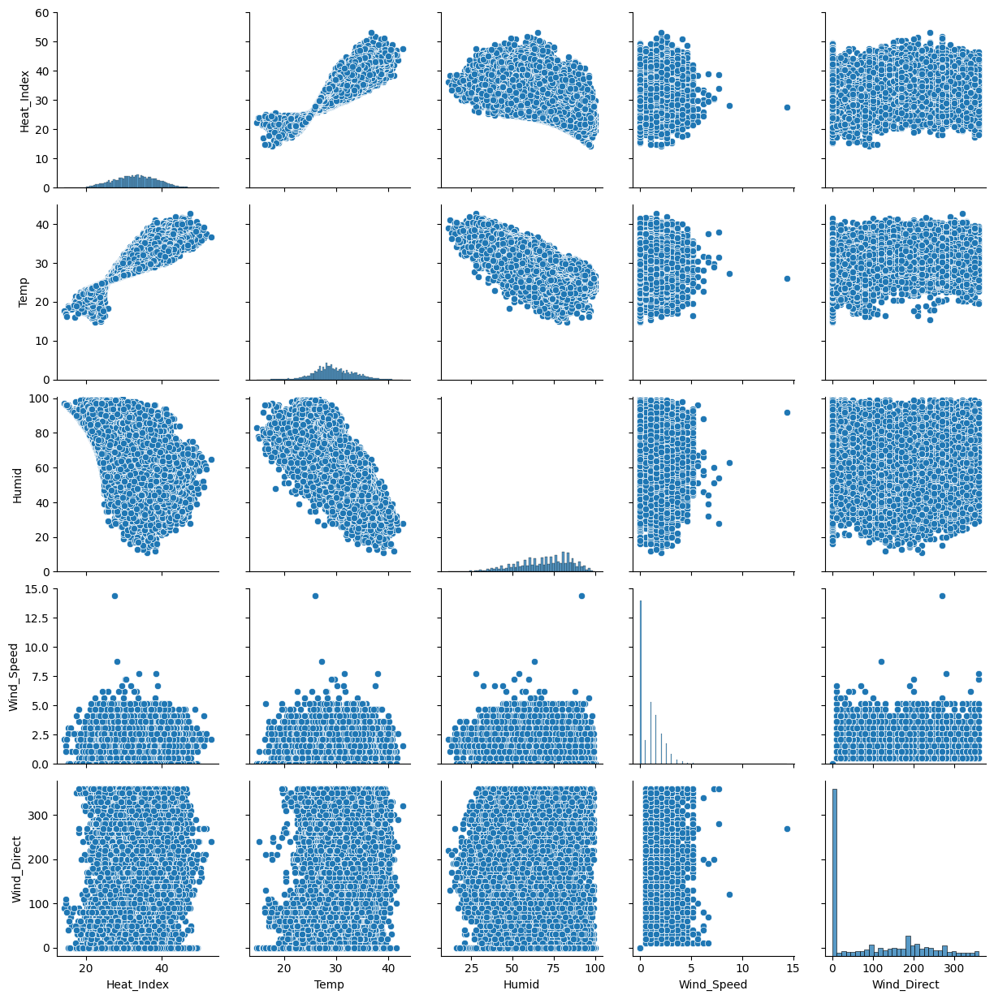

In [ ]:
g = sns.PairGrid(summer_df, vars=['Heat_Index', 'Temp', 'Humid', 'Wind_Speed', 'Wind_Direct'])
g.map_upper(sns.scatterplot)
g.map_lower(sns.scatterplot)
g.map_diag(sns.histplot, kde=False)

# Set y-axis limits for each subplot
g.axes[0, 1].set_ylim(0, 60)  # Set y-axis limits for the subplot at row 0, column 1
g.axes[1, 0].set_ylim(0, 45)
g.axes[2, 1].set_ylim(0, 101)
g.axes[3, 1].set_ylim(0, 15)

plt.show()

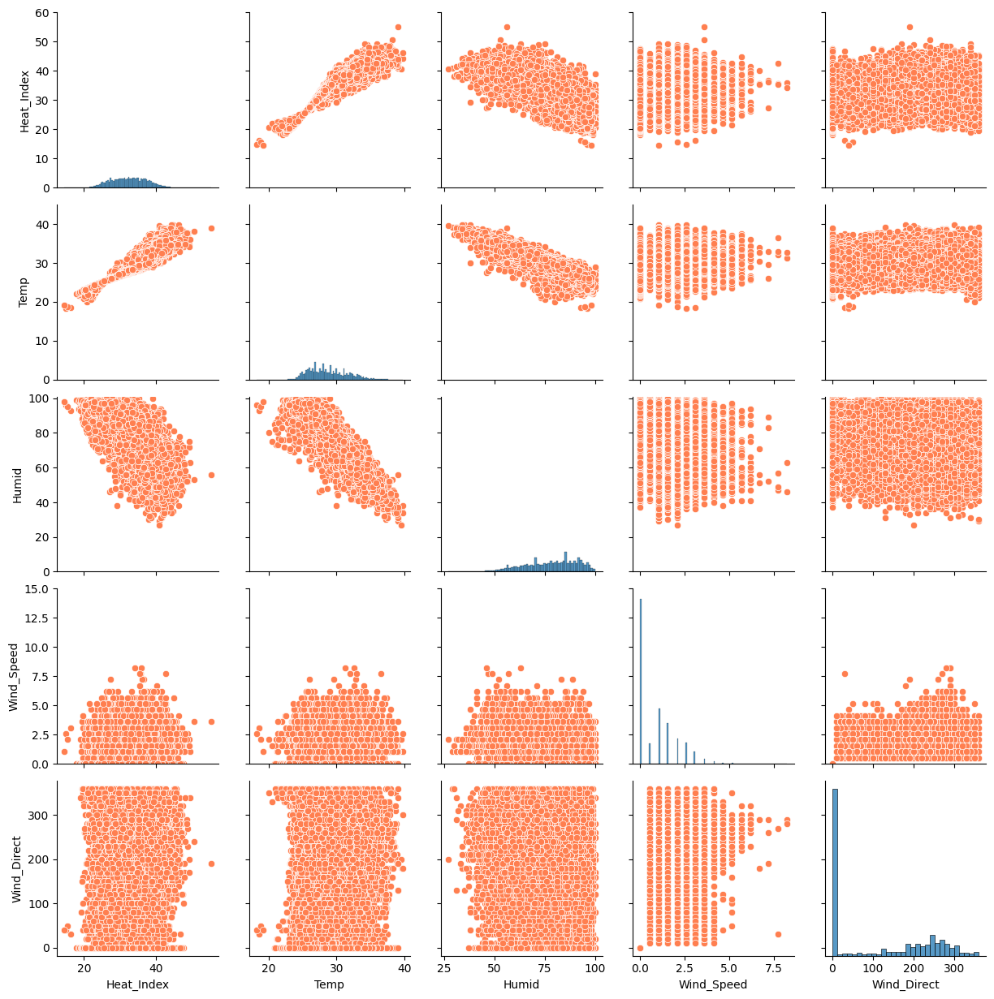

In [ ]:
g = sns.PairGrid(rainy_df, vars=['Heat_Index', 'Temp', 'Humid', 'Wind_Speed', 'Wind_Direct'])
g.map_upper(sns.scatterplot, color='coral')
g.map_lower(sns.scatterplot, color='coral')
g.map_diag(sns.histplot, kde=False)

# Set y-axis limits for each subplot
g.axes[0, 1].set_ylim(0, 60)  # Set y-axis limits for the subplot at row 0, column 1
g.axes[1, 0].set_ylim(0, 45)
g.axes[2, 1].set_ylim(0, 101)
g.axes[3, 1].set_ylim(0, 15)

plt.show()

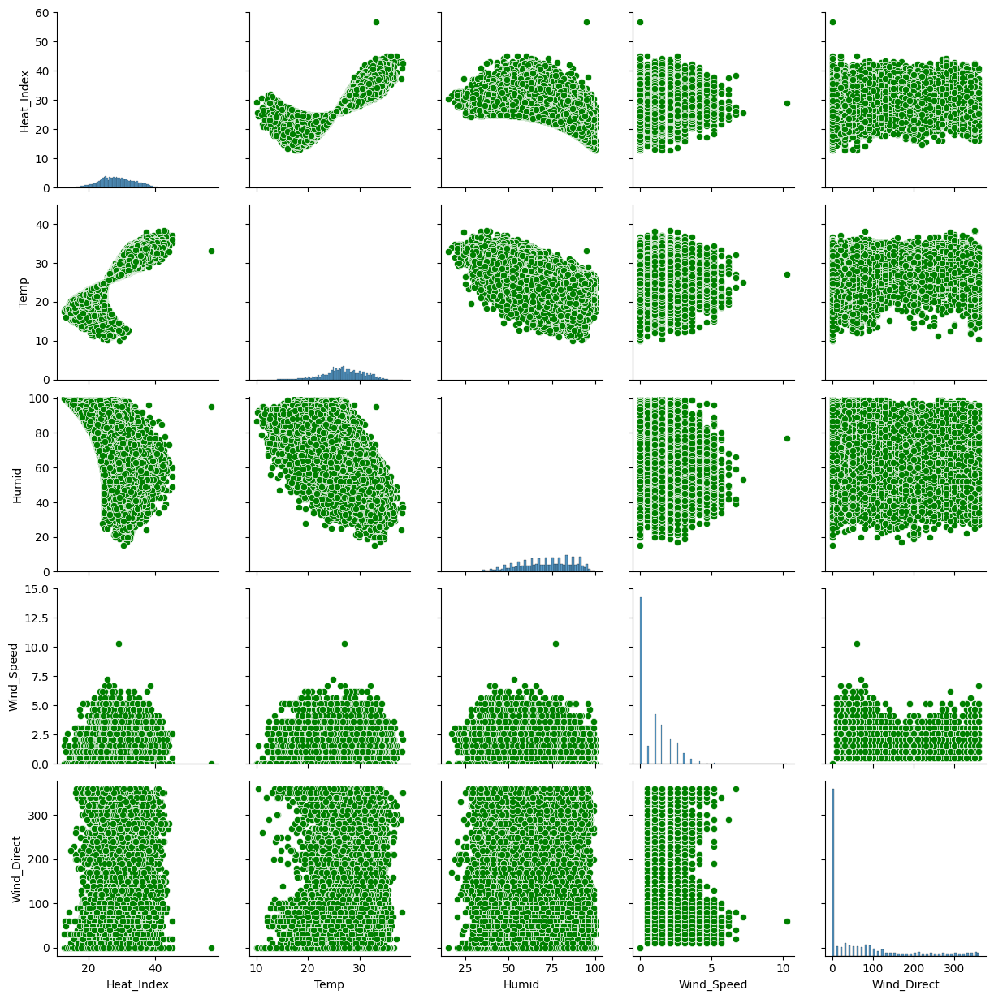

In [ ]:
g = sns.PairGrid(winter_df, vars=['Heat_Index', 'Temp', 'Humid', 'Wind_Speed', 'Wind_Direct'])
g.map_upper(sns.scatterplot, color='green')
g.map_lower(sns.scatterplot, color='green')
g.map_diag(sns.histplot, kde=False)

# Set y-axis limits for each subplot
g.axes[0, 1].set_ylim(0, 60)  # Set y-axis limits for the subplot at row 0, column 1
g.axes[1, 0].set_ylim(0, 45)
g.axes[2, 1].set_ylim(0, 101)
g.axes[3, 1].set_ylim(0, 15)

plt.show()

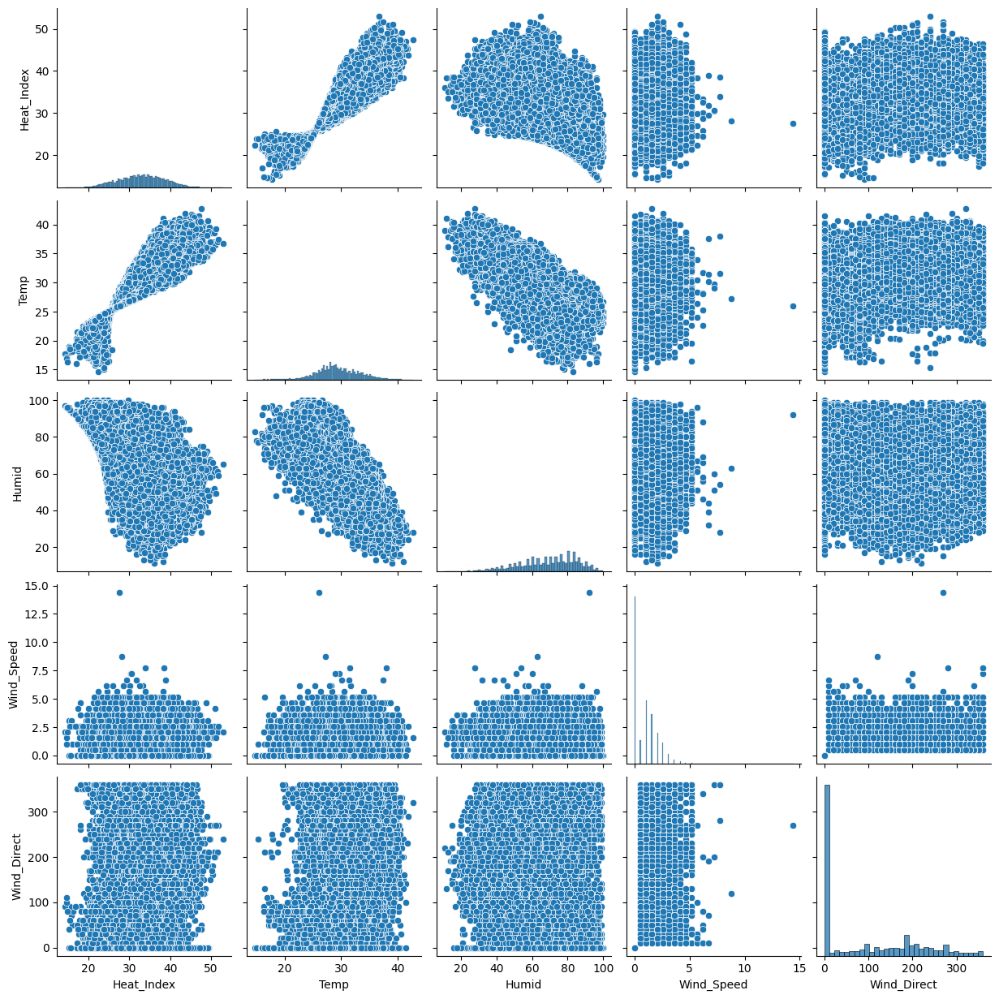

In [ ]:
sns.pairplot(summer_df[['Heat_Index', 'Temp', 'Humid', 'Wind_Speed', 'Wind_Direct']])

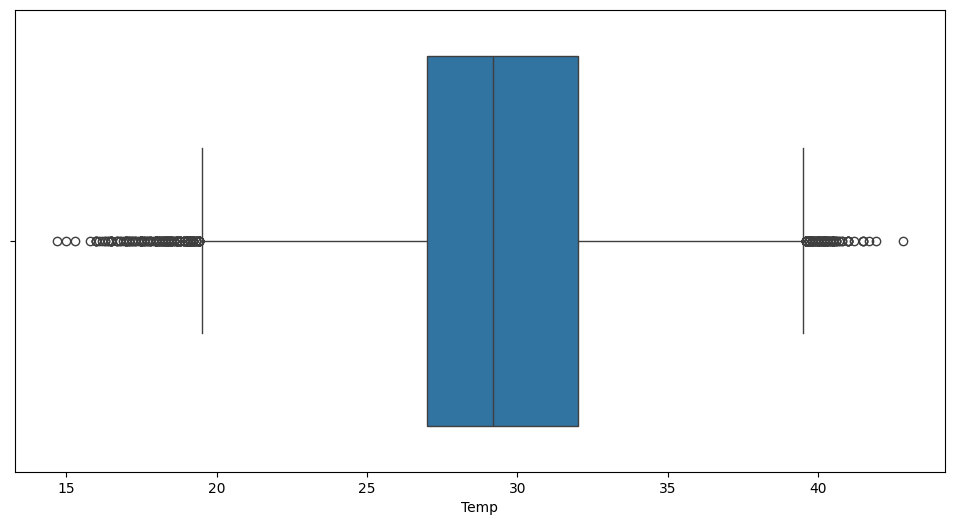

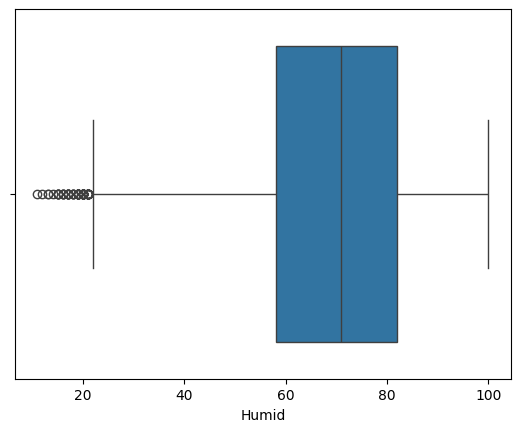

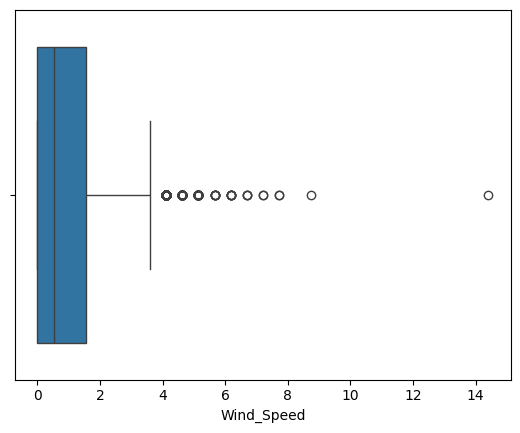

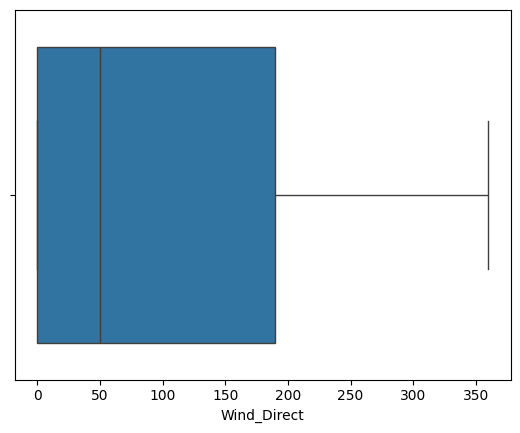

In [ ]:
plt.figure(figsize=(12, 6))
for features in ['Temp','Humid','Wind_Speed','Wind_Direct']:
  sns.boxplot(x=summer_df[features])
  plt.show()

In [ ]:
data_outliers = data.copy()
data_outliers['Datetime'] = pd.to_datetime(data_outliers['Datetime'])

summer_mask = ((data_outliers['Datetime'].dt.month == 2) & (data_outliers['Datetime'].dt.day > 15)) | ((data_outliers['Datetime'].dt.month >= 3) & (data_outliers['Datetime'].dt.month <= 4)) | ((data_outliers['Datetime'].dt.month == 5) & (data_outliers['Datetime'].dt.day <= 15))
rainy_mask = ((data_outliers['Datetime'].dt.month == 5) & (data_outliers['Datetime'].dt.day > 15)) | ((data_outliers['Datetime'].dt.month >= 6) & (data_outliers['Datetime'].dt.month <= 9)) | ((data_outliers['Datetime'].dt.month == 10) & (data_outliers['Datetime'].dt.day <= 15))
winter_mask = ((data_outliers['Datetime'].dt.month == 10) & (data_outliers['Datetime'].dt.day > 15)) | ((data_outliers['Datetime'].dt.month == 11) | (data_outliers['Datetime'].dt.month == 12) | (data_outliers['Datetime'].dt.month == 1)) | ((data_outliers['Datetime'].dt.month == 2) & (data_outliers['Datetime'].dt.day <= 15))

data_outliers['Season'] = np.select([summer_mask, rainy_mask, winter_mask], ['Summer', 'Rainy', 'Winter'])
data_outliers

,Datetime,Province,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level,Season
0,2014-01-01 01:00:00,Chiangmai,17.1,90.0,0.000000,0.0,17.459972,1,Winter
1,2014-01-02 01:00:00,Chiangmai,17.5,88.0,0.000000,0.0,18.184228,1,Winter
2,2014-01-03 01:00:00,Chiangmai,18.5,90.0,0.000000,0.0,17.375620,1,Winter
3,2014-01-04 01:00:00,Chiangmai,18.7,90.0,0.000000,0.0,17.414006,1,Winter
4,2014-01-05 01:00:00,Chiangmai,20.1,91.0,0.000000,0.0,17.729534,1,Winter
...,...,...,...,...,...,...,...,...,...
141017,2023-08-27 22:00:00,Phuket,28.5,85.0,0.000000,0.0,33.749815,3,Rainy
141018,2023-08-28 22:00:00,Phuket,28.5,85.0,0.000000,0.0,33.749815,3,Rainy
141019,2023-08-29 22:00:00,Phuket,27.4,92.0,0.000000,0.0,31.542570,2,Rainy
141020,2023-08-30 22:00:00,Phuket,28.8,82.0,2.057776,290.0,34.027390,3,Rainy


In [ ]:
#data_findoutliers = pd.DataFrame(columns=['Datetime','Season','Feature', 'Outlier'])

def find_outliers(data, feature):
    Q1 = np.percentile(data[feature], 25)
    Q3 = np.percentile(data[feature], 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[feature] < lower_bound) | (data[feature] > upper_bound)]
    outliers['Outlier'] = outliers[feature]
    return outliers

# Iterate over each feature to find outliers and add them to the outliers dataframe
dfs = []
for feature in ['Temp', 'Humid', 'Wind_Speed', 'Wind_Direct']:
    outliers = find_outliers(data_outliers, feature)
    outliers['Feature'] = feature
    outliers['Season'] = outliers['Season']
    outliers['Datetime'] = outliers['Datetime']
    dfs.append(outliers[['Datetime', 'Season', 'Feature', 'Outlier']])

data_findoutliers = pd.concat(dfs, ignore_index=True)
data_findoutliers.to_csv(f'{main_path_data}data_findoutliers.csv', index=False)
data_findoutliers

<ipython-input-14-a4bd4e5879a7>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers['Outlier'] = outliers[feature]
<ipython-input-14-a4bd4e5879a7>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers['Feature'] = feature
<ipython-input-14-a4bd4e5879a7>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide

,Datetime,Season,Feature,Outlier
0,2014-01-01 01:00:00,Winter,Temp,17.100000
1,2014-01-02 01:00:00,Winter,Temp,17.500000
2,2014-01-03 01:00:00,Winter,Temp,18.500000
3,2014-01-04 01:00:00,Winter,Temp,18.700000
4,2014-01-08 01:00:00,Winter,Temp,18.000000
...,...,...,...,...
4829,2023-02-25 22:00:00,Summer,Wind_Speed,6.173328
4830,2023-03-14 22:00:00,Summer,Wind_Speed,4.629996
4831,2023-07-01 22:00:00,Rainy,Wind_Speed,4.629996
4832,2023-07-16 22:00:00,Rainy,Wind_Speed,4.115552


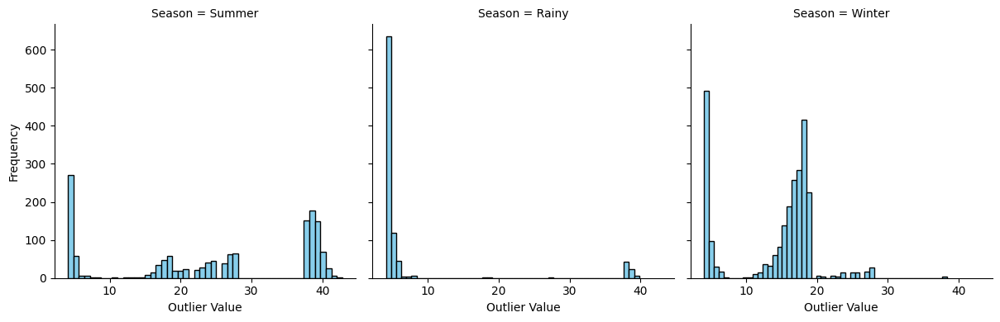

In [ ]:
g = sns.FacetGrid(data_findoutliers, col='Season', col_wrap=3, height=4, col_order=['Summer','Rainy','Winter'])
g.map(lambda data, color: plt.hist(data, bins=50, color='skyblue', edgecolor='black'), 'Outlier')
g.set_axis_labels('Outlier Value', 'Frequency')
plt.show()

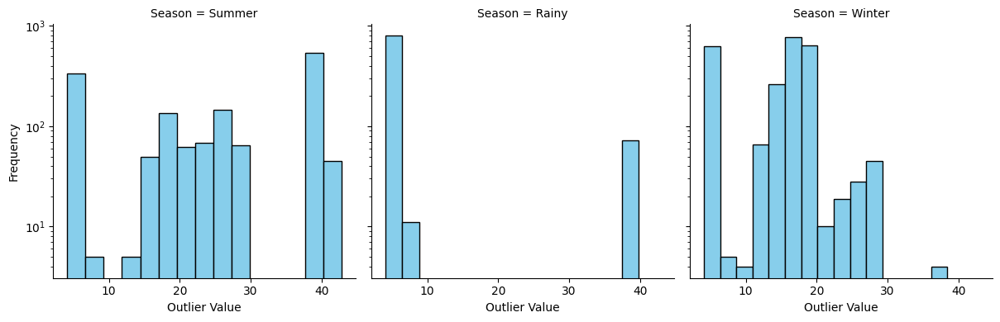

In [ ]:
g = sns.FacetGrid(data_findoutliers, col='Season', col_wrap=3, height=4, col_order=['Summer','Rainy','Winter'])
g.map(lambda data, color: plt.hist(data, bins=15, color='skyblue', edgecolor='black', log=True), 'Outlier')
g.set_axis_labels('Outlier Value', 'Frequency')
plt.show()

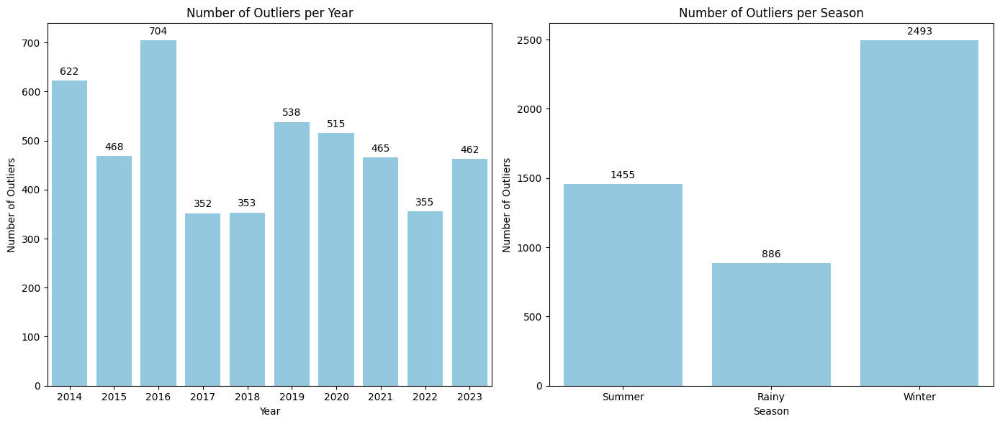

In [ ]:
data_findoutliers['Year'] = data_findoutliers['Datetime'].dt.year

# Count number of outliers for each year
outliers_per_year = data_findoutliers.groupby(['Year']).size().reset_index(name='Outlier_Count')
outliers_per_season = data_findoutliers.groupby(['Season']).size().reset_index(name='Outlier_Count')

# Create bar plot
plt.figure(figsize=(14, 6))

# Subplot for number of outliers per year
plt.subplot(1, 2, 1)
ax1 = sns.barplot(x='Year', y='Outlier_Count', data=outliers_per_year, color='skyblue')
plt.xlabel('Year')
plt.ylabel('Number of Outliers')
plt.title('Number of Outliers per Year')

# Add value labels on top of each bar for year
for p in ax1.patches:
    ax1.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),
                textcoords = 'offset points')

# Subplot for number of outliers per season
plt.subplot(1, 2, 2)
ax2 = sns.barplot(x='Season', y='Outlier_Count', data=outliers_per_season, color='skyblue', order=['Summer','Rainy','Winter'])
plt.xlabel('Season')
plt.ylabel('Number of Outliers')
plt.title('Number of Outliers per Season')

# Add value labels on top of each bar for season
for p in ax2.patches:
    ax2.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha = 'center', va = 'center',
                xytext = (0, 9),
                textcoords = 'offset points')

plt.tight_layout()
plt.show()

In [ ]:
outliers_per_season

,Season,Outlier_Count
0,Rainy,886
1,Summer,1455
2,Winter,2493


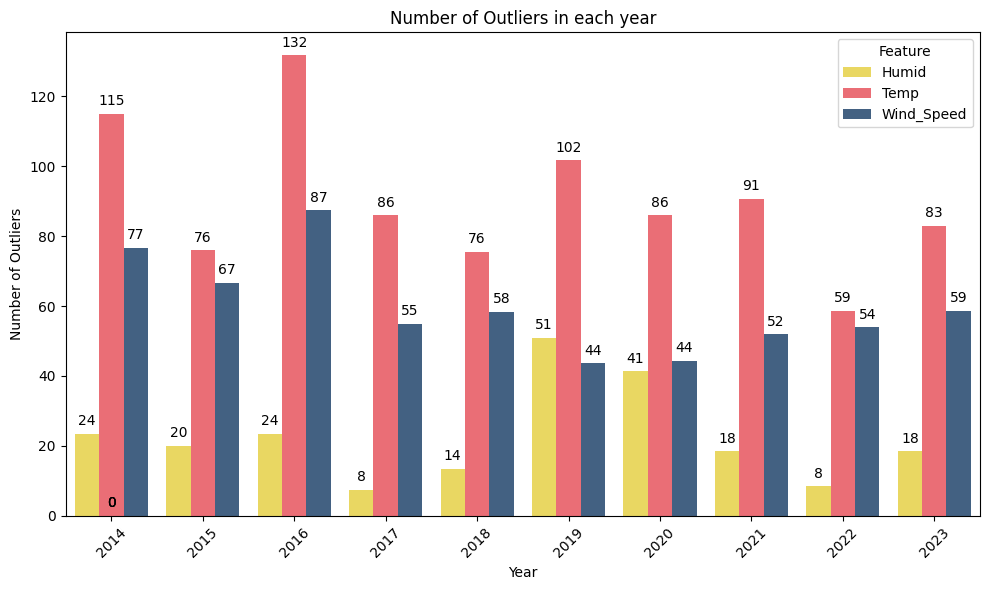

In [ ]:
outliers_per_feature_year_season = data_findoutliers.groupby(['Feature', 'Year', 'Season']).size().reset_index(name='Outlier_Count')

# Create grouped bar plot
plt.figure(figsize=(10, 6))
palette = ["#FFE74C", "#FF5964", "#38618C"]
ax = sns.barplot(x='Year', y='Outlier_Count', hue='Feature', data=outliers_per_feature_year_season, palette=palette,
                 errorbar=None, capsize=0.1)
plt.xlabel('Year')
plt.ylabel('Number of Outliers')
plt.title('Number of Outliers in each year')
plt.legend(title='Feature', loc='upper right')

# Add value labels on top of each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 9),
                textcoords='offset points')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
outliers_per_feature_year_season.Outlier_Count.sum()

4834

In [ ]:
outliers_per_feature_year_season

,Year,Season,Feature,Outlier_Count
0,2014,Rainy,Temp,3
1,2014,Rainy,Wind_Speed,112
2,2014,Summer,Humid,39
3,2014,Summer,Temp,50
4,2014,Summer,Wind_Speed,50
...,...,...,...,...
74,2023,Summer,Temp,99
75,2023,Summer,Wind_Speed,45
76,2023,Winter,Humid,17
77,2023,Winter,Temp,125


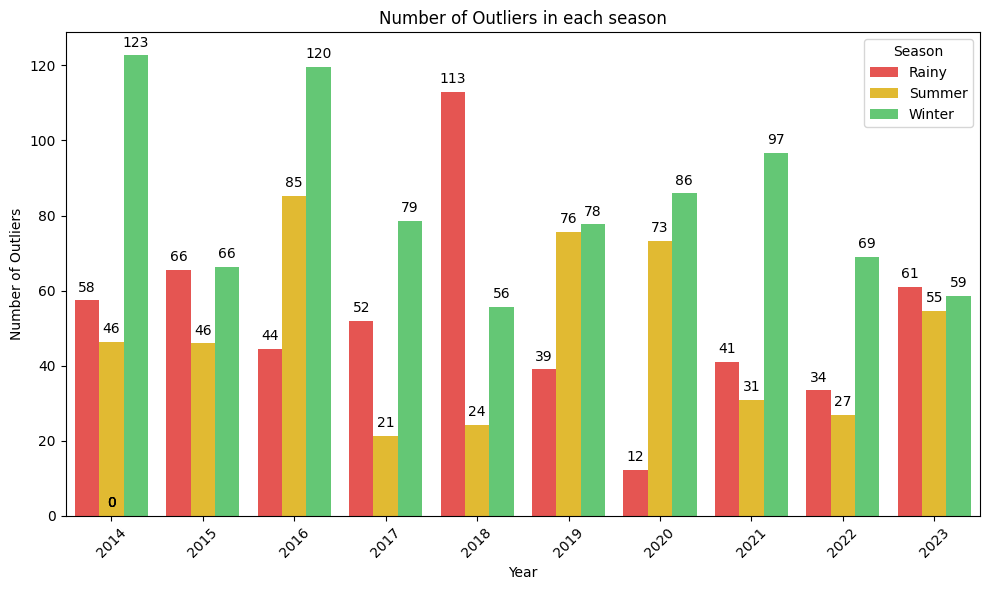

In [ ]:
outliers_per_feature_year_season = data_findoutliers.groupby(['Year','Season','Feature']).size().reset_index(name='Outlier_Count')

# Create grouped bar plot
plt.figure(figsize=(10, 6))
palette = ["#FD3D39", "#FECA15", "#53D86A"]
ax = sns.barplot(x='Year', y='Outlier_Count', hue='Season', data=outliers_per_feature_year_season, palette=palette,
                 errorbar=None, capsize=0.1)
plt.xlabel('Year')
plt.ylabel('Number of Outliers')
plt.title('Number of Outliers in each season')
plt.legend(title='Season', loc='upper right')

# Add value labels on top of each bar
for p in ax.patches:
    ax.annotate(format(p.get_height(), '.0f'),
                (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='center',
                xytext=(0, 9),
                textcoords='offset points')

plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [ ]:
summer_df_copy = summer_df.copy()

# Create an empty dataframe to store outliers
summer_outliers = pd.DataFrame(columns=['Season','Feature', 'Outlier'])

# Define a function to identify outliers for each feature
def find_outliers(data, feature):
    Q1 = np.percentile(data[feature], 25)
    Q3 = np.percentile(data[feature], 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[feature] < lower_bound) | (data[feature] > upper_bound)]
    return outliers

# Iterate over each feature to find outliers and add them to the outliers dataframe
dfs = []
for feature in ['Temp','Humid','Wind_Speed','Wind_Direct']:
    outliers = find_outliers(summer_df_copy, feature)
    outliers['Feature'] = feature
    outliers['Season'] = 'Summer'
    dfs.append(outliers)

summer_outliers = pd.concat(dfs, ignore_index=True)
summer_outliers = summer_outliers.loc[:,['Province','Season','Feature','Temp','Humid','Wind_Speed','Wind_Direct','Heat_Index','HI_level']]
summer_outliers.to_csv(f'{main_path_data}summer_outlies.csv', index=False)

# Display the outliers dataframe
summer_outliers

<ipython-input-80-0fcac1fc7cdc>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers['Feature'] = feature
<ipython-input-80-0fcac1fc7cdc>:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers['Season'] = 'Summer'
<ipython-input-80-0fcac1fc7cdc>:20: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

,Province,Season,Feature,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
0,Bangkok,Summer,Temp,39.8,42.0,0.000000,0.0,48.541412,4
1,Bangkok,Summer,Temp,39.8,41.0,0.000000,0.0,47.961591,4
2,Bangkok,Summer,Temp,40.1,36.0,3.086664,210.0,45.953143,4
3,Chiangmai,Summer,Temp,19.1,83.0,0.000000,0.0,19.779367,1
4,Chiangmai,Summer,Temp,17.5,87.0,0.000000,0.0,18.575444,1
...,...,...,...,...,...,...,...,...,...
770,Rayong,Summer,Wind_Speed,30.1,39.0,6.687772,10.0,29.409411,2
771,Rayong,Summer,Wind_Speed,21.3,63.0,4.115552,330.0,23.750615,1
772,Rayong,Summer,Wind_Speed,26.7,47.0,4.115552,20.0,26.675134,1
773,Rayong,Summer,Wind_Speed,24.0,56.0,4.115552,20.0,24.994730,1


In [ ]:
print('number of outlier in Summer: ',len(summer_outliers),'\n')
for province_name in summer_outliers['Province'].unique():
  print(f'number of outlier in Summer {province_name}: ',len(summer_outliers[summer_outliers.Province == province_name]))
  print(f'number of outlier features in Summer {province_name}: ',len(summer_outliers[summer_outliers.Province == province_name].Feature.unique()))
  print(f'Outlier features in Summer {province_name}: ',summer_outliers[summer_outliers.Province == province_name].Feature.unique(),'\n')

number of outlier in Summer:  775 

number of outlier in Summer Bangkok:  62
number of outlier features in Summer Bangkok:  2
Outlier features in Summer Bangkok:  ['Temp' 'Wind_Speed'] 

number of outlier in Summer Chiangmai:  336
number of outlier features in Summer Chiangmai:  3
Outlier features in Summer Chiangmai:  ['Temp' 'Humid' 'Wind_Speed'] 

number of outlier in Summer Nakhon_Ratchasima:  238
number of outlier features in Summer Nakhon_Ratchasima:  2
Outlier features in Summer Nakhon_Ratchasima:  ['Temp' 'Wind_Speed'] 

number of outlier in Summer Rayong:  66
number of outlier features in Summer Rayong:  2
Outlier features in Summer Rayong:  ['Temp' 'Wind_Speed'] 

number of outlier in Summer Phuket:  73
number of outlier features in Summer Phuket:  1
Outlier features in Summer Phuket:  ['Wind_Speed'] 



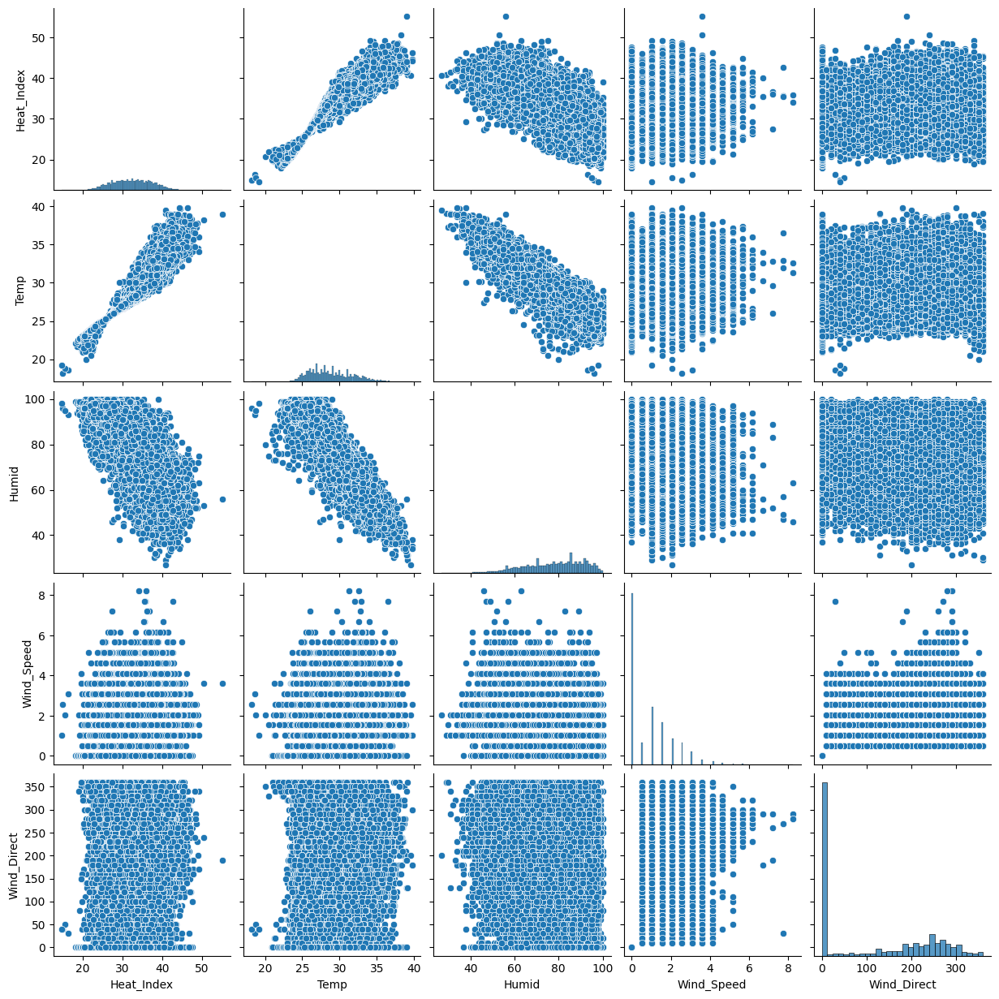

In [ ]:
sns.pairplot(rainy_df[['Heat_Index', 'Temp', 'Humid', 'Wind_Speed', 'Wind_Direct']])

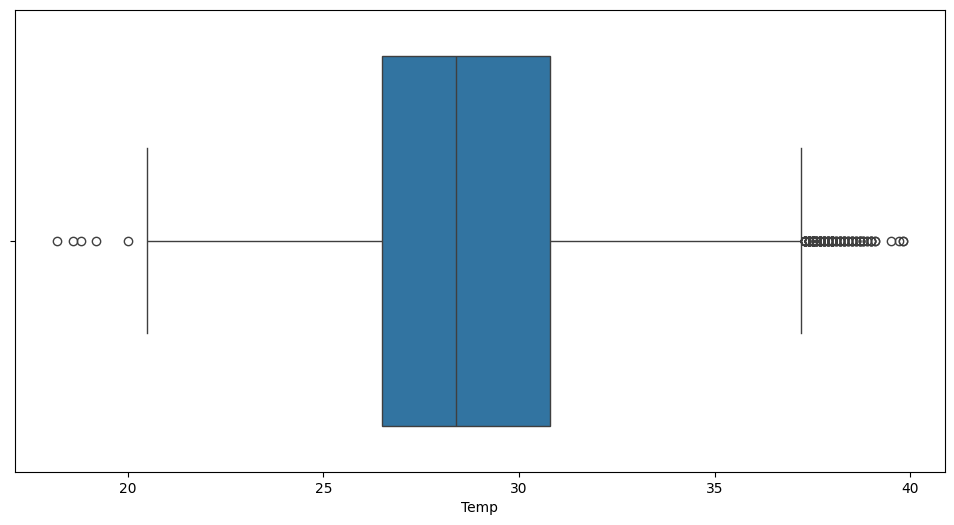

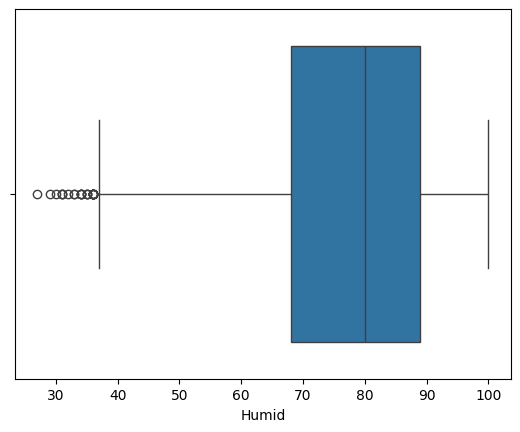

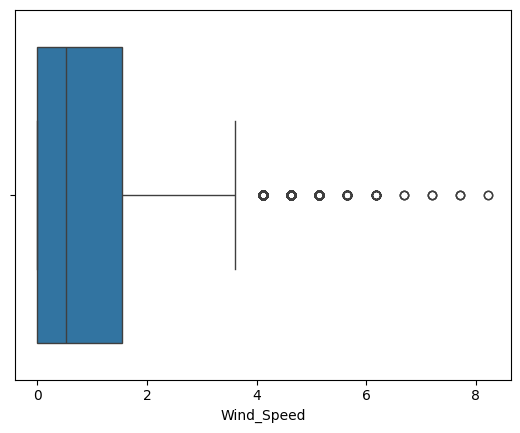

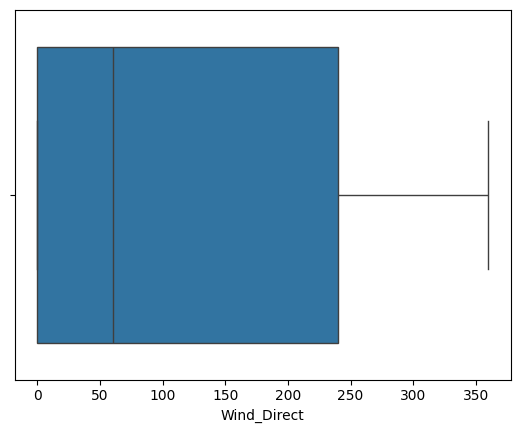

In [ ]:
plt.figure(figsize=(12, 6))
for features in ['Temp','Humid','Wind_Speed','Wind_Direct']:
  sns.boxplot(x=rainy_df[features])
  plt.show()

In [ ]:
rainy_df_copy = rainy_df.copy()

# Create an empty dataframe to store outliers
rainy_outliers = pd.DataFrame(columns=['Season','Feature', 'Outlier'])

# Iterate over each feature to find outliers and add them to the outliers dataframe
dfs = []
for feature in ['Temp','Humid','Wind_Speed','Wind_Direct']:
    outliers = find_outliers(rainy_df_copy, feature)
    outliers['Feature'] = feature
    outliers['Season'] = 'Rainy'
    dfs.append(outliers)

rainy_outliers = pd.concat(dfs, ignore_index=True)
rainy_outliers = rainy_outliers.loc[:,['Province','Season','Feature','Temp','Humid','Wind_Speed','Wind_Direct','Heat_Index','HI_level']]
rainy_outliers.to_csv(f'{main_path_data}rainy_outlies.csv', index=True)

# Display the outliers dataframe
rainy_outliers

<ipython-input-81-5b0a820c54ee>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers['Feature'] = feature
<ipython-input-81-5b0a820c54ee>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers['Season'] = 'Rainy'
<ipython-input-81-5b0a820c54ee>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

,Province,Season,Feature,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
0,Bangkok,Rainy,Temp,38.2,41.0,0.000000,0.0,44.000881,4
1,Bangkok,Rainy,Temp,37.8,44.0,1.543332,240.0,44.468507,4
2,Bangkok,Rainy,Temp,37.4,47.0,1.028888,150.0,44.920694,4
3,Bangkok,Rainy,Temp,37.9,42.0,1.543332,210.0,43.760241,4
4,Bangkok,Rainy,Temp,37.3,49.0,1.028888,120.0,45.660476,4
...,...,...,...,...,...,...,...,...,...
974,Rayong,Rainy,Wind_Speed,33.0,54.0,5.144440,290.0,37.076459,3
975,Rayong,Rainy,Wind_Speed,34.9,49.0,4.115552,280.0,39.662165,3
976,Rayong,Rainy,Wind_Speed,33.6,55.0,5.658884,290.0,38.779725,3
977,Rayong,Rainy,Wind_Speed,35.4,49.0,4.629996,280.0,40.828782,3


In [ ]:
df = pd.read_csv(f'{main_path_data}winter_outliers.csv')
df

,Province,Season,Feature,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
0,Bangkok,Winter,Temp,16.7,74.0,0.000000,0.0,23.369024,1
1,Bangkok,Winter,Temp,16.8,68.0,0.000000,0.0,24.741463,1
2,Bangkok,Winter,Temp,16.2,67.0,0.000000,0.0,25.533813,1
3,Bangkok,Winter,Temp,16.7,89.0,3.086664,20.0,18.037934,1
4,Chiangmai,Winter,Temp,15.5,95.0,0.000000,0.0,15.724678,1
...,...,...,...,...,...,...,...,...,...
6250,Rayong,Winter,Wind_Direct,26.9,86.0,1.028888,270.0,29.487511,2
6251,Rayong,Winter,Wind_Direct,27.5,80.0,0.514444,300.0,30.338455,2
6252,Rayong,Winter,Wind_Direct,31.3,63.0,0.514444,260.0,35.841865,3
6253,Rayong,Winter,Wind_Direct,30.0,68.0,1.028888,270.0,34.071832,3


In [ ]:
print(f'number of outlier in Rainy: ',len(rainy_outliers),'\n')
for province_name in rainy_outliers['Province'].unique():
  print(f'number of outlier in Rainy {province_name}: ',len(rainy_outliers[rainy_outliers.Province == province_name]))
  print(f'number of outlier features in Rainy {province_name}: ',len(rainy_outliers[rainy_outliers.Province == province_name].Feature.unique()))
  print(f'Outlier features in Rainy {province_name}: ', rainy_outliers[rainy_outliers.Province == province_name].Feature.unique(),'\n')

number of outlier in Rainy:  979 

number of outlier in Rainy Bangkok:  78
number of outlier features in Rainy Bangkok:  3
Outlier features in Rainy Bangkok:  ['Temp' 'Humid' 'Wind_Speed'] 

number of outlier in Rainy Chiangmai:  97
number of outlier features in Rainy Chiangmai:  3
Outlier features in Rainy Chiangmai:  ['Temp' 'Humid' 'Wind_Speed'] 

number of outlier in Rainy Nakhon_Ratchasima:  318
number of outlier features in Rainy Nakhon_Ratchasima:  3
Outlier features in Rainy Nakhon_Ratchasima:  ['Temp' 'Humid' 'Wind_Speed'] 

number of outlier in Rainy Phuket:  358
number of outlier features in Rainy Phuket:  1
Outlier features in Rainy Phuket:  ['Wind_Speed'] 

number of outlier in Rainy Rayong:  128
number of outlier features in Rainy Rayong:  1
Outlier features in Rainy Rayong:  ['Wind_Speed'] 



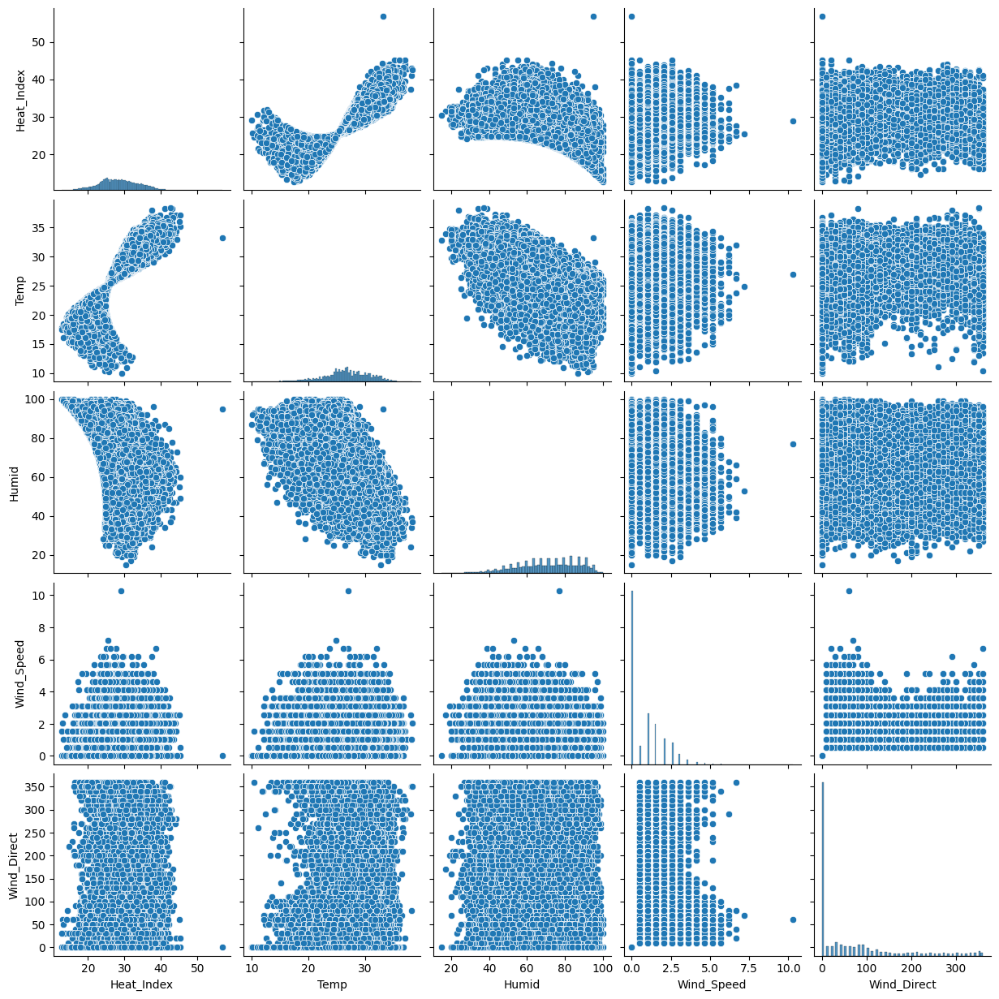

In [ ]:
sns.pairplot(winter_df[['Heat_Index', 'Temp', 'Humid', 'Wind_Speed', 'Wind_Direct']])

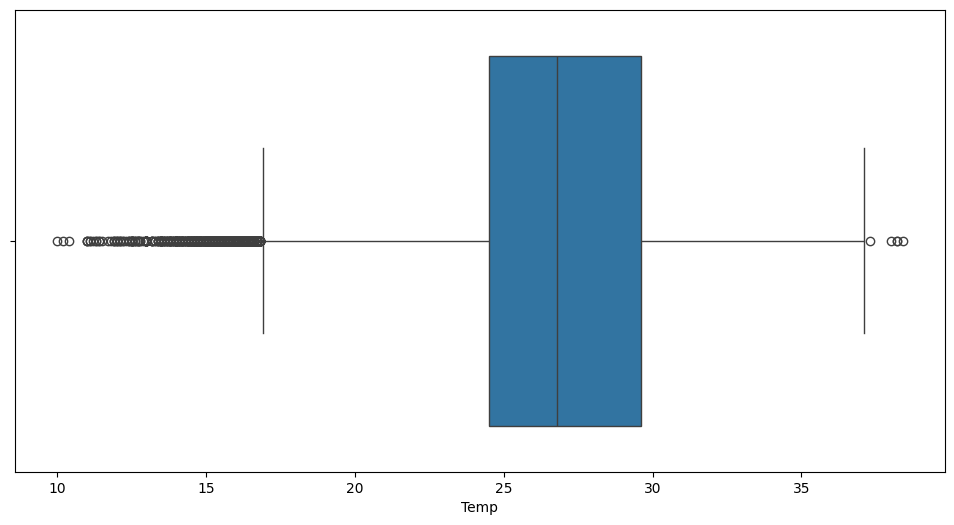

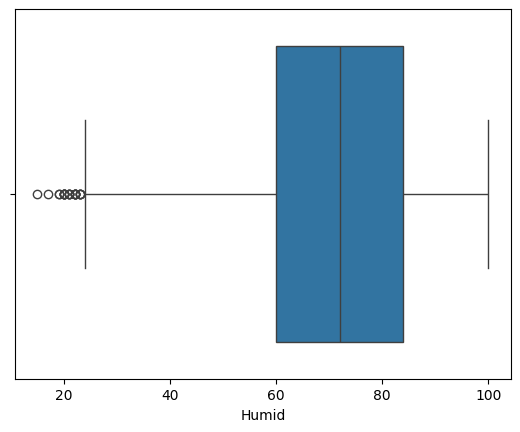

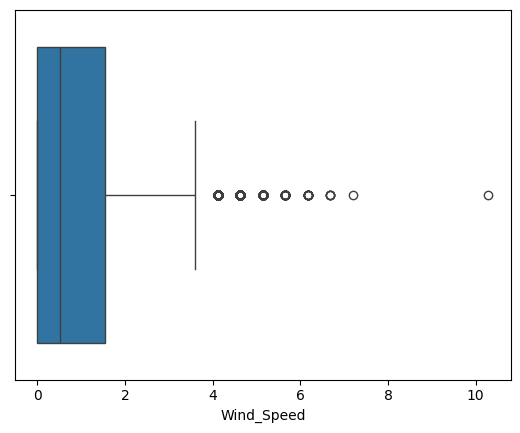

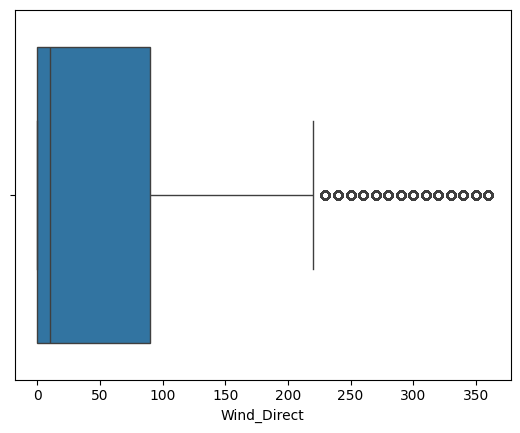

In [ ]:
plt.figure(figsize=(12, 6))
for features in ['Temp','Humid','Wind_Speed','Wind_Direct']:
  sns.boxplot(x=winter_df[features])
  plt.show()

In [ ]:
winter_df_copy = winter_df.copy()

# Create an empty dataframe to store outliers
winter_outliers = pd.DataFrame(columns=['Season','Feature', 'Outlier'])

# Iterate over each feature to find outliers and add them to the outliers dataframe
dfs = []
for feature in ['Temp','Humid','Wind_Speed','Wind_Direct']:
    outliers = find_outliers(winter_df_copy, feature)
    outliers['Feature'] = feature
    outliers['Season'] = 'Winter'
    dfs.append(outliers)

winter_outliers = pd.concat(dfs, ignore_index=True)
winter_outliers = winter_outliers.loc[:,['Province','Season','Feature','Temp','Humid','Wind_Speed','Wind_Direct','Heat_Index','HI_level']]
winter_outliers.to_csv(f'{main_path_data}winter_outliers.csv', index=False)

# Display the outliers dataframe
winter_outliers

<ipython-input-82-52f31a8686f1>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers['Feature'] = feature
<ipython-input-82-52f31a8686f1>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers['Season'] = 'Winter'
<ipython-input-82-52f31a8686f1>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.

,Province,Season,Feature,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
0,Bangkok,Winter,Temp,16.7,74.0,0.000000,0.0,23.369024,1
1,Bangkok,Winter,Temp,16.8,68.0,0.000000,0.0,24.741463,1
2,Bangkok,Winter,Temp,16.2,67.0,0.000000,0.0,25.533813,1
3,Bangkok,Winter,Temp,16.7,89.0,3.086664,20.0,18.037934,1
4,Chiangmai,Winter,Temp,15.5,95.0,0.000000,0.0,15.724678,1
...,...,...,...,...,...,...,...,...,...
6250,Rayong,Winter,Wind_Direct,26.9,86.0,1.028888,270.0,29.487511,2
6251,Rayong,Winter,Wind_Direct,27.5,80.0,0.514444,300.0,30.338455,2
6252,Rayong,Winter,Wind_Direct,31.3,63.0,0.514444,260.0,35.841865,3
6253,Rayong,Winter,Wind_Direct,30.0,68.0,1.028888,270.0,34.071832,3


In [ ]:
print('number of outlier in Winter: ',len(winter_outliers),'\n')
for province_name in winter_outliers['Province'].unique():
  print(f'number of outlier in Winter {province_name}: ',len(winter_outliers[winter_outliers.Province == province_name]))
  print(f'number of outlier features in Winter {province_name}: ',len(winter_outliers[winter_outliers.Province == province_name].Feature.unique()))
  print(f'Outlier features in Winter {province_name}: ',winter_outliers[winter_outliers.Province == province_name].Feature.unique(),'\n')

number of outlier in Winter:  6255 

number of outlier in Winter Bangkok:  913
number of outlier features in Winter Bangkok:  3
Outlier features in Winter Bangkok:  ['Temp' 'Wind_Speed' 'Wind_Direct'] 

number of outlier in Winter Chiangmai:  1842
number of outlier features in Winter Chiangmai:  4
Outlier features in Winter Chiangmai:  ['Temp' 'Humid' 'Wind_Speed' 'Wind_Direct'] 

number of outlier in Winter Nakhon_Ratchasima:  907
number of outlier features in Winter Nakhon_Ratchasima:  4
Outlier features in Winter Nakhon_Ratchasima:  ['Temp' 'Humid' 'Wind_Speed' 'Wind_Direct'] 

number of outlier in Winter Rayong:  1696
number of outlier features in Winter Rayong:  4
Outlier features in Winter Rayong:  ['Temp' 'Humid' 'Wind_Speed' 'Wind_Direct'] 

number of outlier in Winter Phuket:  897
number of outlier features in Winter Phuket:  2
Outlier features in Winter Phuket:  ['Wind_Speed' 'Wind_Direct'] 



In [ ]:
def tendency_data_bytime(season):
  if season == 'Summer':
    df = summer_df
  elif season == 'Rainy':
    df = rainy_df
  else:
    df = winter_df

  df['Hour'] = df.index.hour

  # Plot each column
  for col in df.iloc[:,1:5].columns:
      plt.figure(figsize=(10, 6))
      sns.lineplot(data=df, x='Hour', y=col, hue='Province')  # Use seaborn for easier hue handling
      plt.xlabel('Time')
      plt.ylabel('Value')
      plt.title(f'Trend of {col} in {season} season by Hour')
      plt.legend()
      plt.show()

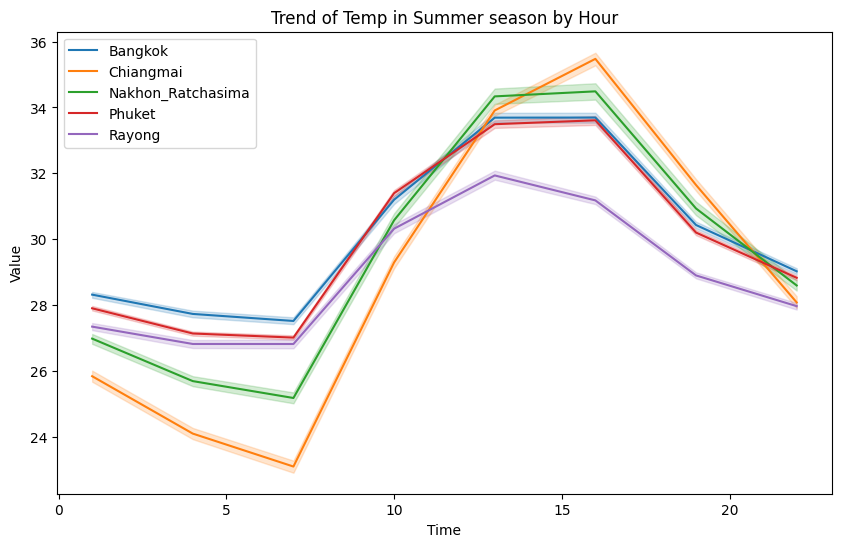

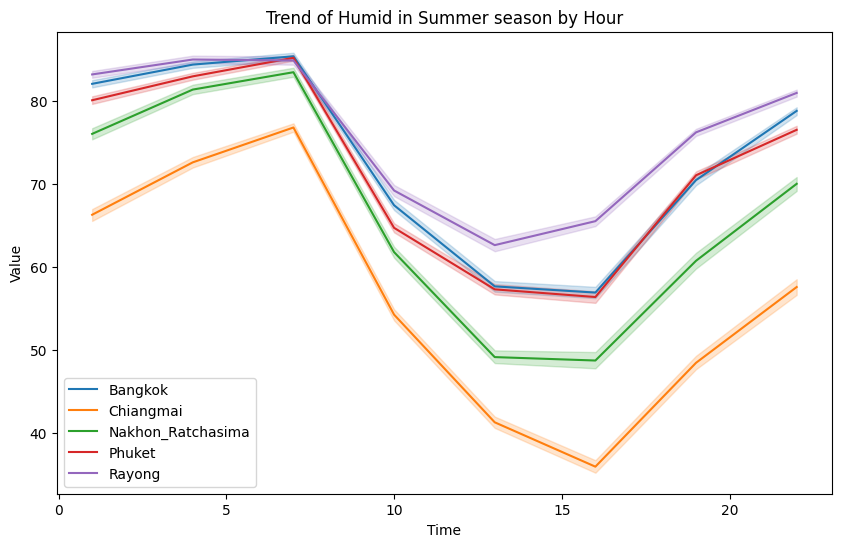

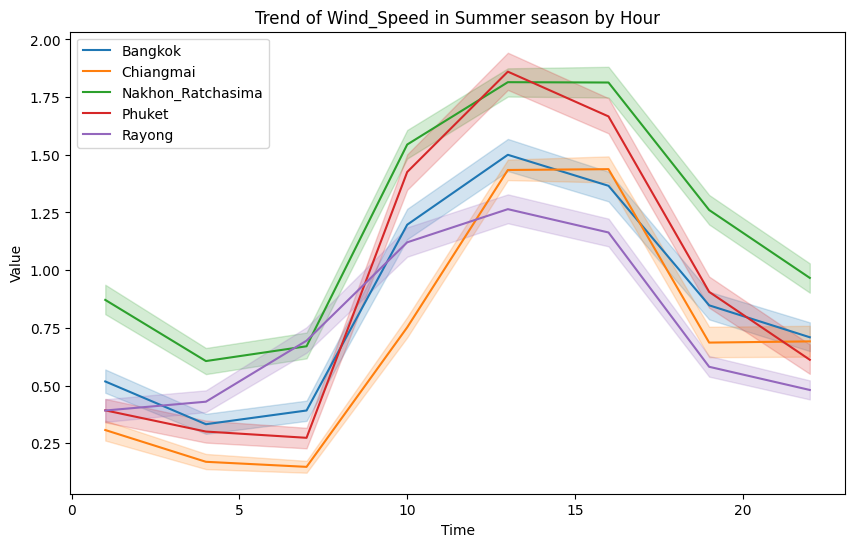

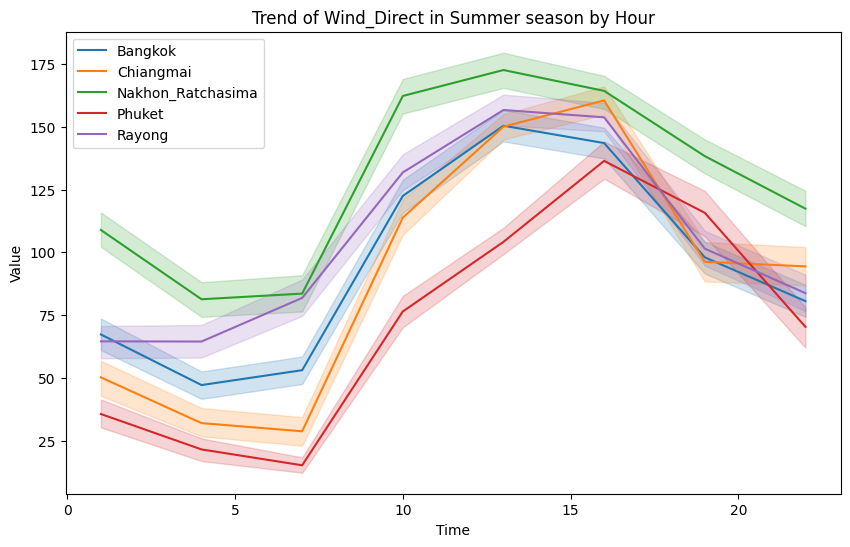

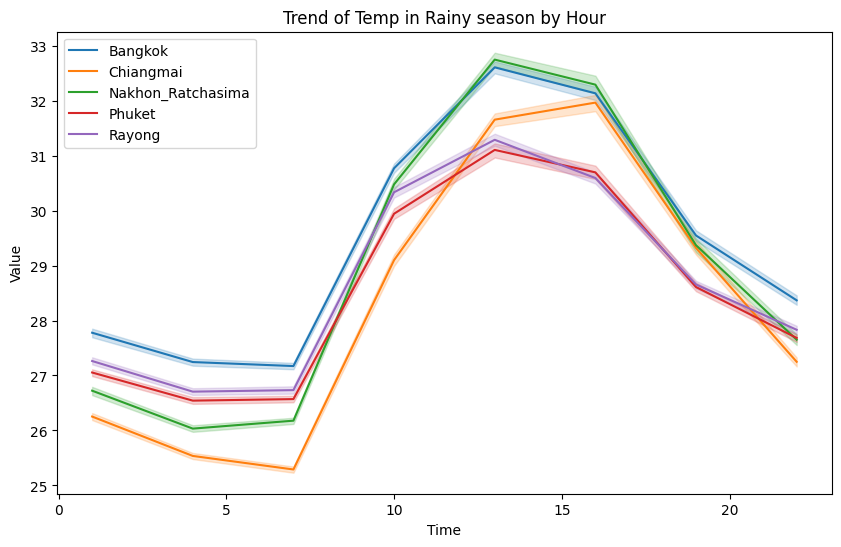

...

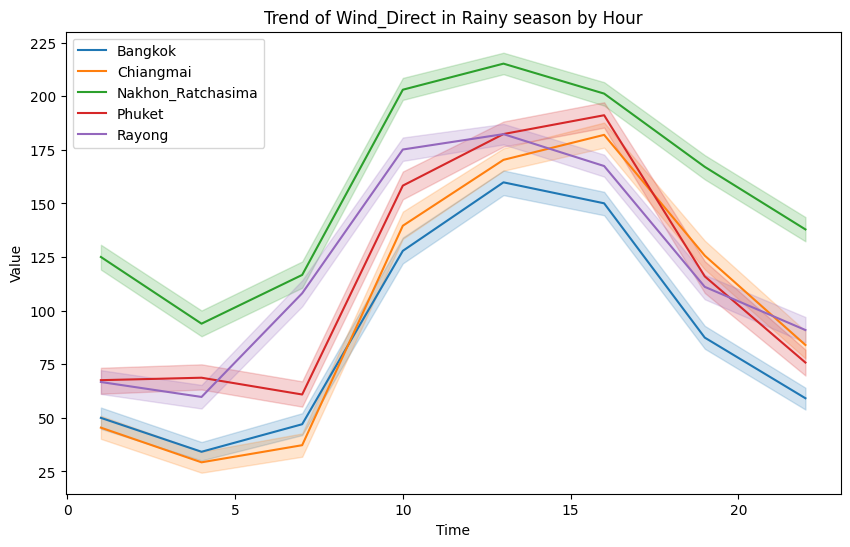

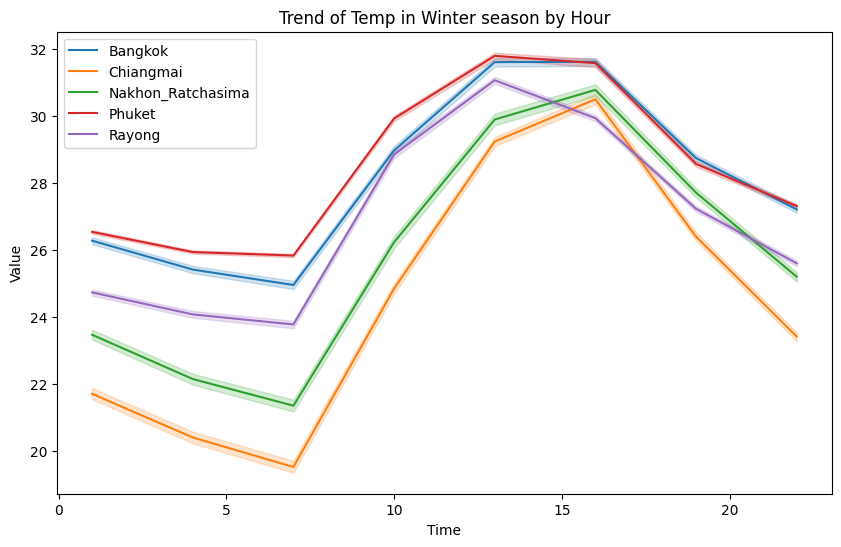

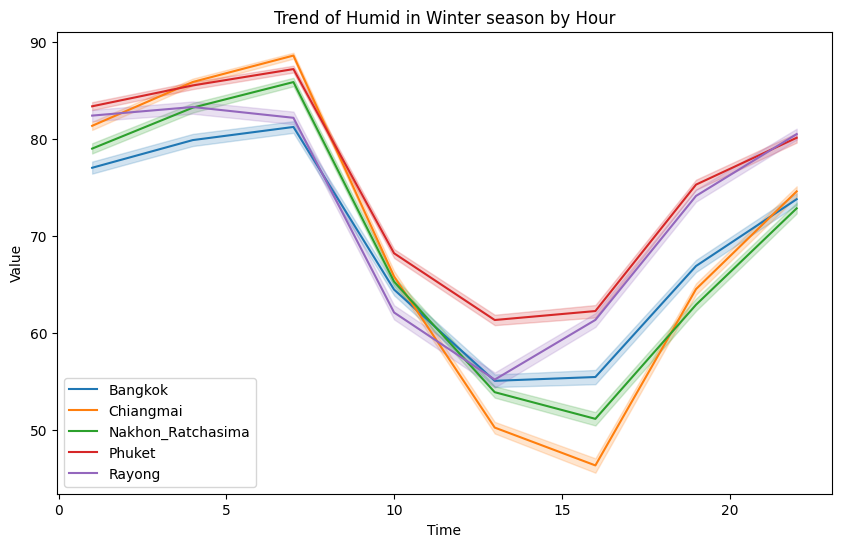

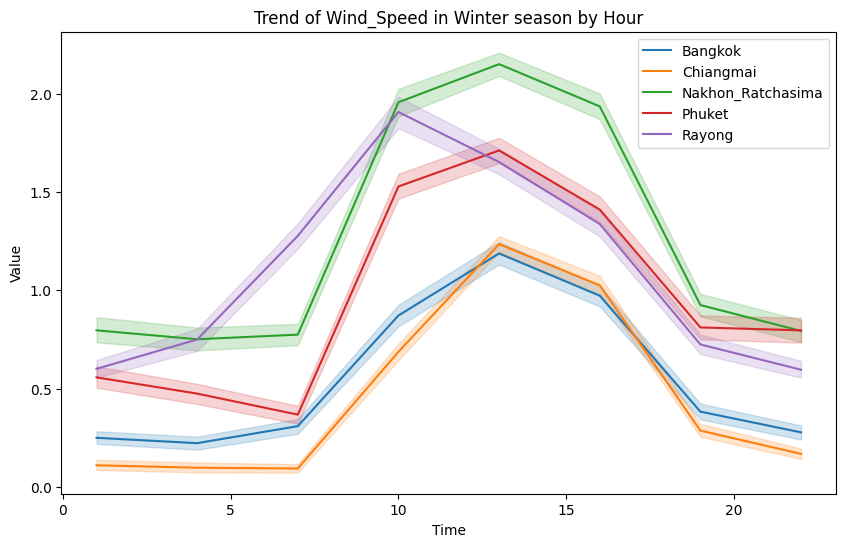

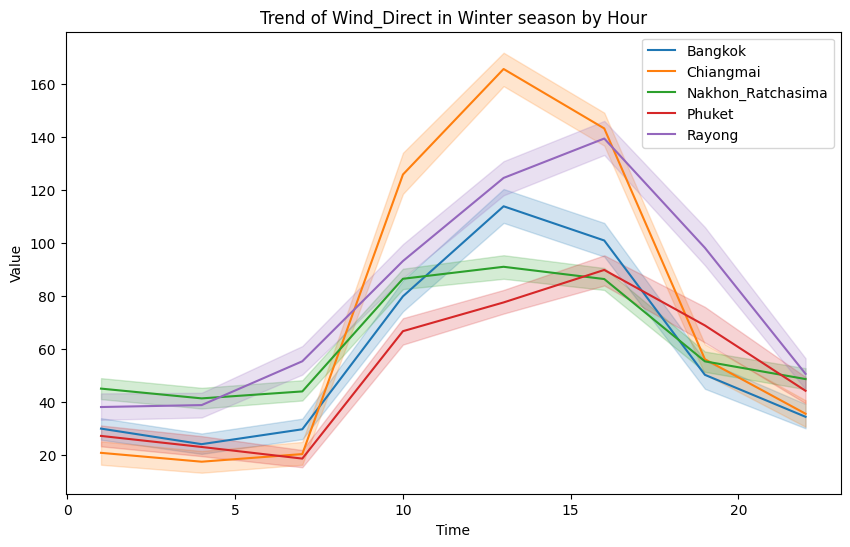

In [ ]:
for season in ['Summer','Rainy','Winter']:
  tendency_data_bytime(season)

In [ ]:
summer_df.loc[:,['month','hour','Heat_Index']]

,month,hour,Heat_Index
Datetime,,,
2014-02-16 01:00:00,2,1,28.312124
2014-02-16 04:00:00,2,4,27.739123
2014-02-16 07:00:00,2,7,28.254122
2014-02-16 10:00:00,2,10,33.256010
2014-02-16 13:00:00,2,13,36.214068
...,...,...,...
2023-05-15 10:00:00,5,10,40.822804
2023-05-15 13:00:00,5,13,41.935406
2023-05-15 16:00:00,5,16,41.582623


In [ ]:
province_name = 'Chiangmai'
season = 'Summer'
a = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv')
a['Different'] = a.Predicted_Values - a.Actual_Values
a.Predicted_Values = round(a.Predicted_Values, 1)
a.Actual_Values = round(a.Actual_Values,1)
a.Different = round(a.Different, 0)
a

,Datetime,Province,Predicted_Values,Actual_Values,predict_HI_level,Different
0,2021-05-15 22:00:00,Chiangmai,38.3,38.6,3,-0.0
1,2022-02-16 01:00:00,Chiangmai,31.3,31.3,2,-0.0
2,2022-02-16 04:00:00,Chiangmai,28.6,28.0,2,1.0
3,2022-02-16 07:00:00,Chiangmai,29.7,28.4,2,1.0
4,2022-02-16 10:00:00,Chiangmai,36.5,36.2,3,0.0
...,...,...,...,...,...,...
1420,2023-05-15 10:00:00,Chiangmai,21.1,20.4,1,1.0
1421,2023-05-15 13:00:00,Chiangmai,26.2,25.3,1,1.0
1422,2023-05-15 16:00:00,Chiangmai,22.6,23.3,1,-1.0
1423,2023-05-15 19:00:00,Chiangmai,31.9,33.4,2,-1.0


In [ ]:
import xarray as xr

def heatmap_each_province(province_name, season, data, agg):
  if data == 'actual':
    values = ['Actual_Values']
  elif data == 'predicted':
    values = ['Predicted_Values']
  elif data == 'compare':
    values = ['Actual_Values', 'Predicted_Values']

  for value in values:
    if value == 'Actual_Values':
      data = 'actual'
    elif value == 'Predicted_Values':
      data = 'predicted'

    predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv')
    predictions_df['Datetime'] = pd.to_datetime(predictions_df['Datetime'])
    predictions_df.set_index('Datetime', inplace=True)
    predictions_df.Predicted_Values = round(predictions_df.Predicted_Values, 1)
    predictions_df.Actual_Values = round(predictions_df.Actual_Values, 1)
    df = predictions_df
    df['hour']= df.index.hour
    df['month'] = df.index.month

    heatmap_df = df.loc[:,['month','hour',value]].groupby(['month','hour'],sort=False).agg([agg])
    heatmap_df.columns = heatmap_df.columns.droplevel(1)
    heatmap_df.reset_index(inplace=True)
    heatmap_data = pd.pivot_table(heatmap_df, values=value, index=['month'], columns='hour')

    colors = ['#3CB043','#92D050' ,'#92D050' ,'#92D050' ,'#92D050', '#D6EB38', '#FFFF00', '#FFAD00', '#FF9933', '#FF2400', '#FF2929', '#B90E0A']
    bounds = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
    #cmap = ListedColormap(colors)
    cmap = LinearSegmentedColormap.from_list("custom_gradient", colors, N=60)


    if season == 'Summer':
      y_axis_labels = ['Feb','Mar','Apr','May']
    elif season == 'Rainy':
      y_axis_labels = ['May','June','July','Aug','Sep','Oct']
    elif season == 'Winter':
      y_axis_labels = ['Oct','Nov','Dec','Jan','Feb']

    fig = plt.figure(figsize=(7,2.5))
    ax = fig.add_axes([0,0,1.5,1])
    sns.heatmap(heatmap_data, cmap=cmap, vmin=0, vmax=60, annot=True, annot_kws={'fontsize': 14}, fmt=".1f", yticklabels=y_axis_labels)
    plt.xlabel("Hour", size=14)
    plt.ylabel("Month", size=14)
    plt.title(f"The heatmap plot of monthly {data} HI values during {season} in {province_name}", fontsize=14)
    #plt.savefig(f'{main_save_img}Predicted_heatmap/Heatmap_{season}_{province_name}.png')
    #plt.tight_layout()
    plt.show()


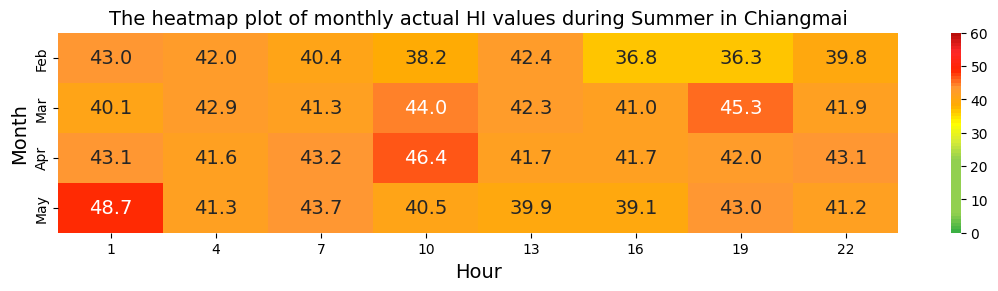

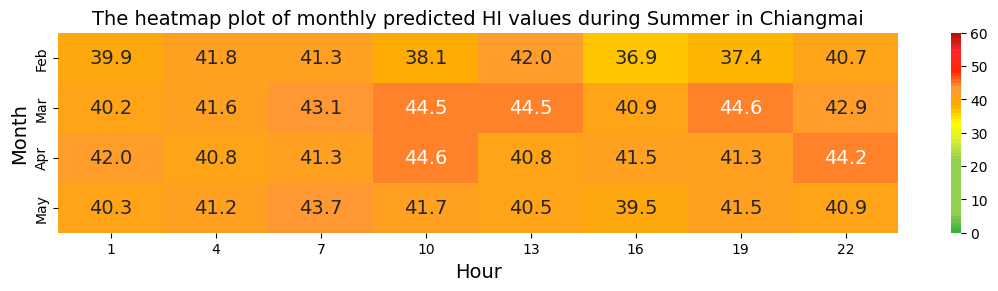

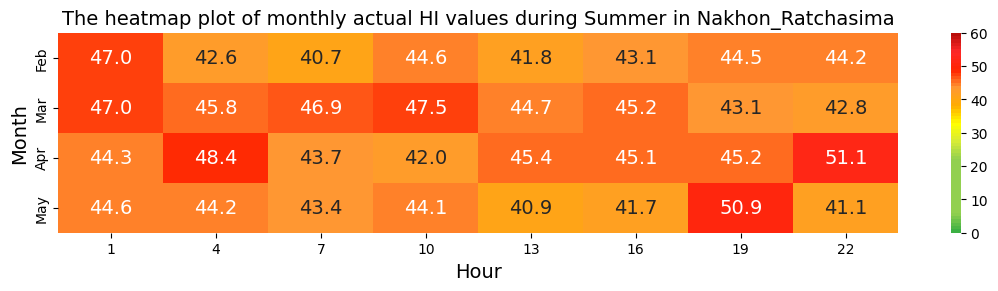

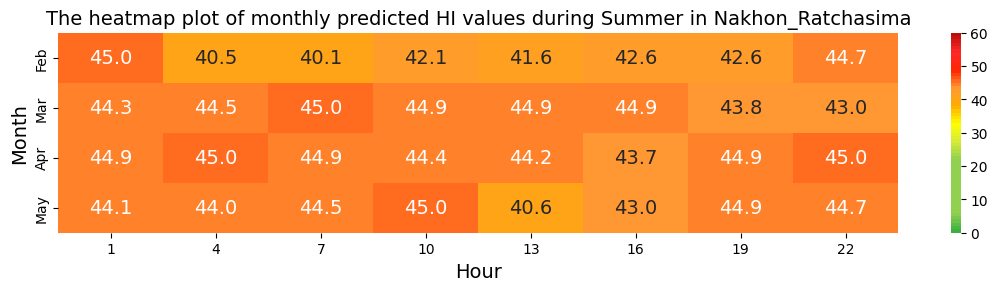

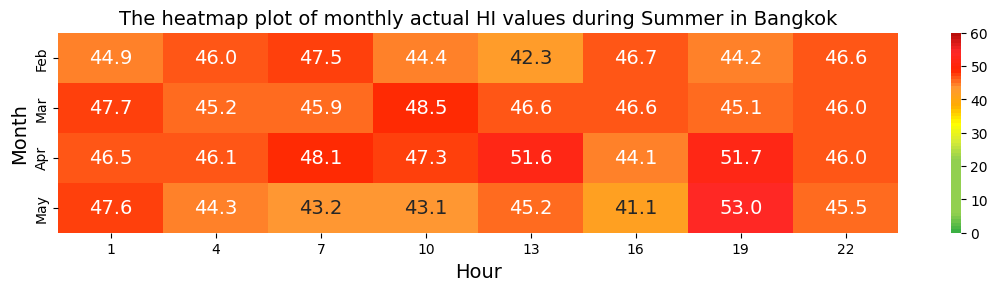

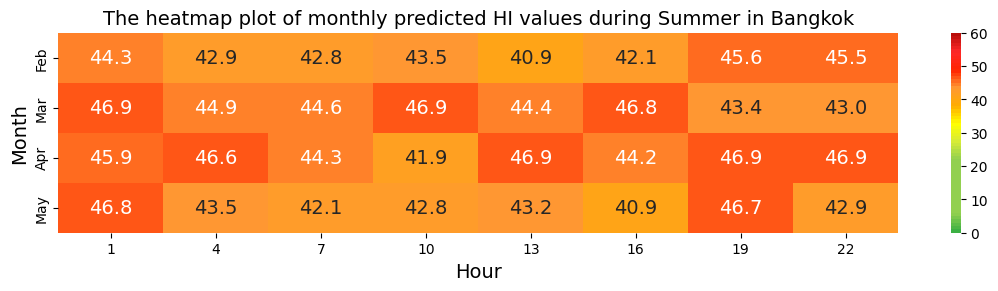

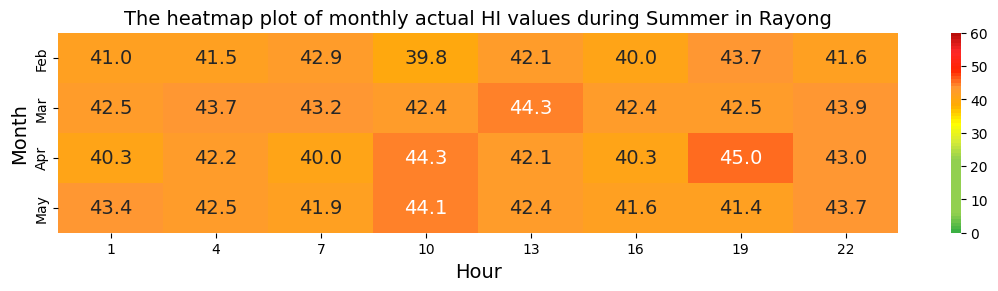

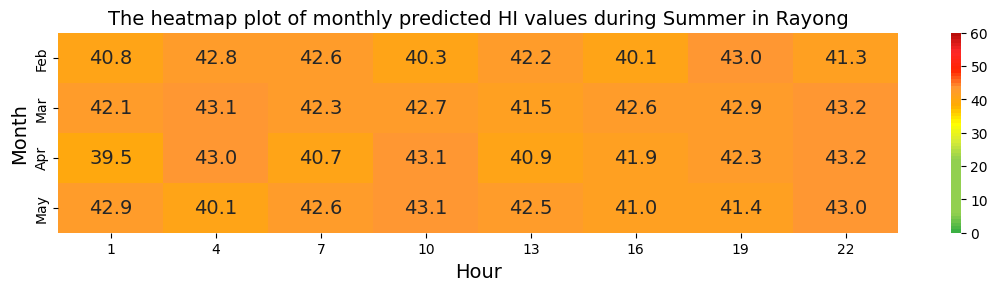

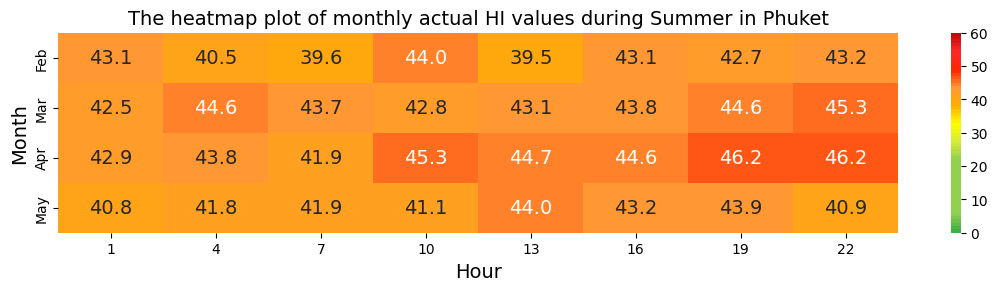

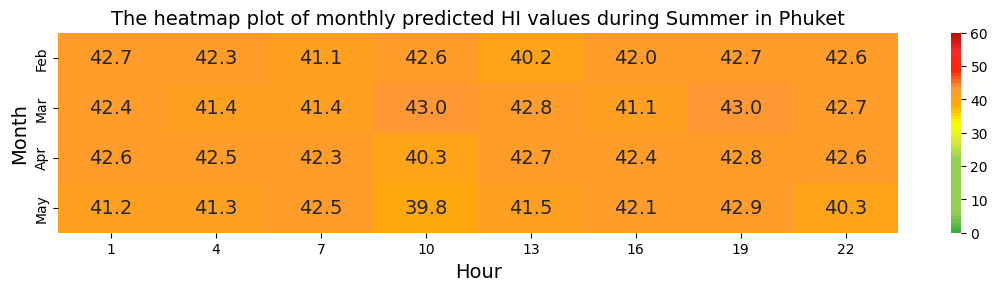

In [ ]:
# Can input max, mean, or min

for province_name in data.Province.unique():
  for d in ['actual','predicted']:
    heatmap_each_province(province_name,'Summer',d,'max')

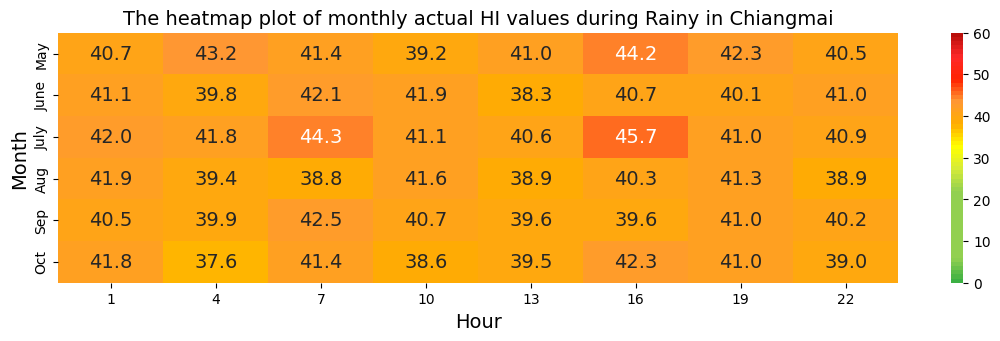

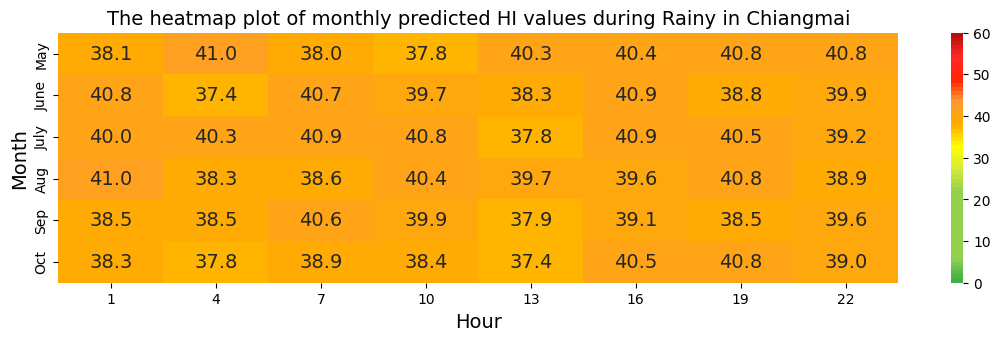

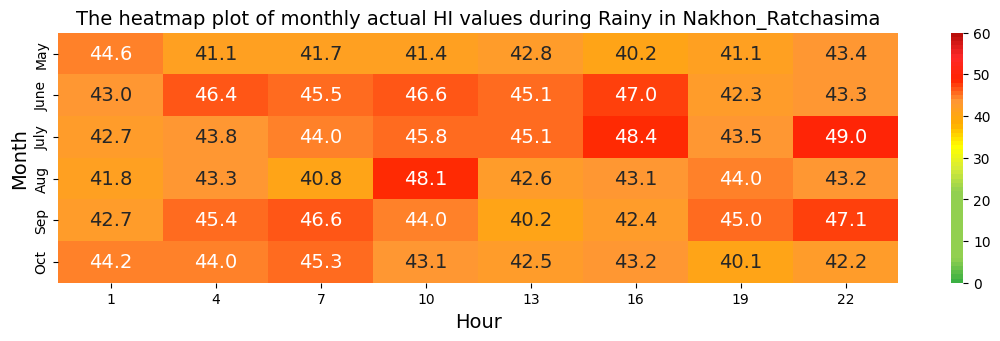

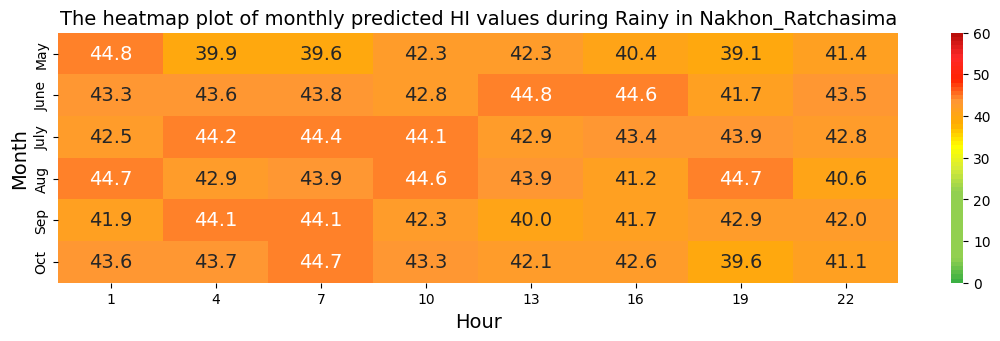

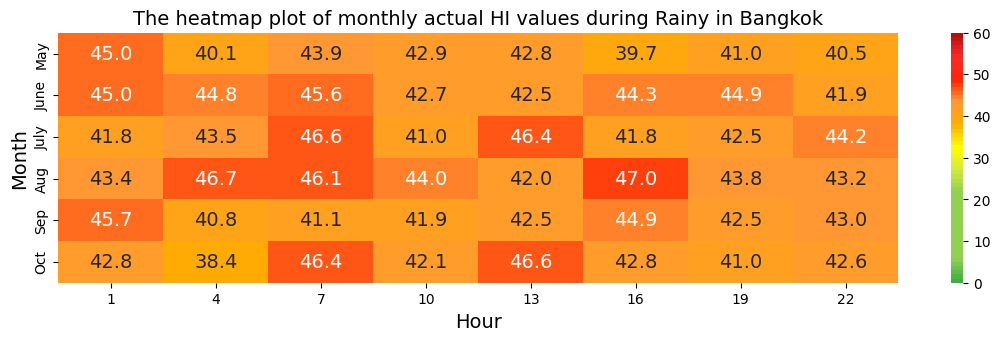

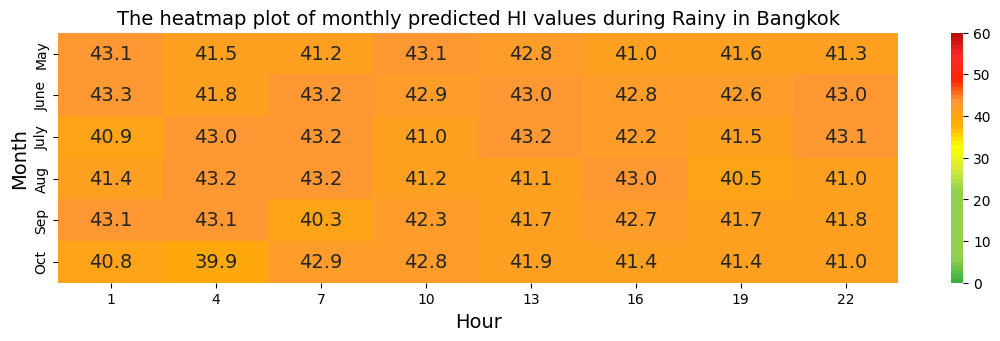

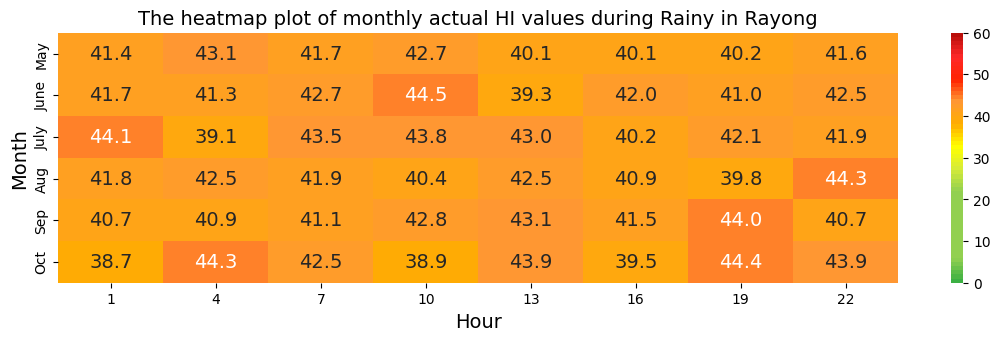

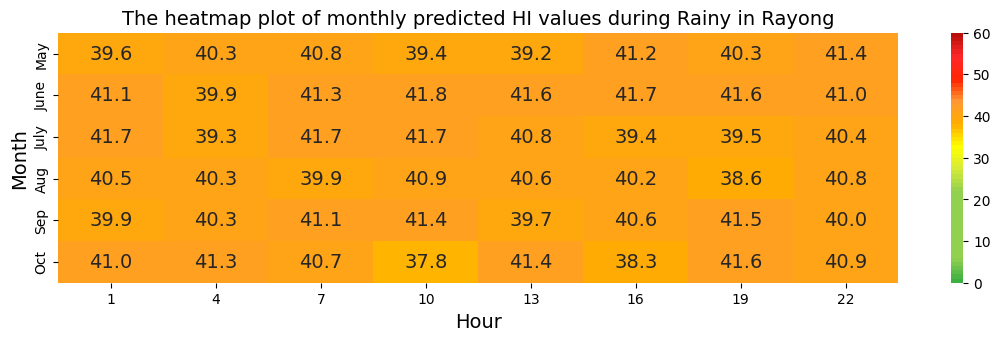

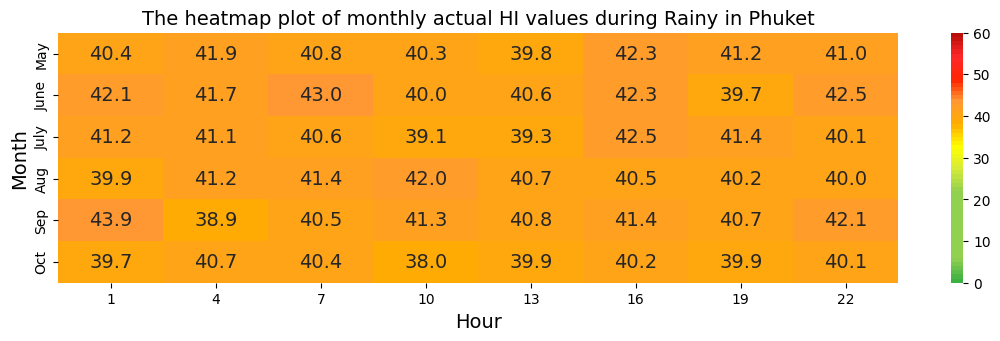

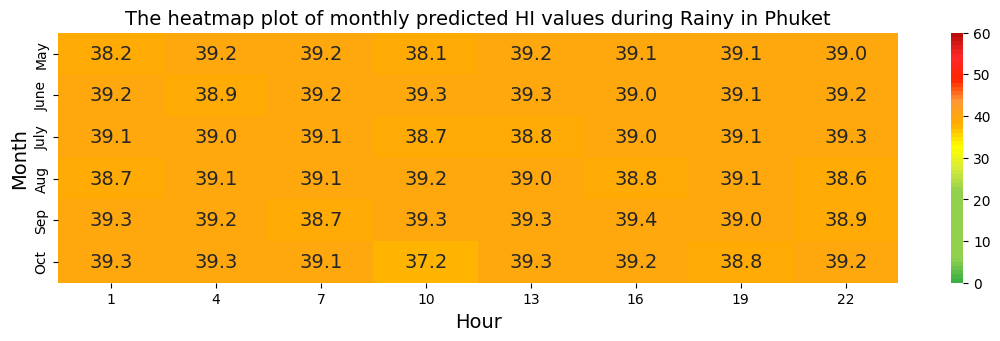

In [ ]:
for province_name in data.Province.unique():
  for d in ['actual','predicted']:
    heatmap_each_province(province_name,'Rainy',d,'max')

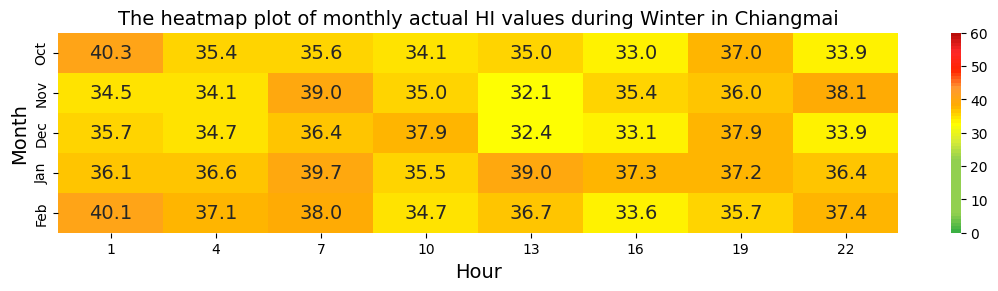

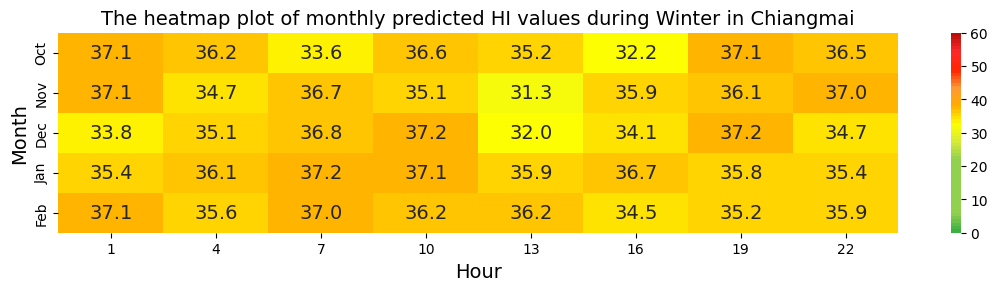

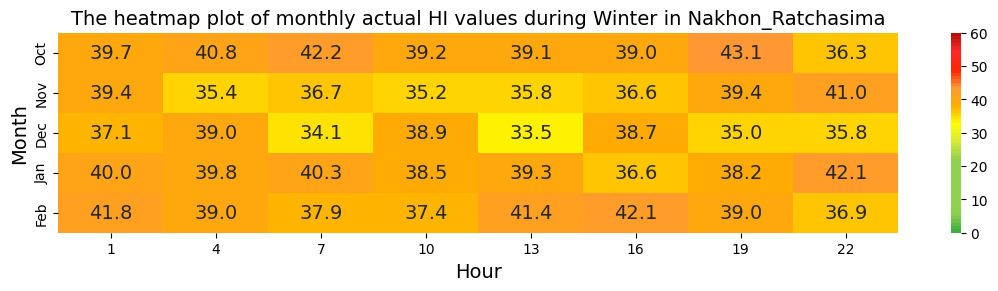

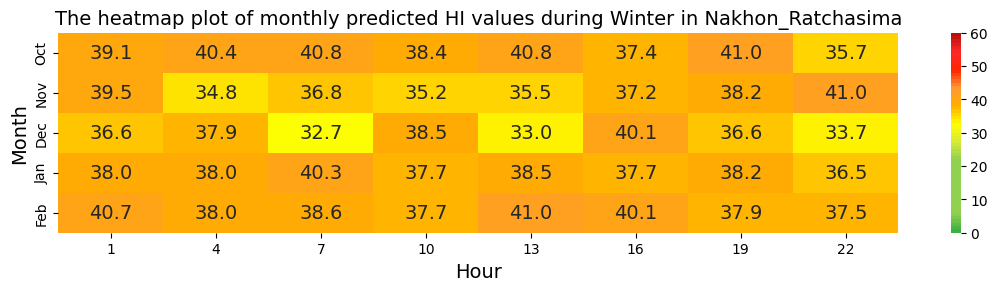

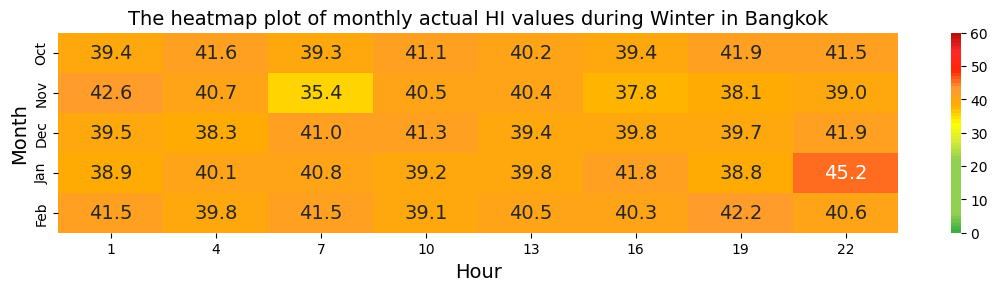

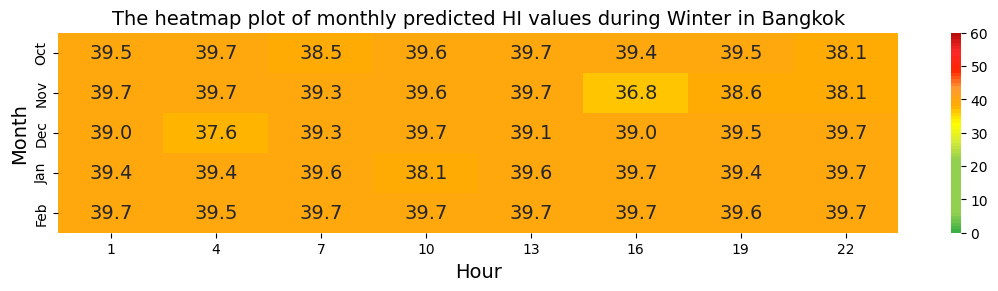

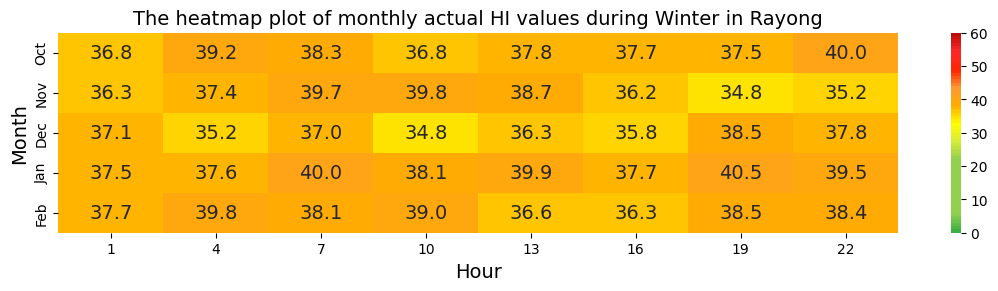

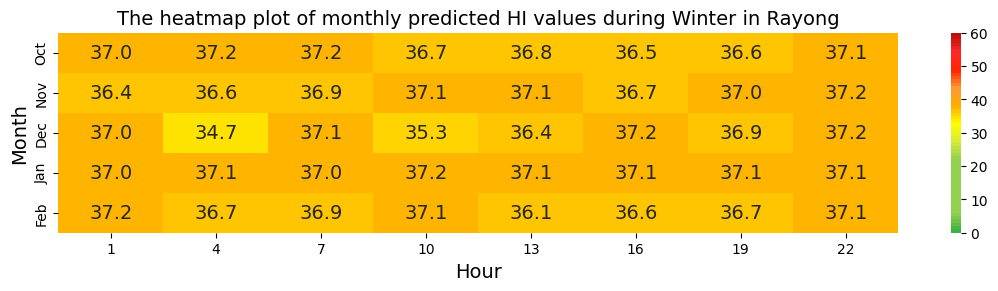

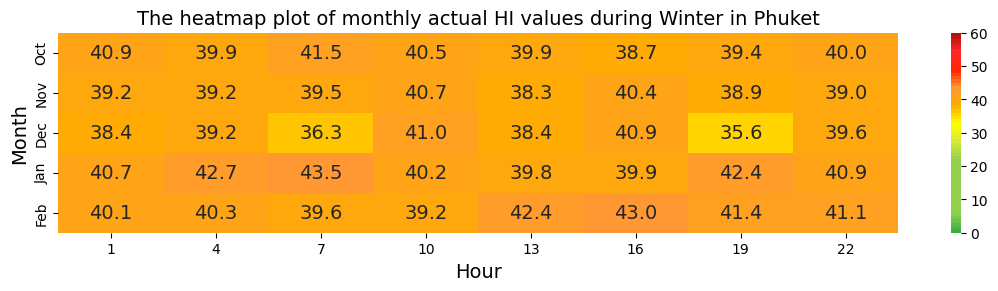

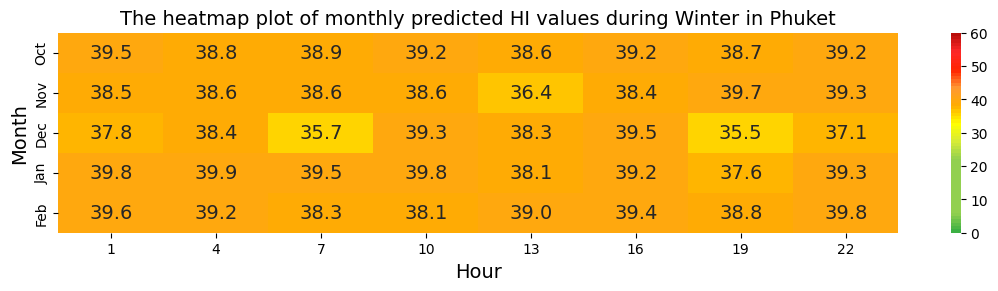

In [ ]:
for province_name in data.Province.unique():
  for d in ['actual','predicted']:
    heatmap_each_province(province_name,'Winter',d,'max')

In [ ]:
def heatmap_diff_each_province(province_name, season, agg):

    predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv')
    predictions_df['Datetime'] = pd.to_datetime(predictions_df['Datetime'])
    predictions_df.set_index('Datetime', inplace=True)
    df = predictions_df
    df['hour']= df.index.hour
    df['month'] = df.index.month

    heatmap_df = df.loc[:,['month','hour','Predicted_Values','Actual_Values']].groupby(['month','hour'],sort=False).agg([agg])
    heatmap_df.columns = heatmap_df.columns.droplevel(1)
    heatmap_df.reset_index(inplace=True)
    heatmap_df['Difference'] = heatmap_df['Predicted_Values'] - heatmap_df['Actual_Values']
    heatmap_df['Difference'] = round(heatmap_df['Difference'], 1)
    heatmap_data = pd.pivot_table(heatmap_df, values='Difference', index=['month'], columns='hour')

    if season == 'Summer':
        y_axis_labels = ['Feb','Mar','Apr','May']
    elif season == 'Rainy':
        y_axis_labels = ['May','June','July','Aug','Sep','Oct']
    elif season == 'Winter':
        y_axis_labels = ['Oct','Nov','Dec','Jan','Feb']

    fig = plt.figure(figsize=(5.5,2.5))
    ax = fig.add_axes([0,0,1.5,1])
    sns.heatmap(heatmap_data, cmap=ListedColormap(['white']), annot=True, annot_kws={'fontsize': 14}, fmt=".1f", cbar=False, yticklabels=y_axis_labels, linewidths=0.5, linecolor='black')
    plt.xlabel("Hour", size=14)
    plt.ylabel("Month", size=14)
    plt.title(f"Difference between actual and predicted HI values during {season} in {province_name}", fontsize=14)
    plt.savefig(f'{main_save_img}Difference/Diff_{season}_{province_name}.png')
    #plt.tight_layout()
    plt.show()


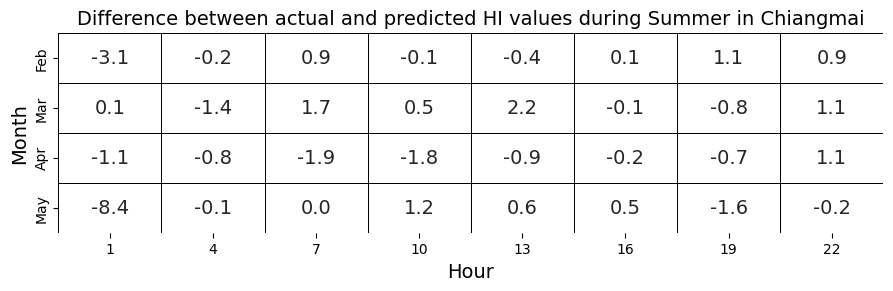

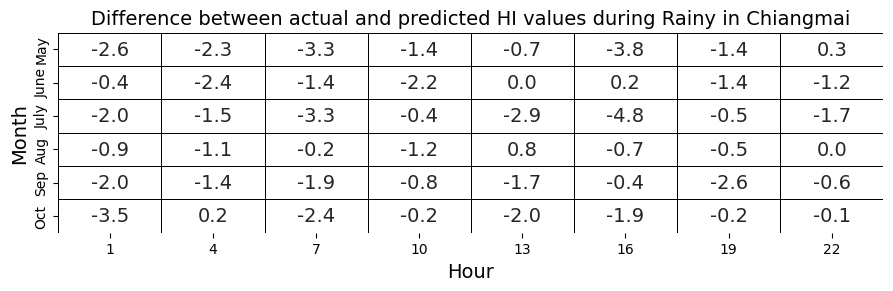

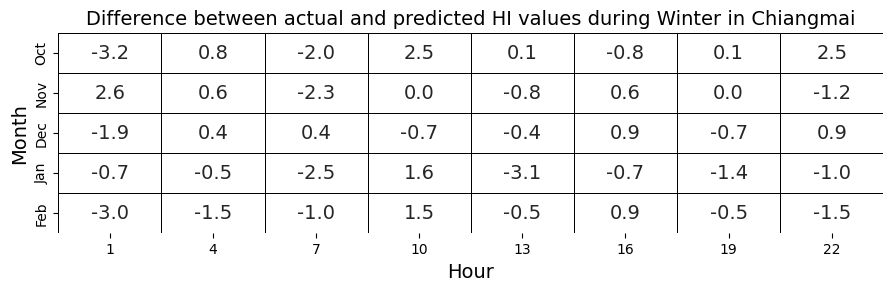

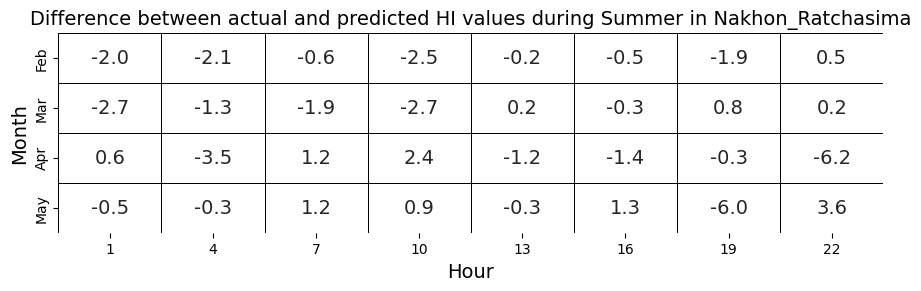

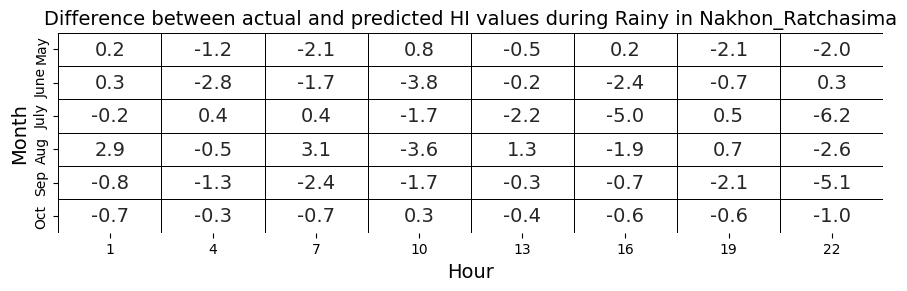

...

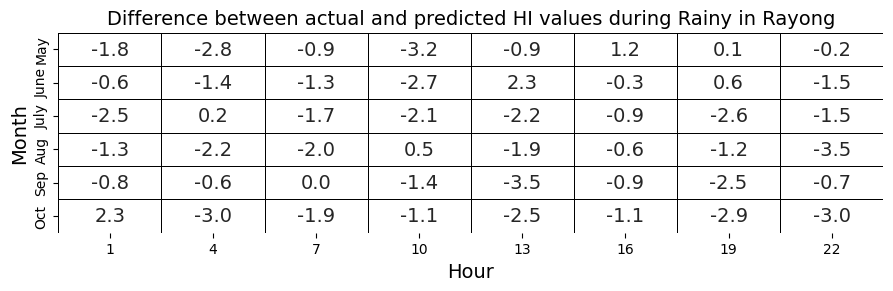

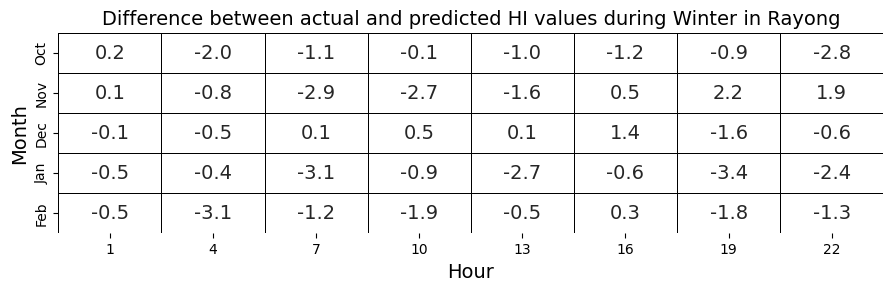

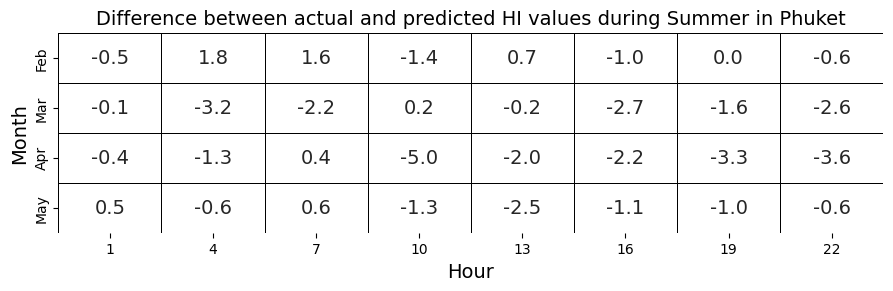

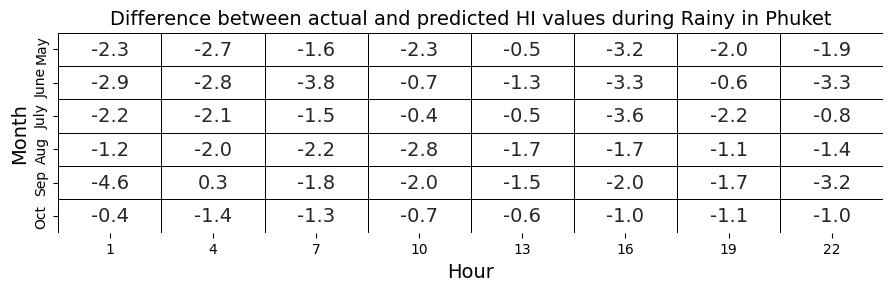

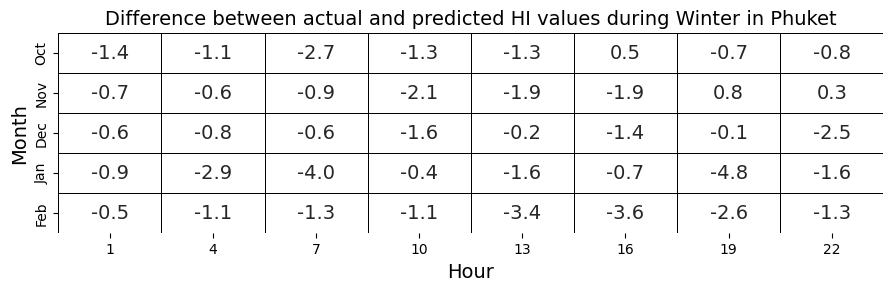

In [ ]:
for province_name in data.Province.unique():
  for season in ['Summer','Rainy','Winter']:
    heatmap_diff_each_province(province_name,season,'max')

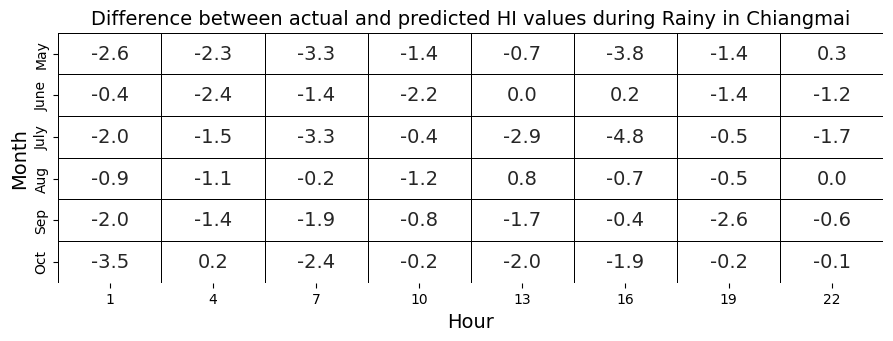

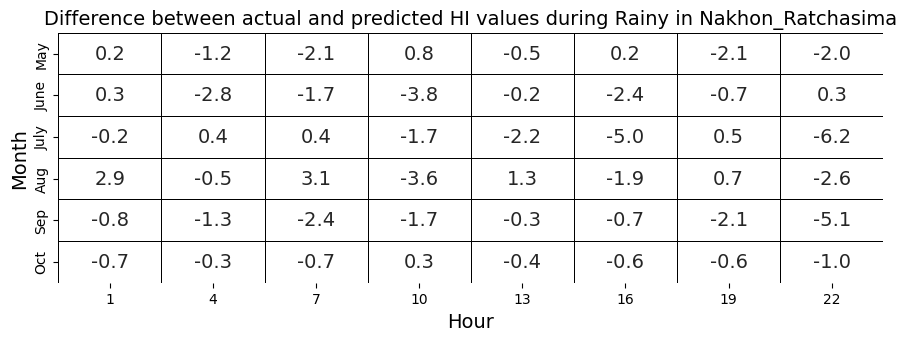

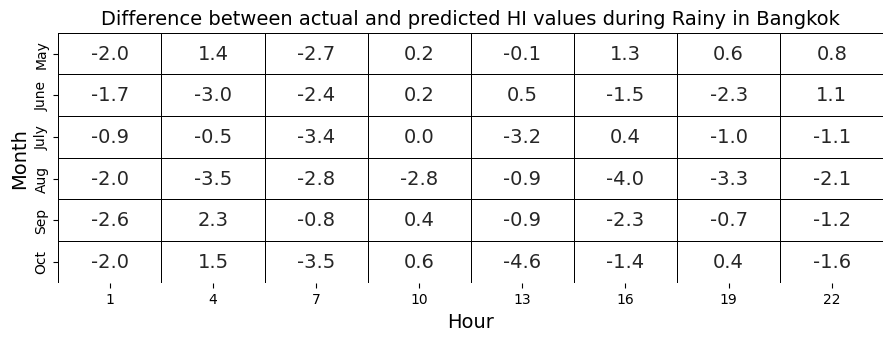

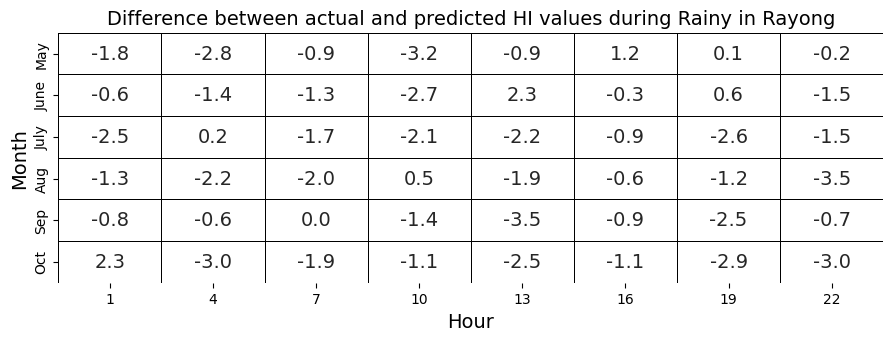

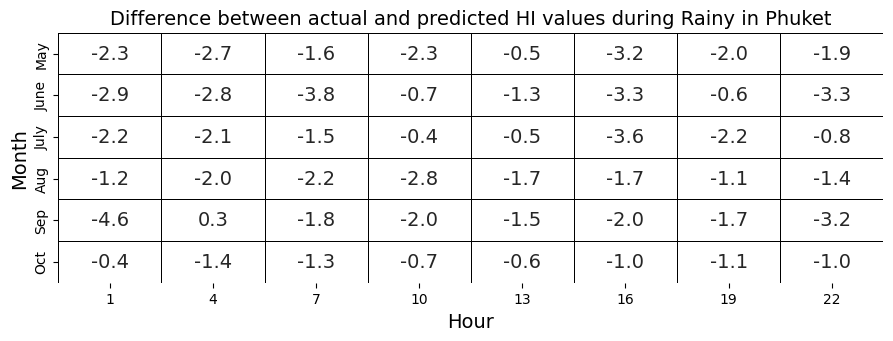

In [ ]:
for province_name in data.Province.unique():
  for season in ['Rainy']:
    heatmap_diff_each_province(province_name,season,'max')

In [ ]:
def heatmap_annually_each_province(province_name, season, data, agg):
  if data == 'actual':
    values = ['Actual_Values']
  elif data == 'predicted':
    values = ['Predicted_Values']
  elif data == 'compare':
    values = ['Actual_Values', 'Predicted_Values']

  for value in values:
    if value == 'Actual_Values':
      data = 'actual'
    elif value == 'Predicted_Values':
      data = 'predicted'


    if season == 'All':
      for season in ['Summer','Rainy','Winter']:
        predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv')
        predictions_df['Datetime'] = pd.to_datetime(predictions_df['Datetime'])
        predictions_df.set_index('Datetime', inplace=True)

        df = predictions_df
        df['hour']= df.index.hour
        df['year'] = df.index.year

        heatmap_df = df.loc[:,['year','hour',value]].groupby(['year','hour'],sort=False).agg([agg])
        heatmap_df.columns = heatmap_df.columns.droplevel(1)
        heatmap_df.reset_index(inplace=True)
        heatmap_data = pd.pivot_table(heatmap_df, values=value, index=['year'], columns='hour')

        # (left, bottom, width, height)
        fig = plt.figure(figsize=(7,3))
        ax = fig.add_axes([0,0,1.5,1])
        y_axis_labels = ['2021','2022','2023']
        sns.heatmap(heatmap_data, cmap="jet", vmin=24, vmax=36, annot=True,annot_kws={'fontsize': 14}, fmt=".1f", yticklabels=y_axis_labels)
        plt.xlabel("Hour", size=14)
        plt.ylabel("Year", size=14)
        plt.title(f"The heatmap plot of annually {data} HI value during {season} in {province_name}", fontsize=16)
        plt.tight_layout()
        #plt.savefig(f'{main_save_img}Heatmap/Heatmap_{season}_{province_name}_{data}.jpeg')

    else:
      predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv')
      predictions_df['Datetime'] = pd.to_datetime(predictions_df['Datetime'])
      predictions_df.set_index('Datetime', inplace=True)
      df = predictions_df
      df['hour']= df.index.hour
      df['year'] = df.index.year

      heatmap_df = df.loc[:,['year','hour',value]].groupby(['year','hour'],sort=False).agg([agg])
      heatmap_df.columns = heatmap_df.columns.droplevel(1)
      heatmap_df.reset_index(inplace=True)
      heatmap_data = pd.pivot_table(heatmap_df, values=value, index=['year'], columns='hour')

      colors = ['#3CB043','#92D050' ,'#92D050' ,'#92D050' ,'#92D050', '#D6EB38', '#FFFF00', '#FFAD00', '#FF9933', '#FF2400', '#FF2929', '#B90E0A']
      bounds = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
      #cmap = ListedColormap(colors)
      cmap = LinearSegmentedColormap.from_list("custom_gradient", colors, N=80)

      fig = plt.figure(figsize=(7,3))
      ax = fig.add_axes([0,0,1.5,1])
      y_axis_labels = ['2021','2022','2023']
      sns.heatmap(heatmap_data, cmap=cmap, vmin=0, vmax=60, annot=True, annot_kws={'fontsize': 14}, fmt=".1f", yticklabels=y_axis_labels)
      plt.xlabel("Hour", size=14)
      plt.ylabel("Year", size=14)
      plt.title(f"The heatmap plot of annually {data} HI value during {season} in {province_name}", fontsize=16)
      #plt.savefig(f'{main_save_img}Heatmap/Heatmap_{season}_{province_name}_{data}.jpeg')
      plt.tight_layout()


<ipython-input-54-9986b843063e>:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-54-9986b843063e>:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-54-9986b843063e>:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-54-9986b843063e>:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-54-9986b843063e>:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-54-9986b843063e>:68: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
 

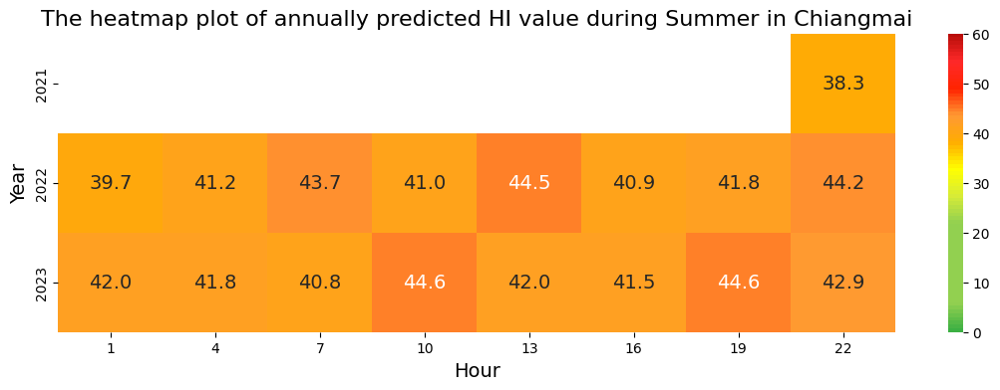

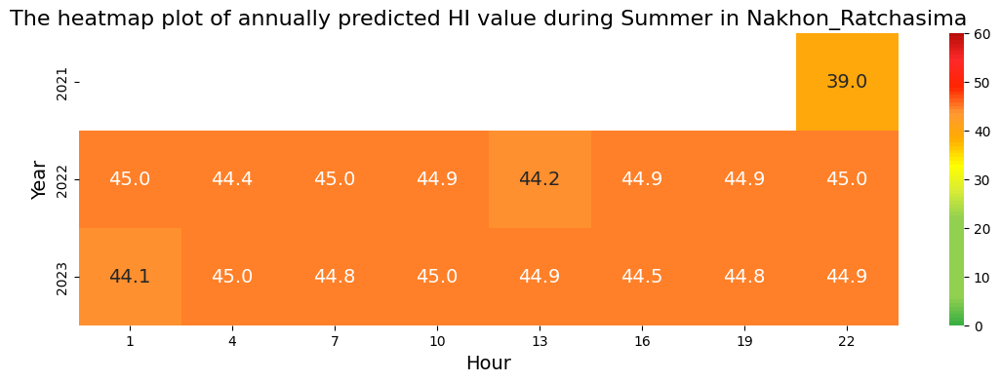

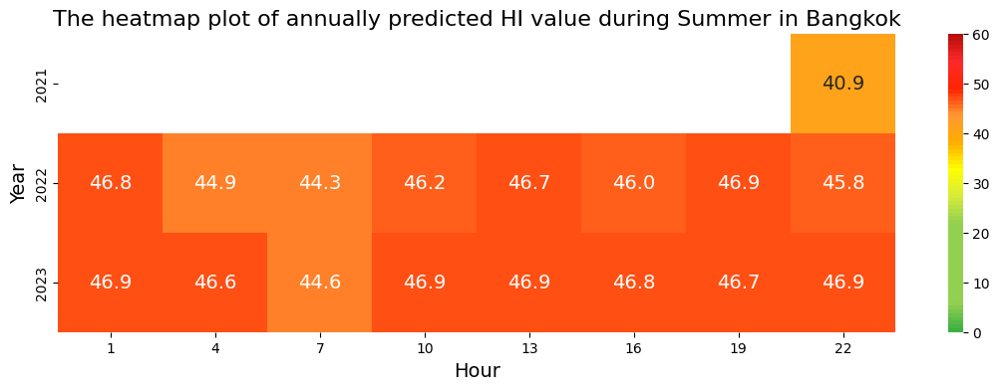

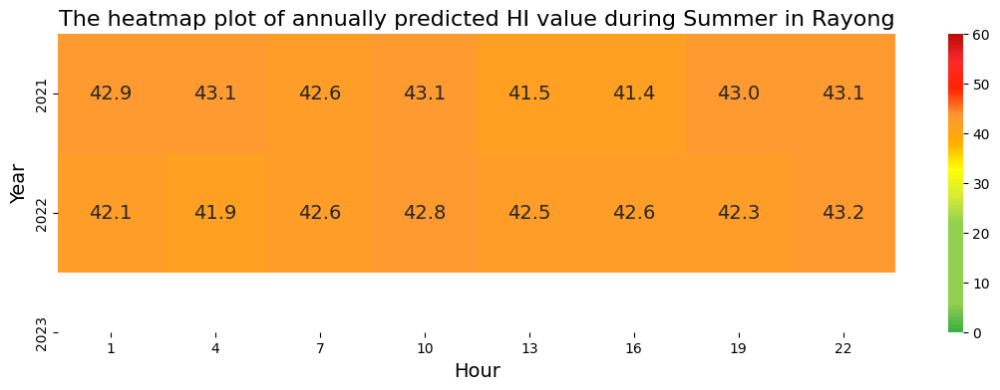

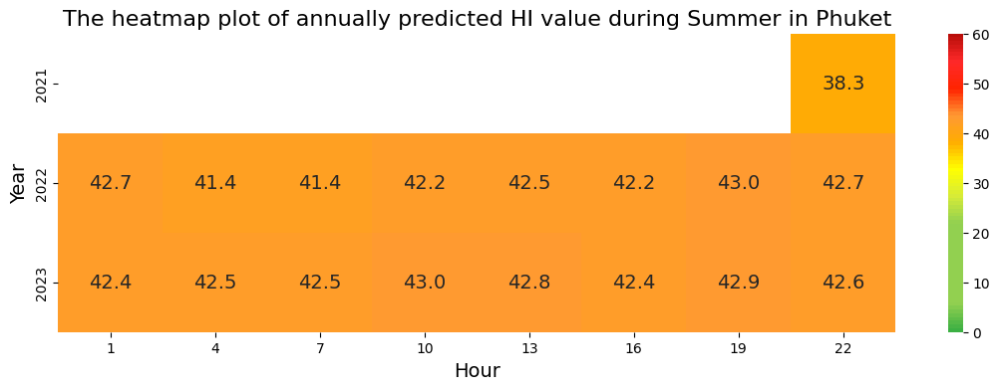

...

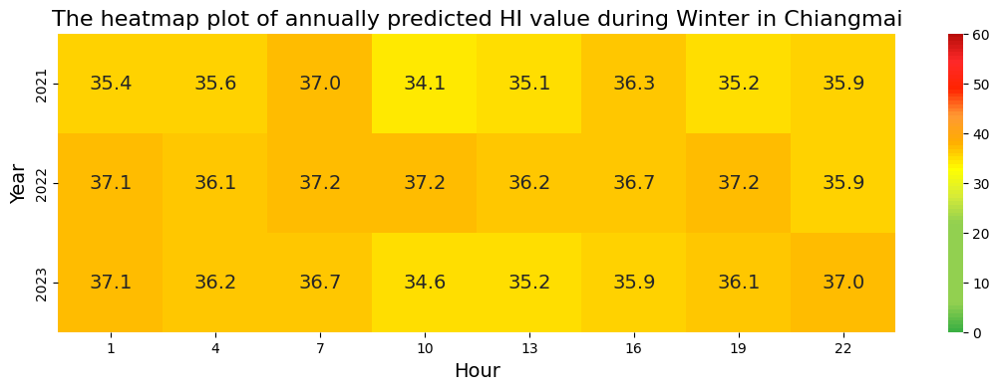

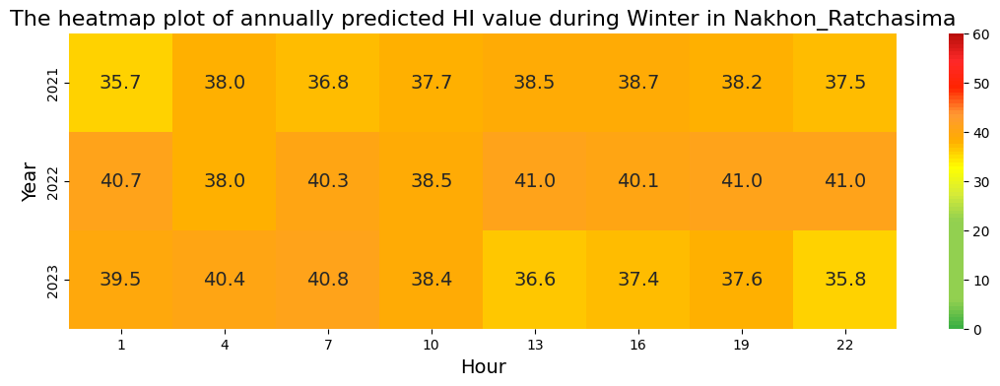

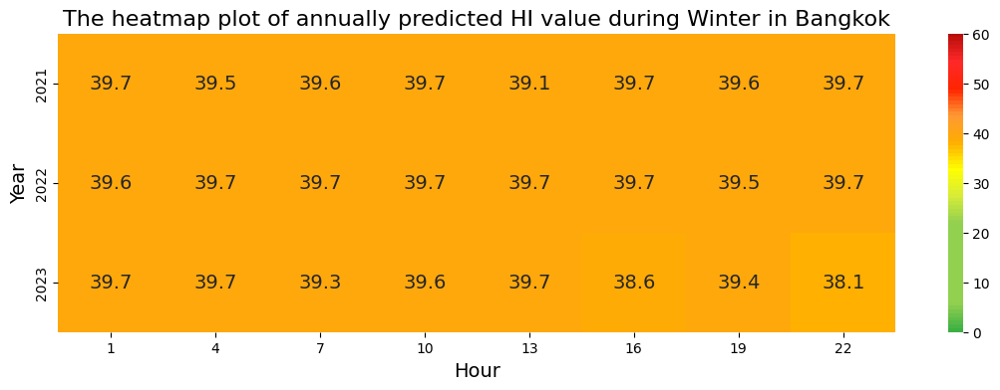

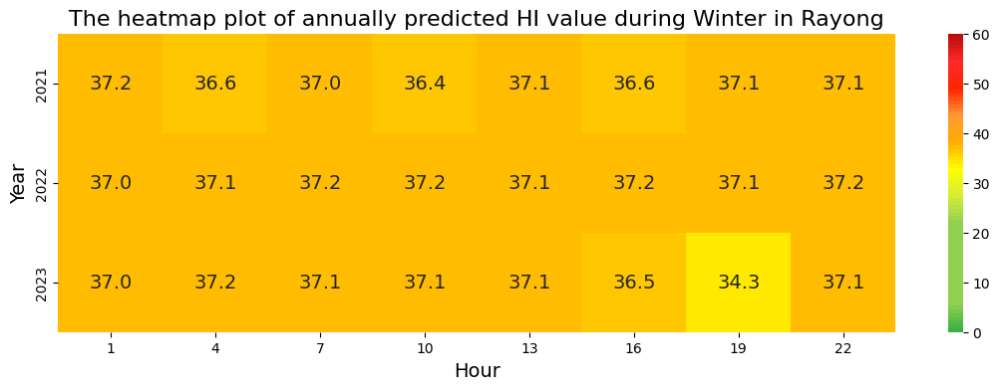

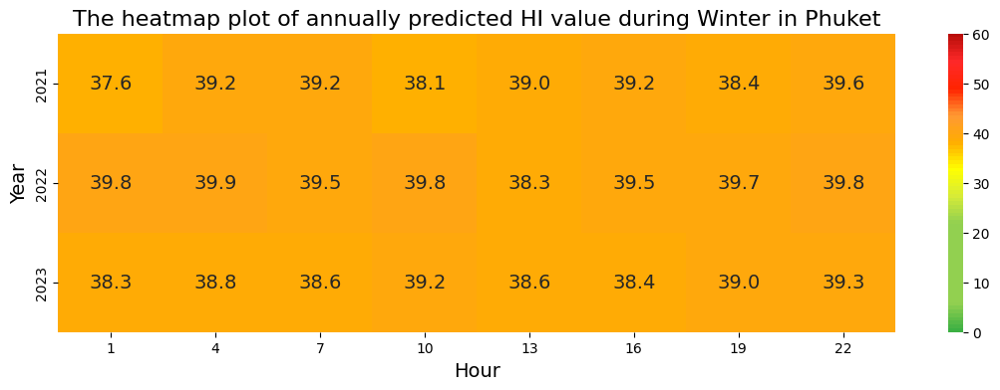

In [ ]:
for season in ['Summer','Rainy','Winter']:
  for province_name in data.Province.unique():
    heatmap_annually_each_province(province_name,season,'predicted','max')

In [ ]:
def heatmap_weekly_each_province(province_name, season, data, agg):
  if data == 'actual':
    values = ['Actual_Values']
  elif data == 'predicted':
    values = ['Predicted_Values']
  elif data == 'compare':
    values = ['Actual_Values', 'Predicted_Values']

  for value in values:
    if value == 'Actual_Values':
      data = 'actual'
    elif value == 'Predicted_Values':
      data = 'predicted'


    if season == 'All':
      for season in ['Summer','Rainy','Winter']:
        predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv')
        predictions_df['Datetime'] = pd.to_datetime(predictions_df['Datetime'])
        predictions_df['week'] = predictions_df['Datetime'].dt.weekday
        predictions_df.set_index('Datetime', inplace=True)

        df = predictions_df
        df['hour']= df.index.hour

        heatmap_df = df.loc[:,['week','hour',value]].groupby(['week','hour'],sort=False).agg([agg])
        heatmap_df.columns = heatmap_df.columns.droplevel(1)
        heatmap_df.reset_index(inplace=True)
        heatmap_data = pd.pivot_table(heatmap_df, values=value, index=['week'], columns='hour')

        # (left, bottom, width, height)
        fig = plt.figure(figsize=(7,3))
        ax = fig.add_axes([0,0,1.5,1])
        y_axis_labels = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
        sns.heatmap(heatmap_data, cmap="jet", vmin=24, vmax=36, annot=True,annot_kws={'fontsize': 14}, fmt=".1f", yticklabels=y_axis_labels)
        plt.xlabel("Hour", size=14)
        plt.ylabel("Week", size=14)
        plt.title(f"The heatmap plot of weekly {data} HI value during {season} in {province_name}", fontsize=16)
        plt.tight_layout()
        #plt.savefig(f'{main_save_img}Heatmap/Heatmap_{season}_{province_name}_{data}.jpeg')

    else:
      predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv')
      predictions_df['Datetime'] = pd.to_datetime(predictions_df['Datetime'])
      predictions_df['week'] = predictions_df['Datetime'].dt.weekday
      predictions_df.set_index('Datetime', inplace=True)
      df = predictions_df
      df['hour']= df.index.hour

      heatmap_df = df.loc[:,['week','hour',value]].groupby(['week','hour'],sort=False).agg([agg])
      heatmap_df.columns = heatmap_df.columns.droplevel(1)
      heatmap_df.reset_index(inplace=True)
      heatmap_data = pd.pivot_table(heatmap_df, values=value, index=['week'], columns='hour')

      colors = ['#3CB043','#92D050' ,'#92D050' ,'#92D050' ,'#92D050', '#D6EB38', '#FFFF00', '#FFAD00', '#FF9933', '#FF2400', '#FF2929', '#B90E0A']
      bounds = [0, 5, 10, 15, 20, 25, 30, 35, 40, 45, 50, 55, 60]
      #cmap = ListedColormap(colors)
      cmap = LinearSegmentedColormap.from_list("custom_gradient", colors, N=80)


      fig = plt.figure(figsize=(7,2.5))
      ax = fig.add_axes([0,0,1.5,1])
      y_axis_labels = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
      sns.heatmap(heatmap_data, cmap=cmap, vmin=0, vmax=60, annot=True, annot_kws={'fontsize': 14}, fmt=".1f", yticklabels=y_axis_labels)
      plt.xlabel("Hour", size=14)
      plt.ylabel("Week", size=14)
      plt.title(f"The heatmap plot of weekly {data} HI value during {season} in {province_name}", fontsize=16)
      #plt.savefig(f'{main_save_img}Heatmap/Heatmap_{season}_{province_name}_{data}.jpeg')
      plt.tight_layout()


<ipython-input-79-9f1a2dd0ce84>:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-79-9f1a2dd0ce84>:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-79-9f1a2dd0ce84>:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-79-9f1a2dd0ce84>:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-79-9f1a2dd0ce84>:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()
<ipython-input-79-9f1a2dd0ce84>:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
 

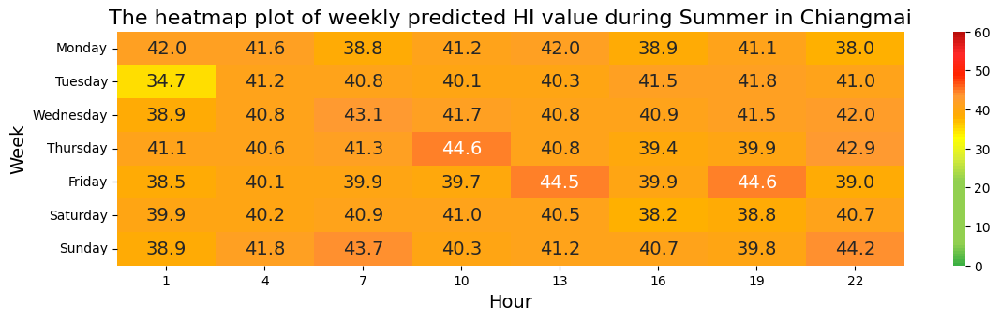

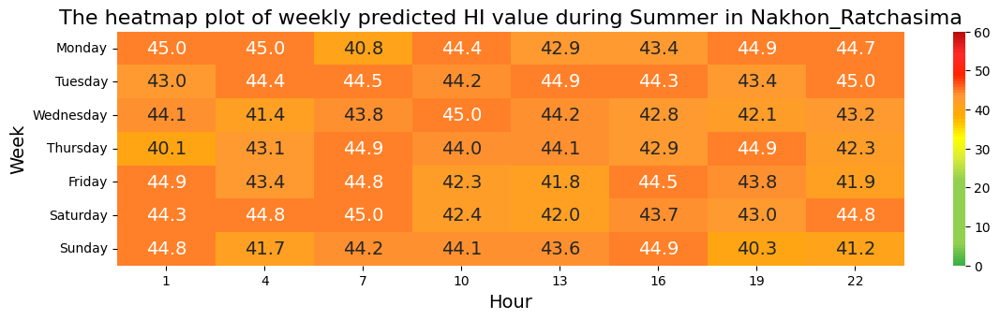

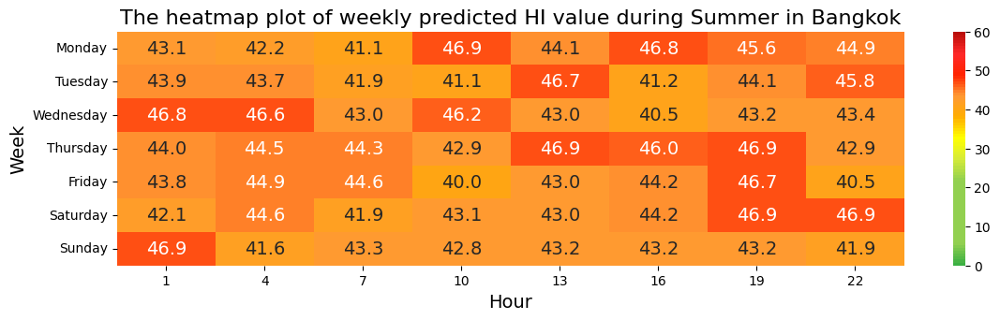

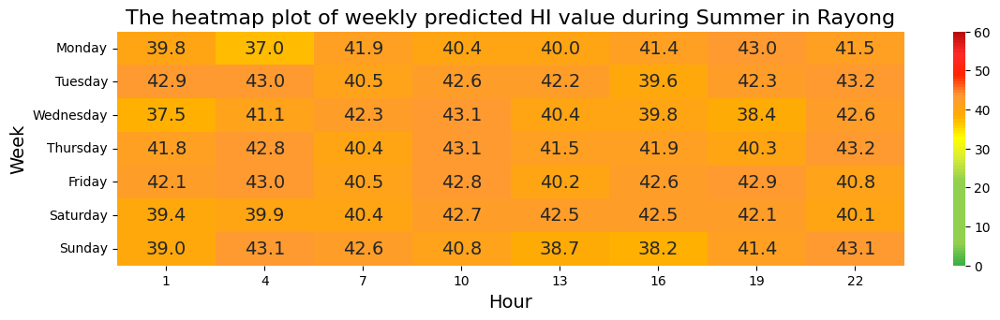

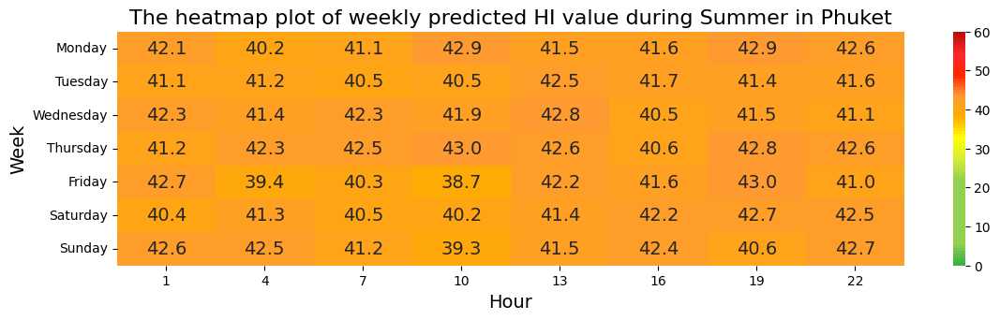

...

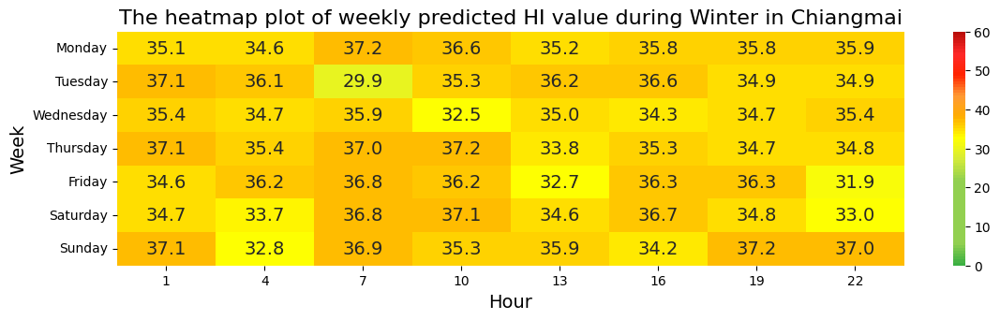

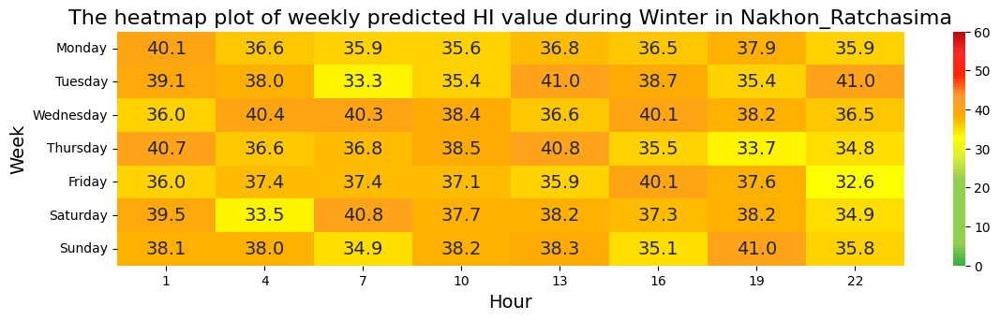

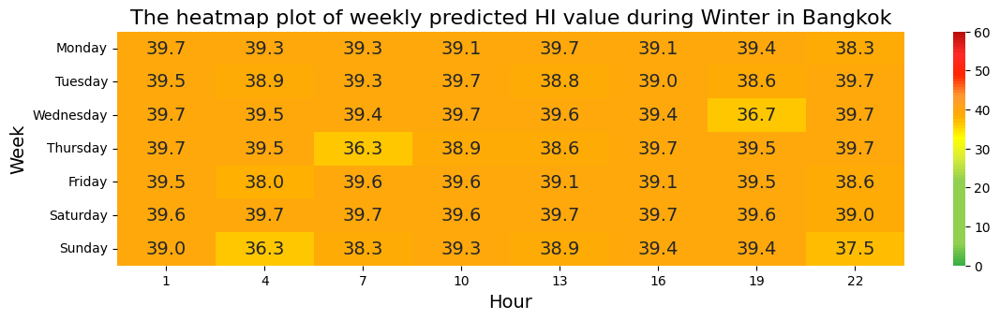

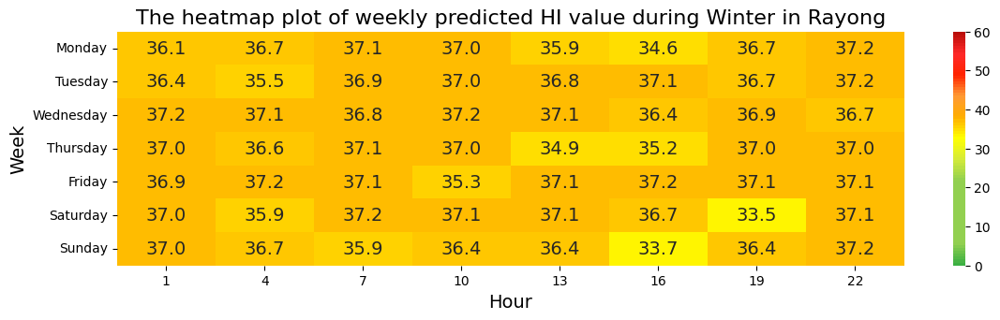

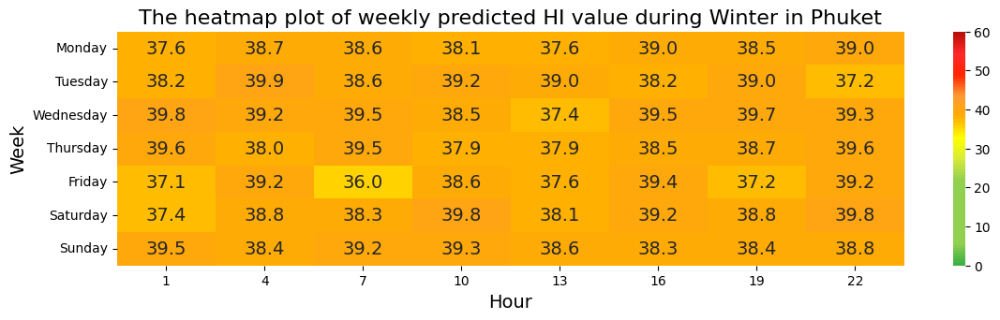

In [ ]:
for season in ['Summer','Rainy','Winter']:
  for province_name in data.Province.unique():
    heatmap_weekly_each_province(province_name,season,'predicted','max')

### Edit Parameter ###

In [ ]:
error_df = pd.DataFrame(columns=['Province','Season','RMSE','MAE','MAPE'])

In [ ]:
error_df = pd.read_csv(f'{main_path_data}error_df_dropWD_mt360.csv')
predictions_df = pd.DataFrame(columns=['Datetime','Province', 'Predicted_Values', 'Actual_Values'])

In [ ]:
main_save_model_directory = f'/content/drive/My Drive/Senior Project/Coding/Model/'
main_save_img = f'/content/drive/My Drive/Senior Project/Coding/Image/'

In [ ]:
features4 = ['Temp','Humid','Wind_Speed','Wind_Direct','Heat_Index']

In [ ]:
data = pd.read_csv(f'{main_path_data}data_dropWD_mt360.csv')
summer_df = read_ori_type(pd.read_csv(f'{main_path_data}summer_df_dropWD_mt360.csv'))
rainy_df = read_ori_type(pd.read_csv(f'{main_path_data}rainy_df_dropWD_mt360.csv'))
winter_df = read_ori_type(pd.read_csv(f'{main_path_data}winter_df_dropWD_mt360.csv'))

In [ ]:
data

,Datetime,Province,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
0,2014-01-01 01:00:00,Chiangmai,17.1,90.0,0.000000,0.0,17.459972,1
1,2014-01-02 01:00:00,Chiangmai,17.5,88.0,0.000000,0.0,18.184228,1
2,2014-01-03 01:00:00,Chiangmai,18.5,90.0,0.000000,0.0,17.375620,1
3,2014-01-04 01:00:00,Chiangmai,18.7,90.0,0.000000,0.0,17.414006,1
4,2014-01-05 01:00:00,Chiangmai,20.1,91.0,0.000000,0.0,17.729534,1
...,...,...,...,...,...,...,...,...
141017,2023-08-27 22:00:00,Phuket,28.5,85.0,0.000000,0.0,33.749815,3
141018,2023-08-28 22:00:00,Phuket,28.5,85.0,0.000000,0.0,33.749815,3
141019,2023-08-29 22:00:00,Phuket,27.4,92.0,0.000000,0.0,31.542570,2
141020,2023-08-30 22:00:00,Phuket,28.8,82.0,2.057776,290.0,34.027390,3


In [ ]:
data.dtypes

Datetime       datetime64[ns]
Province               object
Temp                  float64
Humid                 float64
Wind_Speed            float64
Wind_Direct           float64
Heat_Index            float64
HI_level                int64
dtype: object

In [ ]:
data['Datetime'] = pd.to_datetime(data['Datetime'])

In [ ]:
def bidirect_model(province_name, season, feature_sets=[features4], sequence_length=8, epochs=100):

    dfs_to_concat_predictions = []

    if season == 'Summer':
        df = summer_df
    elif season == 'Rainy':
        df = rainy_df
    else:
        df = winter_df

    for features in feature_sets:
        province_data = df[df['Province'] == province_name]

        sequences = []
        targets = []

        for i in range(len(province_data) - sequence_length):
            sequence = province_data.iloc[i : i + sequence_length][features]
            target = province_data.iloc[i + sequence_length]['Heat_Index']
            sequences.append(sequence.values)
            targets.append(target)

        X = np.array(sequences)
        y = np.array(targets)

        # Scaling X
        scaler = RobustScaler()
        X_scaled = scaler.fit_transform(X.reshape(-1, X.shape[-1])).reshape(X.shape)

        X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=24)

        num_features = len(features)
        model = Sequential()
        model.add(Bidirectional(LSTM(units=64, input_shape=(X.shape[1], X.shape[2]), activation='tanh', recurrent_activation='sigmoid',
                             dropout=0.2, recurrent_dropout=0.2, return_sequences=True)))
        model.add(Bidirectional(LSTM(64, activation='tanh', recurrent_activation='sigmoid')))
        model.add(Dense(32, activation='tanh'))
        model.add(Dense(1))

        model.compile(loss='mean_squared_error', optimizer=Adam(learning_rate=0.001), metrics=['mean_absolute_error', 'mean_absolute_percentage_error'])

        model.fit(X_train, y_train, epochs=epochs, batch_size=32)

        predictions = model.predict(X_test).flatten()

        datetime_values = province_data.iloc[-len(y_test):].index.values
        predictions_df = pd.DataFrame({'Datetime': datetime_values,
                                              'Province': province_name,
                                              'Predicted_Values': predictions,
                                              'Actual_Values': y_test})

        # Add HI_level based on the provided bins and labels
        bins = [-float('inf'), 27, 32, 41, 54, float('inf')]
        labels = ['1', '2', '3', '4', '5']
        predictions_df['predict_HI_level'] = pd.cut(predictions_df['Predicted_Values'], bins=bins, labels=labels, right=False)

        dfs_to_concat_predictions.append(predictions_df)

    # Concatenate DataFrames
    predictions_df = pd.concat([predictions_df] + dfs_to_concat_predictions, ignore_index=True)
    predictions_df = predictions_df.drop_duplicates()

    predicted_file_path = f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv'
    predictions_df.to_csv(predicted_file_path, index=False)

    return model

In [ ]:
def update_error_df(error_df, province_name, season):
    predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv')

    mse = mean_squared_error(predictions_df['Actual_Values'], predictions_df['Predicted_Values'])
    msle = mean_squared_log_error(predictions_df['Actual_Values'], predictions_df['Predicted_Values'])
    mae = mean_absolute_error(predictions_df['Actual_Values'], predictions_df['Predicted_Values'])
    mape = mean_absolute_percentage_error(predictions_df['Actual_Values'], predictions_df['Predicted_Values'])

    # Add HI_level based on the provided bins and labels
    bins = [-float('inf'), 27, 32, 41, 54, float('inf')]
    labels = ['1', '2', '3', '4', '5']

    # Calculate classification metrics
    y_pred_categorical = pd.cut(predictions_df['Predicted_Values'], bins=bins, labels=labels, right=False)
    y_true_categorical = pd.cut(predictions_df['Actual_Values'], bins=bins, labels=labels, right=False)

    accuracy = accuracy_score(y_true_categorical, y_pred_categorical)
    recall = recall_score(y_true_categorical, y_pred_categorical, labels=labels, average='weighted', zero_division=1)
    precision = precision_score(y_true_categorical, y_pred_categorical, labels=labels, average='weighted', zero_division=1)
    f1 = f1_score(y_true_categorical, y_pred_categorical, labels=labels, average='weighted', zero_division=1)

    new_data = {'Province': province_name, 'Season': season, 'RMSE': math.sqrt(mse),
                'MAE': mae, 'MAPE': mape, 'Accuracy': accuracy, 'Recall': recall,
                'Precision': precision, 'F1_Score': f1}

    # Append new data to DataFrame
    error_df = error_df.append(new_data, ignore_index=True)
    error_file_path = f'{main_path_data}error_df_dropWD_mt360.csv'
    error_df.to_csv(error_file_path, index=False)

    return error_df


In [ ]:
province_name = 'Bangkok'
season = 'Summer'
test = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv')

In [ ]:
import tensorflow as tf
from tensorflow import keras

model = tf.keras.models.load_model(f"{main_save_model_directory}{province_name}_{season}_model_dropWD_mt360.h5")

In [ ]:
model.predict

#### Executing ####

In [ ]:
province_name = 'Bangkok'

for season in ['Summer']:
  model = bidirect_model(province_name, season)
  model.save(f"{main_save_model_directory}{province_name}_{season}_model_dropWD_mt360.h5")

Epoch 1/100
179/179 [==============================] - 18s 35ms/step - loss: 714.8796 - mean_absolute_error: 26.0788 - mean_absolute_percentage_error: 73.2539
Epoch 2/100
179/179 [==============================] - 12s 70ms/step - loss: 415.0539 - mean_absolute_error: 19.7194 - mean_absolute_percentage_error: 54.8983
Epoch 3/100
179/179 [==============================] - 12s 64ms/step - loss: 249.1660 - mean_absolute_error: 14.9514 - mean_absolute_percentage_error: 41.1287
Epoch 4/100
179/179 [==============================] - 6s 33ms/step - loss: 145.2861 - mean_absolute_error: 10.9989 - mean_absolute_percentage_error: 29.7718
Epoch 5/100
179/179 [==============================] - 9s 48ms/step - loss: 84.3723 - mean_absolute_error: 7.9693 - mean_absolute_percentage_error: 21.2622
Epoch 6/100
179/179 [==============================] - 8s 46ms/step - loss: 51.4051 - mean_absolute_error: 5.9593 - mean_absolute_percentage_error: 15.9080
Epoch 7/100
179/179 [==============================] 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [ ]:
season = 'Summer'
predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv')
predictions_df

,Datetime,Province,Predicted_Values,Actual_Values,predict_HI_level
0,2021-05-15 22:00:00,Bangkok,40.921303,41.973399,3
1,2022-02-16 01:00:00,Bangkok,44.263382,44.875133,4
2,2022-02-16 04:00:00,Bangkok,37.648476,37.718290,3
3,2022-02-16 07:00:00,Bangkok,36.986565,37.016300,3
4,2022-02-16 10:00:00,Bangkok,33.833490,33.761421,3
...,...,...,...,...,...
1420,2023-05-15 10:00:00,Bangkok,27.452368,26.973086,2
1421,2023-05-15 13:00:00,Bangkok,41.341230,27.536629,4
1422,2023-05-15 16:00:00,Bangkok,30.313656,33.047586,2
1423,2023-05-15 19:00:00,Bangkok,41.124588,43.261038,4


In [ ]:
# Summer in Bangkok

mse = mean_squared_error(predictions_df['Actual_Values'],predictions_df['Predicted_Values'])
msle = mean_squared_log_error(predictions_df['Actual_Values'],predictions_df['Predicted_Values'])
mae = mean_absolute_error(predictions_df['Actual_Values'],predictions_df['Predicted_Values'])
mape = mean_absolute_percentage_error(predictions_df['Actual_Values'],predictions_df['Predicted_Values'])

print('RMSE:', math.sqrt(mse))
print('MSLE:', msle)
print('MAE: ', mae)
print('MAPE:', mape)

RMSE: 2.090640461350167
MSLE: 0.0036246436642606537
MAE:  1.351282803083457
MAPE: 0.039527456751267426


In [ ]:
season = 'Summer'
error_df = update_error_df(error_df, province_name, season)
error_df

<ipython-input-128-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


,Province,Season,RMSE,MAE,MAPE,Accuracy,Recall,Precision,F1_Score
0,Bangkok,Summer,2.09064,1.351283,0.039527,0.839298,0.839298,0.837473,0.836473


In [ ]:
error_df

,Province,Season,RMSE,MAE,MAPE,Accuracy,Recall,Precision,F1_Score
0,Bangkok,Summer,2.090640,1.351283,0.039527,0.839298,0.839298,0.837473,0.836473
1,Chiangmai,Summer,1.596604,1.045660,0.035445,0.858947,0.858947,0.858094,0.857885


In [ ]:
new_data = {'Province': province_name,'Season': 'Summer', 'MSE': mse, 'RMSE': math.sqrt(mse),
            'MSLE': msle, 'MAE': mae, 'MAPE': mape}

# Append new data to DataFrame
error_df = error_df.append(new_data, ignore_index=True)
error_df

<ipython-input-194-b205d4c4a687>:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


,Province,Season,MSE,RMSE,MSLE,MAE,MAPE
0,Bangkok,Summer,4.603339,2.145539,0.003811,1.353785,0.03971


In [ ]:
province_name = 'Chiangmai'

for season in ['Summer']:
  model = bidirect_model(province_name, season)
  model.save(f"{main_save_model_directory}{province_name}_{season}_model_dropWD_mt360.h5")
  error_df = update_error_df(error_df, province_name, season)

Epoch 1/100
179/179 [==============================] - 21s 45ms/step - loss: 501.4648 - mean_absolute_error: 21.4822 - mean_absolute_percentage_error: 70.1817
Epoch 2/100
179/179 [==============================] - 6s 34ms/step - loss: 274.7090 - mean_absolute_error: 15.5308 - mean_absolute_percentage_error: 49.7850
Epoch 3/100
179/179 [==============================] - 8s 45ms/step - loss: 154.8278 - mean_absolute_error: 11.0537 - mean_absolute_percentage_error: 34.4242
Epoch 4/100
179/179 [==============================] - 8s 46ms/step - loss: 88.2419 - mean_absolute_error: 7.7322 - mean_absolute_percentage_error: 23.3664
Epoch 5/100
179/179 [==============================] - 8s 44ms/step - loss: 54.7496 - mean_absolute_error: 5.8477 - mean_absolute_percentage_error: 17.7390
Epoch 6/100
179/179 [==============================] - 6s 34ms/step - loss: 39.8468 - mean_absolute_error: 5.0498 - mean_absolute_percentage_error: 15.9250
Epoch 7/100
179/179 [==============================] - 8s

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


In [ ]:
pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df_dropWD_mt360.csv')

,Datetime,Province,Predicted_Values,Actual_Values,predict_HI_level
0,2021-05-15 22:00:00,Chiangmai,38.342823,38.555720,3
1,2022-02-16 01:00:00,Chiangmai,31.276672,31.298226,2
2,2022-02-16 04:00:00,Chiangmai,28.629185,28.019745,2
3,2022-02-16 07:00:00,Chiangmai,29.746569,28.444205,2
4,2022-02-16 10:00:00,Chiangmai,36.523150,36.230677,3
...,...,...,...,...,...
1420,2023-05-15 10:00:00,Chiangmai,21.121902,20.391290,1
1421,2023-05-15 13:00:00,Chiangmai,26.187103,25.304278,1
1422,2023-05-15 16:00:00,Chiangmai,22.616512,23.254291,1
1423,2023-05-15 19:00:00,Chiangmai,31.948702,33.401917,2


In [ ]:
season = 'Summer'

for province_name in ['Chiangmai']:
  error_df = update_error_df(error_df, province_name, season)

<ipython-input-204-89c35c7f501f>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)
<ipython-input-204-89c35c7f501f>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


In [ ]:
province_name = 'Nakhon_Ratchasima'

for season in ['Summer']:
  model = bidirect_model(province_name, season)
  model.save(f"{main_save_model_directory}{province_name}_{season}_model_dropWD_mt360.h5")
  error_df = update_error_df(error_df, province_name, season)

Epoch 1/100
179/179 [==============================] - 19s 44ms/step - loss: 565.7282 - mean_absolute_error: 22.6767 - mean_absolute_percentage_error: 68.7277
Epoch 2/100
179/179 [==============================] - 6s 33ms/step - loss: 304.0854 - mean_absolute_error: 16.2233 - mean_absolute_percentage_error: 48.0410
Epoch 3/100
179/179 [==============================] - 8s 43ms/step - loss: 176.3028 - mean_absolute_error: 11.7124 - mean_absolute_percentage_error: 33.7027
Epoch 4/100
179/179 [==============================] - 6s 33ms/step - loss: 103.9986 - mean_absolute_error: 8.4564 - mean_absolute_percentage_error: 23.8484
Epoch 5/100
179/179 [==============================] - 10s 55ms/step - loss: 66.6411 - mean_absolute_error: 6.5670 - mean_absolute_percentage_error: 18.7767
Epoch 6/100
179/179 [==============================] - 6s 33ms/step - loss: 49.4546 - mean_absolute_error: 5.6713 - mean_absolute_percentage_error: 16.8655
Epoch 7/100
179/179 [==============================] - 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


In [ ]:
province_name = 'Phuket'

for season in ['Summer']:
  model = bidirect_model(province_name, season)
  model.save(f"{main_save_model_directory}{province_name}_{season}_model_dropWD_mt360.h5")
  error_df = update_error_df(error_df, province_name, season)

Epoch 1/100
179/179 [==============================] - 20s 43ms/step - loss: 656.5812 - mean_absolute_error: 25.0590 - mean_absolute_percentage_error: 72.5922
Epoch 2/100
179/179 [==============================] - 6s 33ms/step - loss: 384.1490 - mean_absolute_error: 19.0115 - mean_absolute_percentage_error: 54.6471
Epoch 3/100
179/179 [==============================] - 10s 55ms/step - loss: 226.9182 - mean_absolute_error: 14.3190 - mean_absolute_percentage_error: 40.7301
Epoch 4/100
179/179 [==============================] - 6s 33ms/step - loss: 129.6275 - mean_absolute_error: 10.4022 - mean_absolute_percentage_error: 29.1056
Epoch 5/100
179/179 [==============================] - 8s 43ms/step - loss: 73.2252 - mean_absolute_error: 7.3399 - mean_absolute_percentage_error: 20.1259
Epoch 6/100
179/179 [==============================] - 6s 34ms/step - loss: 43.5410 - mean_absolute_error: 5.3473 - mean_absolute_percentage_error: 14.5425
Epoch 7/100
179/179 [==============================] -

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


In [ ]:
province_name = 'Rayong'

for season in ['Summer']:
  model = bidirect_model(province_name, season)
  model.save(f"{main_save_model_directory}{province_name}_{season}_model_dropWD_mt360.h5")
  error_df = update_error_df(error_df, province_name, season)

Epoch 1/100
178/178 [==============================] - 19s 39ms/step - loss: 567.0987 - mean_absolute_error: 23.0989 - mean_absolute_percentage_error: 69.5453
Epoch 2/100
178/178 [==============================] - 7s 38ms/step - loss: 307.1254 - mean_absolute_error: 16.8090 - mean_absolute_percentage_error: 49.9873
Epoch 3/100
178/178 [==============================] - 7s 37ms/step - loss: 173.5253 - mean_absolute_error: 12.2477 - mean_absolute_percentage_error: 35.8308
Epoch 4/100
178/178 [==============================] - 7s 40ms/step - loss: 95.9981 - mean_absolute_error: 8.6995 - mean_absolute_percentage_error: 25.0271
Epoch 5/100
178/178 [==============================] - 6s 35ms/step - loss: 54.8031 - mean_absolute_error: 6.3125 - mean_absolute_percentage_error: 18.1399
Epoch 6/100
178/178 [==============================] - 7s 42ms/step - loss: 35.1346 - mean_absolute_error: 4.9157 - mean_absolute_percentage_error: 14.4026
Epoch 7/100
178/178 [==============================] - 6s

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


In [ ]:
sorted(data.Province.unique())

['Bangkok', 'Chiangmai', 'Nakhon_Ratchasima', 'Phuket', 'Rayong']

In [ ]:
season = 'Rainy'

for province_name in sorted(data.Province.unique()):
  model = bidirect_model(province_name, season)
  model.save(f"{main_save_model_directory}{province_name}_{season}_model_dropWD_mt360.h5")
  error_df = update_error_df(error_df, province_name, season)

Epoch 1/100
297/297 [==============================] - 23s 39ms/step - loss: 554.4735 - mean_absolute_error: 22.8185 - mean_absolute_percentage_error: 66.0735
Epoch 2/100
297/297 [==============================] - 11s 38ms/step - loss: 228.4610 - mean_absolute_error: 14.2139 - mean_absolute_percentage_error: 40.3980
Epoch 3/100
297/297 [==============================] - 10s 33ms/step - loss: 90.4274 - mean_absolute_error: 8.2883 - mean_absolute_percentage_error: 22.8936
Epoch 4/100
297/297 [==============================] - 11s 38ms/step - loss: 39.6103 - mean_absolute_error: 5.1613 - mean_absolute_percentage_error: 14.2612
Epoch 5/100
297/297 [==============================] - 11s 38ms/step - loss: 25.3965 - mean_absolute_error: 4.1523 - mean_absolute_percentage_error: 11.9746
Epoch 6/100
297/297 [==============================] - 11s 38ms/step - loss: 22.5904 - mean_absolute_error: 3.9465 - mean_absolute_percentage_error: 11.7597
Epoch 7/100
297/297 [==============================] -

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


Epoch 1/100
296/296 [==============================] - 24s 39ms/step - loss: 446.3005 - mean_absolute_error: 20.2767 - mean_absolute_percentage_error: 65.0987
Epoch 2/100
296/296 [==============================] - 12s 40ms/step - loss: 171.2753 - mean_absolute_error: 11.9705 - mean_absolute_percentage_error: 37.3710
Epoch 3/100
296/296 [==============================] - 12s 39ms/step - loss: 65.9019 - mean_absolute_error: 6.6586 - mean_absolute_percentage_error: 19.9783
Epoch 4/100
296/296 [==============================] - 12s 40ms/step - loss: 32.7939 - mean_absolute_error: 4.5839 - mean_absolute_percentage_error: 14.0881
Epoch 5/100
296/296 [==============================] - 10s 35ms/step - loss: 25.3158 - mean_absolute_error: 4.1803 - mean_absolute_percentage_error: 13.5141
Epoch 6/100
296/296 [==============================] - 11s 38ms/step - loss: 24.1713 - mean_absolute_error: 4.1507 - mean_absolute_percentage_error: 13.7613
Epoch 7/100
296/296 [==============================] -

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


Epoch 1/100
297/297 [==============================] - 24s 41ms/step - loss: 526.2220 - mean_absolute_error: 21.9922 - mean_absolute_percentage_error: 66.8720
Epoch 2/100
297/297 [==============================] - 12s 42ms/step - loss: 212.1525 - mean_absolute_error: 13.3591 - mean_absolute_percentage_error: 39.4827
Epoch 3/100
297/297 [==============================] - 12s 41ms/step - loss: 86.7971 - mean_absolute_error: 7.7280 - mean_absolute_percentage_error: 21.9687
Epoch 4/100
297/297 [==============================] - 11s 36ms/step - loss: 43.4445 - mean_absolute_error: 5.2534 - mean_absolute_percentage_error: 15.2231
Epoch 5/100
297/297 [==============================] - 12s 40ms/step - loss: 32.2912 - mean_absolute_error: 4.6819 - mean_absolute_percentage_error: 14.3181
Epoch 6/100
297/297 [==============================] - 12s 42ms/step - loss: 30.2922 - mean_absolute_error: 4.6211 - mean_absolute_percentage_error: 14.5726
Epoch 7/100
297/297 [==============================] -

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


Epoch 1/100
297/297 [==============================] - 24s 41ms/step - loss: 443.1562 - mean_absolute_error: 20.3024 - mean_absolute_percentage_error: 62.2840
Epoch 2/100
297/297 [==============================] - 13s 45ms/step - loss: 163.8365 - mean_absolute_error: 11.8770 - mean_absolute_percentage_error: 35.6246
Epoch 3/100
297/297 [==============================] - 10s 35ms/step - loss: 59.6453 - mean_absolute_error: 6.5529 - mean_absolute_percentage_error: 19.1004
Epoch 4/100
297/297 [==============================] - 12s 40ms/step - loss: 27.2035 - mean_absolute_error: 4.2858 - mean_absolute_percentage_error: 12.7614
Epoch 5/100
297/297 [==============================] - 12s 40ms/step - loss: 20.0391 - mean_absolute_error: 3.7224 - mean_absolute_percentage_error: 11.5974
Epoch 6/100
297/297 [==============================] - 12s 40ms/step - loss: 18.9926 - mean_absolute_error: 3.6312 - mean_absolute_percentage_error: 11.5693
Epoch 7/100
297/297 [==============================] -

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


Epoch 1/100
297/297 [==============================] - 22s 39ms/step - loss: 497.5431 - mean_absolute_error: 21.5705 - mean_absolute_percentage_error: 65.2575
Epoch 2/100
297/297 [==============================] - 12s 39ms/step - loss: 189.3785 - mean_absolute_error: 12.9176 - mean_absolute_percentage_error: 38.3446
Epoch 3/100
297/297 [==============================] - 12s 39ms/step - loss: 70.2137 - mean_absolute_error: 7.2743 - mean_absolute_percentage_error: 21.0134
Epoch 4/100
297/297 [==============================] - 11s 38ms/step - loss: 30.3769 - mean_absolute_error: 4.5633 - mean_absolute_percentage_error: 13.3542
Epoch 5/100
297/297 [==============================] - 10s 33ms/step - loss: 20.5743 - mean_absolute_error: 3.7449 - mean_absolute_percentage_error: 11.4496
Epoch 6/100
297/297 [==============================] - 12s 39ms/step - loss: 18.9144 - mean_absolute_error: 3.5685 - mean_absolute_percentage_error: 11.2046
Epoch 7/100
297/297 [==============================] -

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


In [ ]:
error_df

,Province,Season,RMSE,MAE,MAPE,Accuracy,Recall,Precision,F1_Score
0,Bangkok,Summer,2.090640,1.351283,0.039527,0.839298,0.839298,0.837473,0.836473
1,Chiangmai,Summer,1.596604,1.045660,0.035445,0.858947,0.858947,0.858094,0.857885
2,Nakhon_Ratchasima,Summer,2.345722,1.433883,0.045476,0.833684,0.833684,0.834553,0.833317
3,Phuket,Summer,1.977328,1.309558,0.038782,0.832281,0.832281,0.831803,0.829846
4,Rayong,Summer,2.231909,1.441205,0.045853,0.820927,0.820927,0.820313,0.818724
5,Bangkok,Rainy,2.375194,1.656300,0.050238,0.785232,0.785232,0.780367,0.778511
6,Chiangmai,Rainy,1.996575,1.376785,0.045286,0.810068,0.810068,0.812262,0.804604
7,Nakhon_Ratchasima,Rainy,2.480072,1.589858,0.050582,0.793932,0.793932,0.794430,0.792230
8,Phuket,Rainy,2.434034,1.643409,0.052861,0.773092,0.773092,0.781333,0.767543
9,Rayong,Rainy,2.448373,1.654062,0.051747,0.782370,0.782370,0.780301,0.779058


In [ ]:
season = 'Winter'

for province_name in sorted(data.Province.unique()):
  model = bidirect_model(province_name, season)
  model.save(f"{main_save_model_directory}{province_name}_{season}_model_dropWD_mt360.h5")
  error_df = update_error_df(error_df, province_name, season)

Epoch 1/100
231/231 [==============================] - 24s 43ms/step - loss: 441.4229 - mean_absolute_error: 20.2832 - mean_absolute_percentage_error: 65.7380
Epoch 2/100
231/231 [==============================] - 9s 39ms/step - loss: 197.8508 - mean_absolute_error: 13.2198 - mean_absolute_percentage_error: 42.0704
Epoch 3/100
231/231 [==============================] - 8s 36ms/step - loss: 88.4151 - mean_absolute_error: 8.2254 - mean_absolute_percentage_error: 25.4395
Epoch 4/100
231/231 [==============================] - 10s 43ms/step - loss: 41.8349 - mean_absolute_error: 5.1944 - mean_absolute_percentage_error: 15.7983
Epoch 5/100
231/231 [==============================] - 8s 37ms/step - loss: 25.7658 - mean_absolute_error: 4.0324 - mean_absolute_percentage_error: 12.6474
Epoch 6/100
231/231 [==============================] - 9s 40ms/step - loss: 21.3837 - mean_absolute_error: 3.7378 - mean_absolute_percentage_error: 12.1622
Epoch 7/100
231/231 [==============================] - 10s

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


Epoch 1/100
231/231 [==============================] - 22s 43ms/step - loss: 289.8326 - mean_absolute_error: 16.0720 - mean_absolute_percentage_error: 62.1325
Epoch 2/100
231/231 [==============================] - 8s 33ms/step - loss: 113.9413 - mean_absolute_error: 9.4107 - mean_absolute_percentage_error: 34.8500
Epoch 3/100
231/231 [==============================] - 10s 41ms/step - loss: 49.4802 - mean_absolute_error: 5.6702 - mean_absolute_percentage_error: 20.4929
Epoch 4/100
231/231 [==============================] - 9s 41ms/step - loss: 29.1186 - mean_absolute_error: 4.3067 - mean_absolute_percentage_error: 16.3691
Epoch 5/100
231/231 [==============================] - 8s 34ms/step - loss: 24.3931 - mean_absolute_error: 3.9905 - mean_absolute_percentage_error: 15.9491
Epoch 6/100
231/231 [==============================] - 10s 41ms/step - loss: 23.6389 - mean_absolute_error: 3.9688 - mean_absolute_percentage_error: 16.2701
Epoch 7/100
231/231 [==============================] - 8s 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


Epoch 1/100
231/231 [==============================] - 21s 42ms/step - loss: 302.8601 - mean_absolute_error: 16.2657 - mean_absolute_percentage_error: 58.5287
Epoch 2/100
231/231 [==============================] - 10s 42ms/step - loss: 113.2695 - mean_absolute_error: 9.3062 - mean_absolute_percentage_error: 32.1033
Epoch 3/100
231/231 [==============================] - 8s 34ms/step - loss: 50.4508 - mean_absolute_error: 5.6080 - mean_absolute_percentage_error: 18.9615
Epoch 4/100
231/231 [==============================] - 10s 42ms/step - loss: 31.1921 - mean_absolute_error: 4.3357 - mean_absolute_percentage_error: 15.3814
Epoch 5/100
231/231 [==============================] - 10s 42ms/step - loss: 26.9064 - mean_absolute_error: 4.1482 - mean_absolute_percentage_error: 15.4384
Epoch 6/100
231/231 [==============================] - 8s 34ms/step - loss: 26.2198 - mean_absolute_error: 4.1598 - mean_absolute_percentage_error: 15.8161
Epoch 7/100
231/231 [==============================] - 10

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


Epoch 1/100
231/231 [==============================] - 22s 40ms/step - loss: 498.4550 - mean_absolute_error: 21.6880 - mean_absolute_percentage_error: 68.6252
Epoch 2/100
231/231 [==============================] - 9s 38ms/step - loss: 233.9523 - mean_absolute_error: 14.5800 - mean_absolute_percentage_error: 45.5304
Epoch 3/100
231/231 [==============================] - 10s 43ms/step - loss: 107.5172 - mean_absolute_error: 9.3421 - mean_absolute_percentage_error: 28.4894
Epoch 4/100
231/231 [==============================] - 9s 41ms/step - loss: 49.6625 - mean_absolute_error: 5.7666 - mean_absolute_percentage_error: 17.0989
Epoch 5/100
231/231 [==============================] - 9s 37ms/step - loss: 27.4755 - mean_absolute_error: 4.1162 - mean_absolute_percentage_error: 12.3178
Epoch 6/100
231/231 [==============================] - 10s 43ms/step - loss: 20.6101 - mean_absolute_error: 3.6964 - mean_absolute_percentage_error: 11.4831
Epoch 7/100
231/231 [==============================] - 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


Epoch 1/100
231/231 [==============================] - 22s 43ms/step - loss: 370.3516 - mean_absolute_error: 18.4206 - mean_absolute_percentage_error: 63.7290
Epoch 2/100
231/231 [==============================] - 12s 50ms/step - loss: 150.6687 - mean_absolute_error: 11.3305 - mean_absolute_percentage_error: 38.2741
Epoch 3/100
231/231 [==============================] - 8s 36ms/step - loss: 63.9368 - mean_absolute_error: 6.6908 - mean_absolute_percentage_error: 21.7996
Epoch 4/100
231/231 [==============================] - 10s 43ms/step - loss: 31.6092 - mean_absolute_error: 4.3718 - mean_absolute_percentage_error: 14.1925
Epoch 5/100
231/231 [==============================] - 10s 42ms/step - loss: 22.2710 - mean_absolute_error: 3.8103 - mean_absolute_percentage_error: 12.9695
Epoch 6/100
231/231 [==============================] - 9s 37ms/step - loss: 20.2467 - mean_absolute_error: 3.7312 - mean_absolute_percentage_error: 13.1098
Epoch 7/100
231/231 [==============================] - 1

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
<ipython-input-20-d34acd92ec78>:27: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  error_df = error_df.append(new_data, ignore_index=True)


In [ ]:
error_df

,Province,Season,RMSE,MAE,MAPE,Accuracy,Recall,Precision,F1_Score
0,Bangkok,Summer,2.090640,1.351283,0.039527,0.839298,0.839298,0.837473,0.836473
1,Chiangmai,Summer,1.596604,1.045660,0.035445,0.858947,0.858947,0.858094,0.857885
2,Nakhon_Ratchasima,Summer,2.345722,1.433883,0.045476,0.833684,0.833684,0.834553,0.833317
3,Phuket,Summer,1.977328,1.309558,0.038782,0.832281,0.832281,0.831803,0.829846
4,Rayong,Summer,2.231909,1.441205,0.045853,0.820927,0.820927,0.820313,0.818724
5,Bangkok,Rainy,2.375194,1.656300,0.050238,0.785232,0.785232,0.780367,0.778511
6,Chiangmai,Rainy,1.996575,1.376785,0.045286,0.810068,0.810068,0.812262,0.804604
7,Nakhon_Ratchasima,Rainy,2.480072,1.589858,0.050582,0.793932,0.793932,0.794430,0.792230
8,Phuket,Rainy,2.434034,1.643409,0.052861,0.773092,0.773092,0.781333,0.767543
9,Rayong,Rainy,2.448373,1.654062,0.051747,0.782370,0.782370,0.780301,0.779058


#### Dataframe & Graph ####

In [ ]:
error_df[error_df.Season == 'Summer']

,Province,Season,MSE,RMSE,MSLE,MAE,MAPE,Accuracy,Recall,Precision,F1_Score
0,Bangkok,Summer,4.603339,2.145539,0.003811,1.353785,0.039710,0.839298,0.839298,0.839237,0.838825
1,Chiangmai,Summer,2.416804,1.554607,0.002577,1.021902,0.034887,0.866667,0.866667,0.868246,0.866857
2,Nakhon_Ratchasima,Summer,5.569731,2.360028,0.004998,1.465145,0.046543,0.816842,0.816842,0.816388,0.816521
3,Phuket,Summer,4.097837,2.024311,0.003350,1.339909,0.039578,0.826667,0.826667,0.825623,0.825448
4,Rayong,Summer,4.695926,2.167009,0.004409,1.412227,0.044672,0.839185,0.839185,0.838413,0.838413


In [ ]:
error_df[error_df.Season == 'Rainy']

,Province,Season,MSE,RMSE,MSLE,MAE,MAPE,Accuracy,Recall,Precision,F1_Score
5,Bangkok,Rainy,5.710341,2.389632,0.004939,1.645952,0.050102,0.787342,0.787342,0.784527,0.784190
6,Chiangmai,Rainy,3.952346,1.988051,0.003905,1.362486,0.044599,0.809785,0.809785,0.811038,0.808273
7,Nakhon_Ratchasima,Rainy,5.638820,2.374620,0.005170,1.526562,0.049049,0.793932,0.793932,0.801690,0.790431
8,Phuket,Rainy,5.957448,2.440788,0.005760,1.655728,0.053641,0.776044,0.776044,0.783443,0.769009
9,Rayong,Rainy,5.914079,2.431888,0.005573,1.641359,0.052427,0.790806,0.790806,0.788932,0.788214


In [ ]:
error_df[error_df.Season == 'Winter']

,Province,Season,MSE,RMSE,MSLE,MAE,MAPE,Accuracy,Recall,Precision,F1_Score
10,Bangkok,Winter,2.478949,1.574468,0.002448,1.077257,0.035276,0.853963,0.853963,0.856808,0.850322
11,Chiangmai,Winter,1.588471,1.260346,0.002332,0.847258,0.034361,0.913185,0.913185,0.912857,0.912930
12,Nakhon_Ratchasima,Winter,1.980685,1.407368,0.002740,0.970116,0.036980,0.886598,0.886598,0.886648,0.886538
13,Phuket,Winter,3.434568,1.853259,0.003324,1.250467,0.040310,0.833966,0.833966,0.835460,0.831462
14,Rayong,Winter,2.667447,1.633232,0.003076,1.101114,0.039038,0.843648,0.843648,0.845881,0.844486


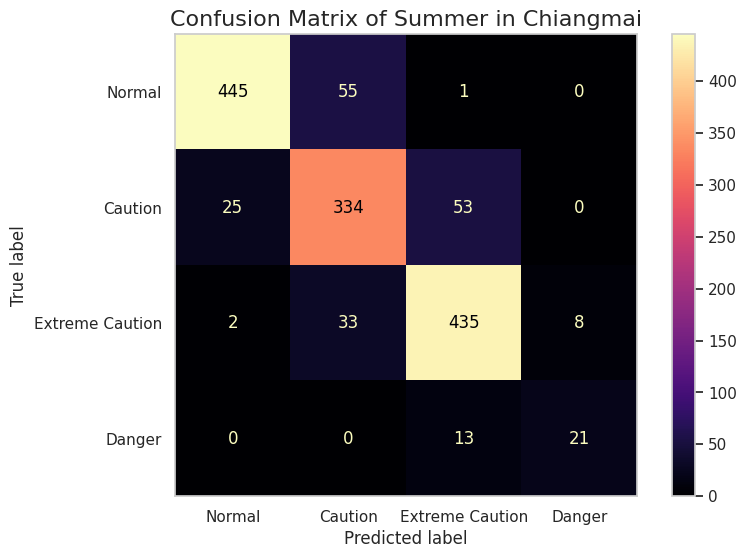

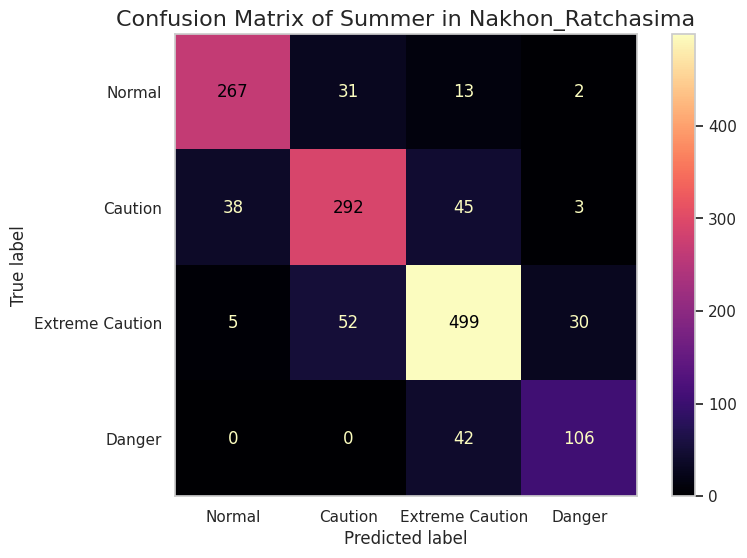

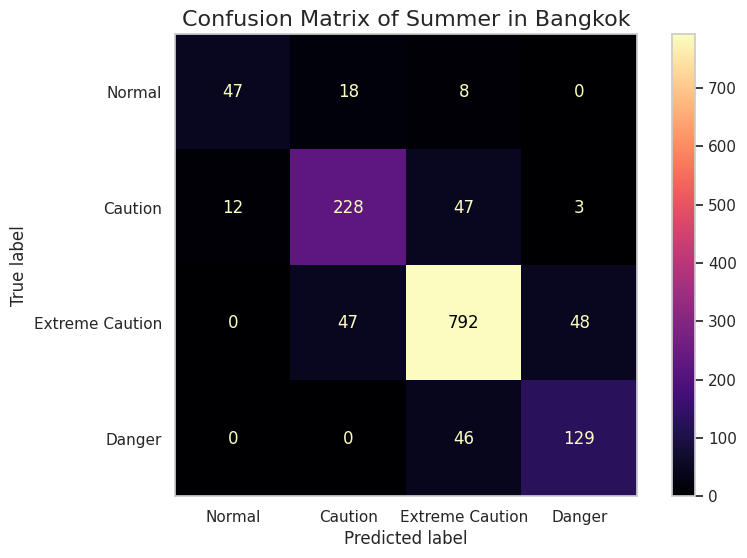

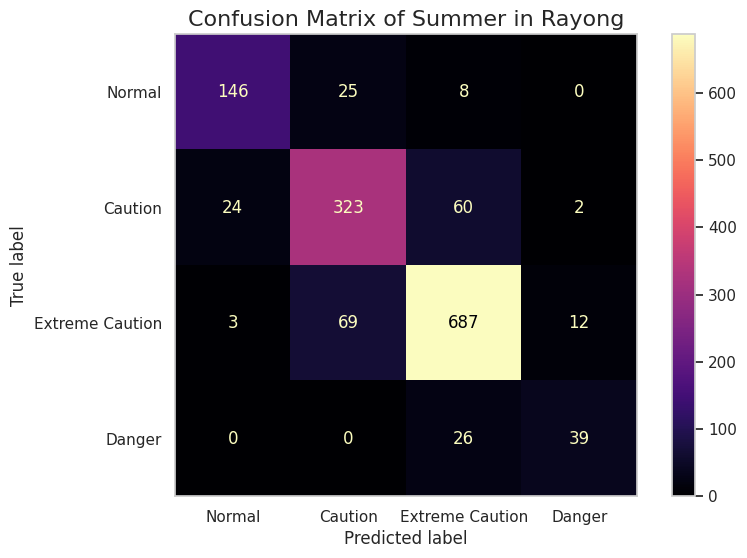

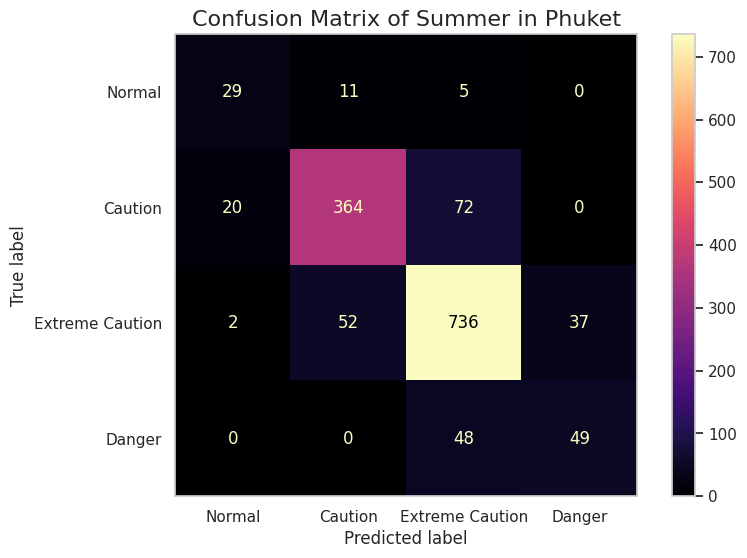

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

for province_name in data['Province'].unique():
    for season in ['Summer']:
        predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df.csv')
        bins = [-float('inf'), 27, 32, 41, 54, float('inf')]
        labels = ['1', '2', '3', '4', '5']

        # Calculate classification metrics
        y_pred_categorical = pd.cut(predictions_df['Predicted_Values'], bins=bins, labels=labels, right=False)
        y_true_categorical = pd.cut(predictions_df['Actual_Values'], bins=bins, labels=labels, right=False)

        conf_matrix = confusion_matrix(y_true_categorical, y_pred_categorical)

        disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Normal', 'Caution', 'Extreme Caution', 'Danger'])

        # Plot confusion matrix
        fig, ax = plt.subplots(figsize=(9, 6))
        disp.plot(ax=ax, cmap='magma')
        ax.set_title(f'Confusion Matrix of {season} in {province_name}', fontsize=16)
        ax.grid(False)
        plt.savefig(f'{main_save_img}Confusion Matrix/Conf_{season}_{province_name}.jpeg')
        plt.show()


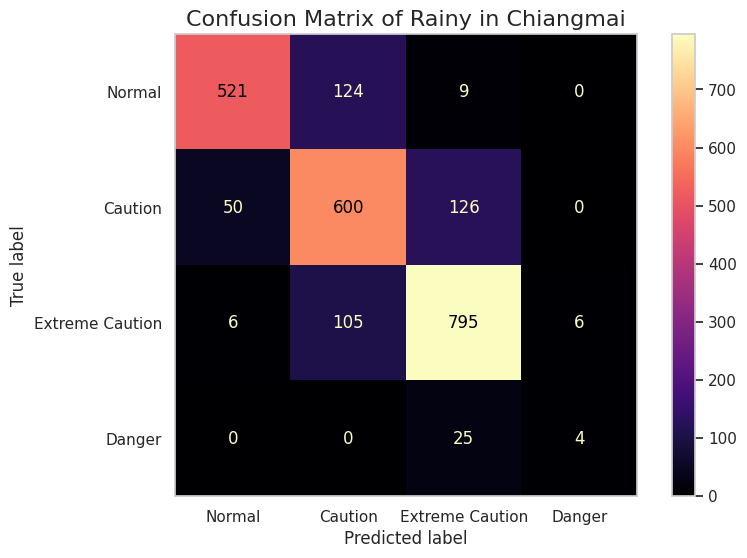

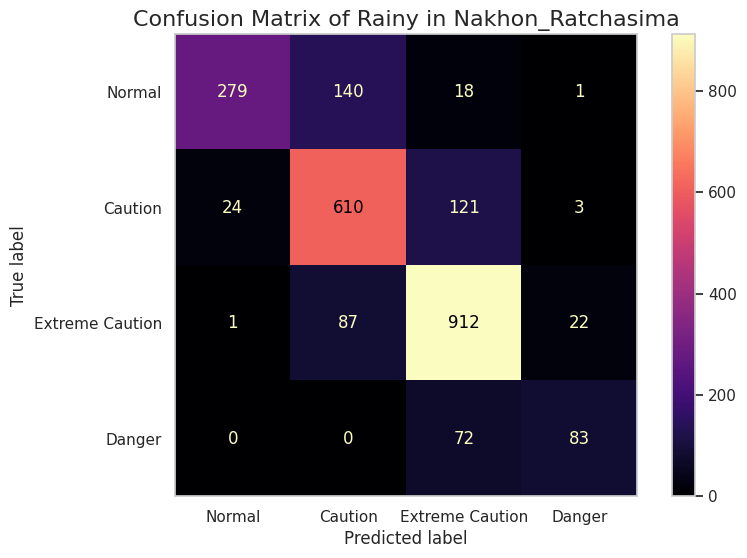

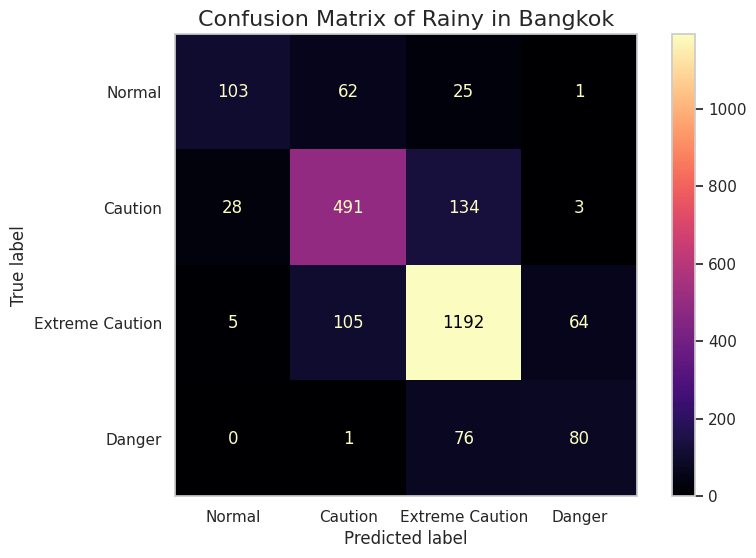

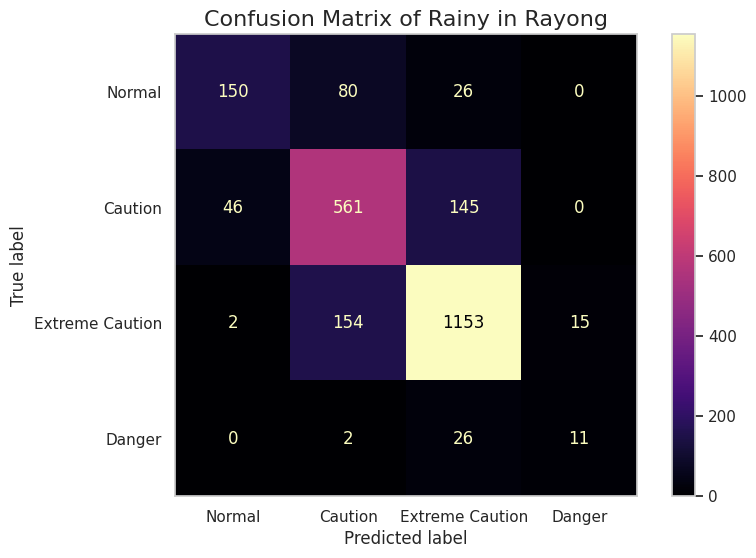

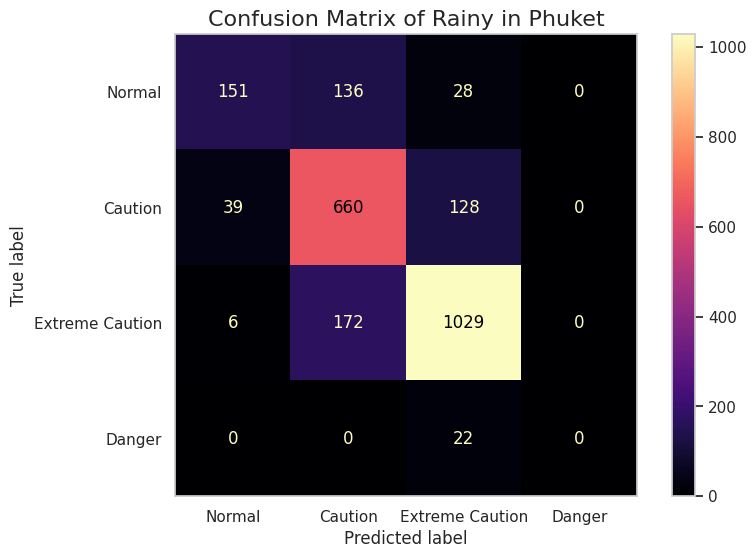

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

for province_name in data['Province'].unique():
    for season in ['Rainy']:
        predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df.csv')
        bins = [-float('inf'), 27, 32, 41, 54, float('inf')]
        labels = ['1', '2', '3', '4', '5']

        # Calculate classification metrics
        y_pred_categorical = pd.cut(predictions_df['Predicted_Values'], bins=bins, labels=labels, right=False)
        y_true_categorical = pd.cut(predictions_df['Actual_Values'], bins=bins, labels=labels, right=False)

        conf_matrix = confusion_matrix(y_true_categorical, y_pred_categorical)

        disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Normal', 'Caution', 'Extreme Caution', 'Danger'])

        # Plot confusion matrix
        fig, ax = plt.subplots(figsize=(9, 6))
        disp.plot(ax=ax, cmap='magma')
        ax.set_title(f'Confusion Matrix of {season} in {province_name}', fontsize=16)
        ax.grid(False)
        plt.savefig(f'{main_save_img}Confusion Matrix/Conf_{season}_{province_name}.jpeg')
        plt.show()


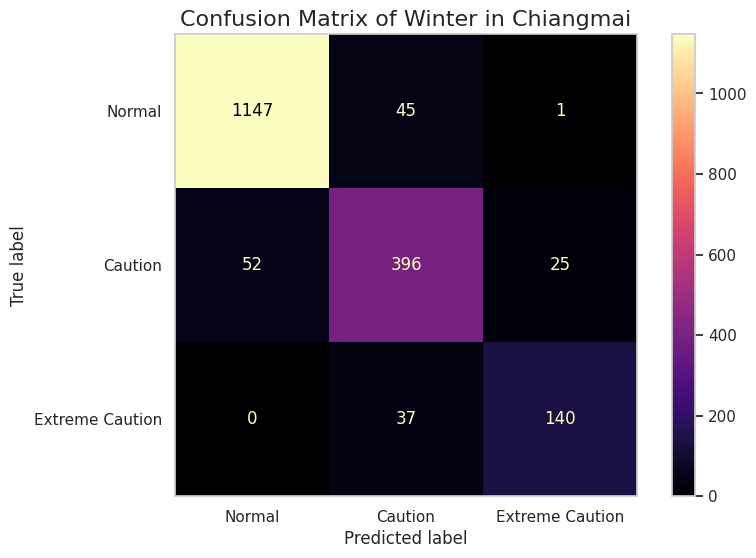

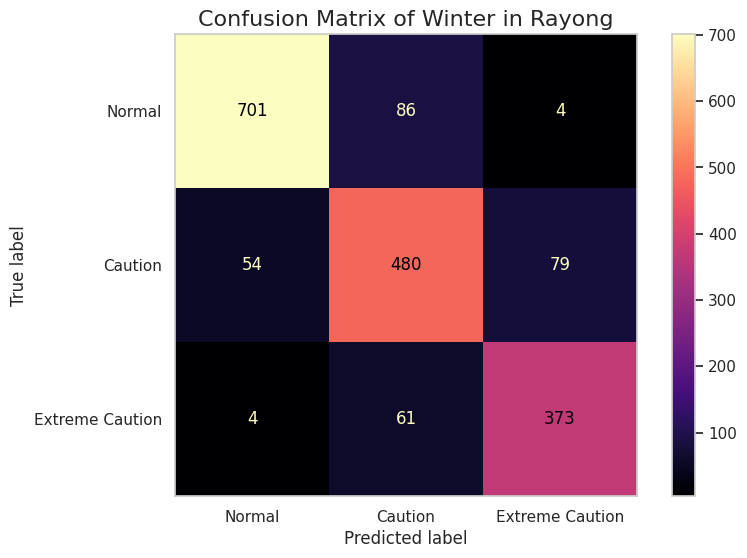

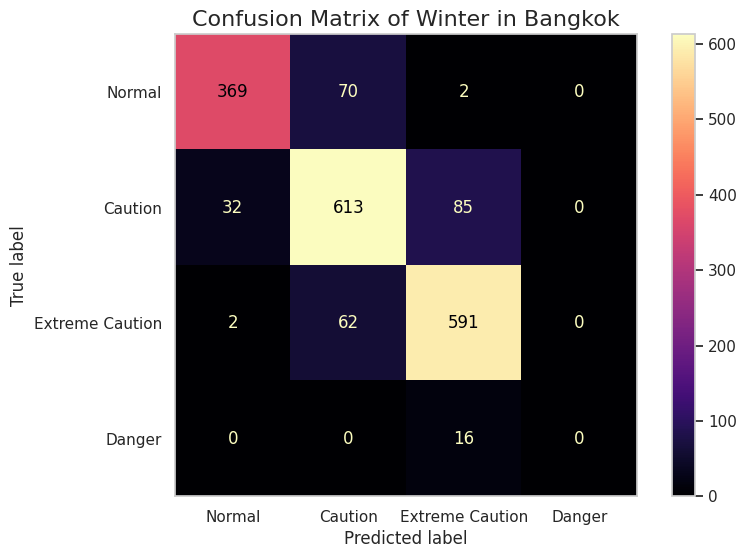

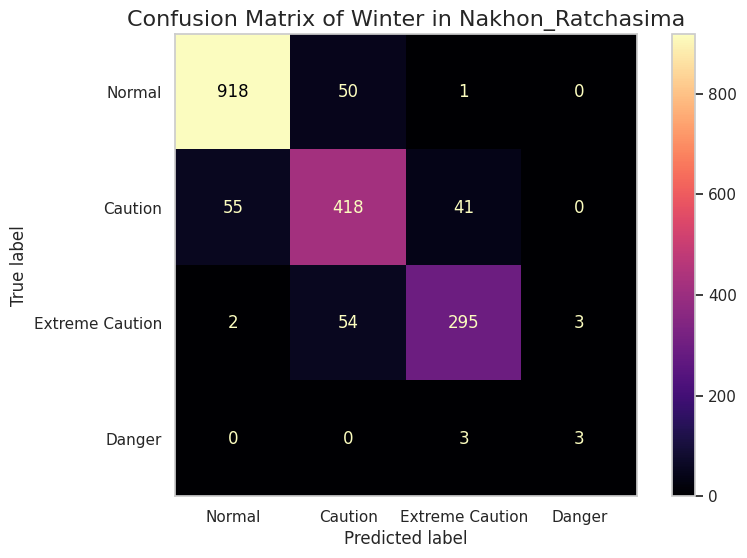

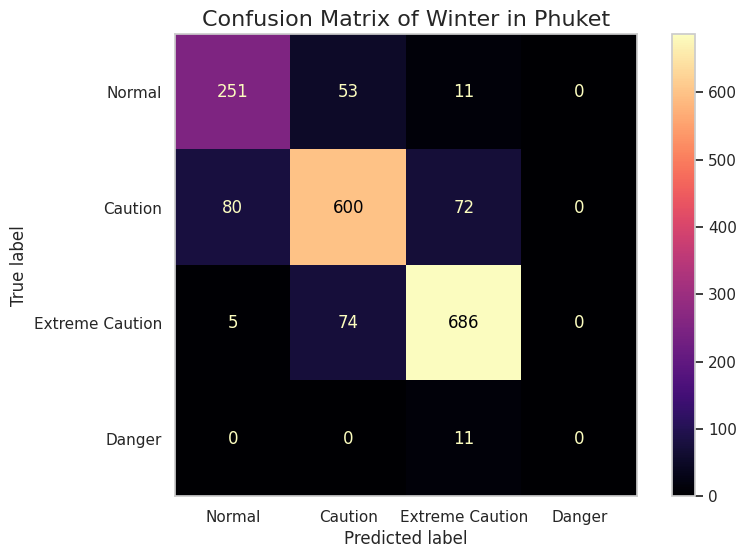

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

for province_name in ['Chiangmai','Rayong']:
    for season in ['Winter']:
        predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df.csv')
        bins = [-float('inf'), 27, 32, 41, 54, float('inf')]
        labels = ['1', '2', '3', '4', '5']

        # Calculate classification metrics
        y_pred_categorical = pd.cut(predictions_df['Predicted_Values'], bins=bins, labels=labels, right=False)
        y_true_categorical = pd.cut(predictions_df['Actual_Values'], bins=bins, labels=labels, right=False)

        conf_matrix = confusion_matrix(y_true_categorical, y_pred_categorical)

        disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Normal', 'Caution', 'Extreme Caution'])

        # Plot confusion matrix
        fig, ax = plt.subplots(figsize=(9, 6))
        disp.plot(ax=ax, cmap='magma')
        ax.set_title(f'Confusion Matrix of {season} in {province_name}', fontsize=16)
        ax.grid(False)
        plt.savefig(f'{main_save_img}Confusion Matrix/Conf_{season}_{province_name}.jpeg')
        plt.show()

for province_name in ['Bangkok','Nakhon_Ratchasima','Phuket']:
    for season in ['Winter']:
        predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df.csv')
        bins = [-float('inf'), 27, 32, 41, 54, float('inf')]
        labels = ['1', '2', '3', '4', '5']

        # Calculate classification metrics
        y_pred_categorical = pd.cut(predictions_df['Predicted_Values'], bins=bins, labels=labels, right=False)
        y_true_categorical = pd.cut(predictions_df['Actual_Values'], bins=bins, labels=labels, right=False)

        conf_matrix = confusion_matrix(y_true_categorical, y_pred_categorical)

        disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=['Normal', 'Caution', 'Extreme Caution', 'Danger'])

        # Plot confusion matrix
        fig, ax = plt.subplots(figsize=(9, 6))
        disp.plot(ax=ax, cmap='magma')
        ax.set_title(f'Confusion Matrix of {season} in {province_name}', fontsize=16)
        ax.grid(False)
        plt.savefig(f'{main_save_img}Confusion Matrix/Conf_{season}_{province_name}.jpeg')
        plt.show()


In [ ]:
season = 'Summer'
province_name = 'Bangkok'

predictions_df = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_{season}_predicted_df.csv')
predictions_df['HI_level'] = pd.cut(predictions_df['Actual_Values'], bins=bins, labels=labels, right=False)
predictions_df


,Datetime,Province,Predicted_Values,Actual_Values,predict_HI_level,HI_level
0,2021-05-15 22:00:00,Bangkok,42.535427,41.973399,4,4
1,2022-02-16 01:00:00,Bangkok,44.819843,44.875133,4,4
2,2022-02-16 04:00:00,Bangkok,37.470837,37.718290,3,3
3,2022-02-16 07:00:00,Bangkok,37.143597,37.016300,3,3
4,2022-02-16 10:00:00,Bangkok,34.232353,33.761421,3,3
...,...,...,...,...,...,...
1420,2023-05-15 10:00:00,Bangkok,27.710207,26.973086,2,1
1421,2023-05-15 13:00:00,Bangkok,42.693730,27.536629,4,2
1422,2023-05-15 16:00:00,Bangkok,30.773308,33.047586,2,3
1423,2023-05-15 19:00:00,Bangkok,41.829777,43.261038,4,4


In [ ]:
province_name = 'Bangkok'

summer = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Summer_predicted_df.csv')
rainy = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Rainy_predicted_df.csv')
winter = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Winter_predicted_df.csv')
chiangmai_predicted = pd.concat([summer,rainy,winter], ignore_index=True)

chiangmai_predicted['Datetime'] = pd.to_datetime(chiangmai_predicted['Datetime'])
chiangmai_predicted = chiangmai_predicted.sort_values('Datetime')
chiangmai_predicted

,Datetime,Province,Predicted_Values,Actual_Values,predict_HI_level
0,2021-05-15 22:00:00,Bangkok,42.535427,41.973399,4
1425,2021-09-11 01:00:00,Bangkok,38.279300,37.730166,3
1426,2021-09-11 04:00:00,Bangkok,42.857320,38.678249,4
1427,2021-09-11 07:00:00,Bangkok,24.472498,25.482070,1
1428,2021-09-11 10:00:00,Bangkok,39.119133,40.688024,3
...,...,...,...,...,...
3790,2023-08-31 22:00:00,Bangkok,30.086372,30.927323,2
3791,2023-09-01 01:00:00,Bangkok,39.620537,39.864758,3
3792,2023-09-01 04:00:00,Bangkok,35.014460,38.955356,3
3793,2023-09-01 07:00:00,Bangkok,31.169014,27.629063,2


In [ ]:
actual_HI_df = pd.concat([summer_df,rainy_df,winter_df], ignore_index=False)
actual_HI_df = actual_HI_df.sort_index()
actual_HI_df = actual_HI_df[actual_HI_df.index < df_resampled.index[0]]
actual_HI_df = actual_HI_df[actual_HI_df.Province == 'Bangkok']
actual_HI_df = actual_HI_df.resample('D').mean()
actual_HI_df

<ipython-input-52-47bac5c17b30>:5: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  actual_HI_df = actual_HI_df.resample('D').mean()


,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
Datetime,,,,,,
2014-01-01,24.2250,62.000,0.000000,0.00,24.907127,1.250
2014-01-02,25.3750,61.250,0.514444,63.75,25.875148,1.375
2014-01-03,25.8375,66.375,0.514444,98.75,25.147263,1.625
2014-01-04,26.3625,67.000,0.385833,58.75,26.205903,1.750
2014-01-05,27.1500,61.500,1.093193,45.00,27.810345,1.750
...,...,...,...,...,...,...
2021-09-26,26.5375,89.000,0.321527,36.25,28.309585,1.875
2021-09-27,28.3875,79.500,0.192917,30.00,31.359835,2.000
2021-09-28,28.5250,77.375,0.578750,62.50,31.957086,2.625


In [ ]:
main_save_img

'/content/drive/My Drive/Senior Project/Coding/Image/'

In [ ]:
for province_name in data.Province.unique():
  for time in ['01','04','07','10','13','16','19','22']:

    sns.set(style="whitegrid")

    summer = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Summer_predicted_df.csv')
    rainy = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Rainy_predicted_df.csv')
    winter = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Winter_predicted_df.csv')

    df_predicted = pd.concat([summer,rainy,winter], ignore_index=True)
    df_predicted['Datetime'] = pd.to_datetime(df_predicted['Datetime'])
    df_predicted = df_predicted.sort_values('Datetime')
    df_predicted.set_index('Datetime', inplace = True)
    df_resampled = df_predicted

    # Selecting rows with time equal to '01:00:00'
    df_resampled = df_resampled.loc[df_resampled.index.strftime('%H:%M:%S') == f'{time}:00:00']
    df_resampled = df_resampled.resample('D').mean()

    # Filtering actual_HI_df for the same time and province
    actual_HI_df = pd.concat([summer_df, rainy_df, winter_df], ignore_index=False)
    actual_HI_df = actual_HI_df.sort_index()
    actual_HI_df = actual_HI_df[actual_HI_df.index < df_resampled.index[0]]
    actual_HI_df = actual_HI_df[actual_HI_df['Province'] == 'Chiangmai']
    actual_HI_df = actual_HI_df[actual_HI_df.index.strftime('%H:%M:%S') == f'{time}:00:00']

    plt.figure(figsize=(16, 6))  # Setting the figure size

    # Plotting actual and predicted values
    sns.lineplot(data=actual_HI_df, x=actual_HI_df.index, y='Heat_Index', label='Actual', color='blue')
    sns.lineplot(data=df_resampled, x=df_resampled.index, y='Predicted_Values', label='Predicted', color='red')

    # Plotting the horizontal lines
    plt.axhline(y=27, color='grey', linestyle='--')
    plt.text(df_resampled.index[-1], 27, 'Caution (> 27°C)', color='black', va='bottom', ha='left')

    plt.axhline(y=32, color='grey', linestyle='--')
    plt.text(df_resampled.index[-1], 32, 'Extreme Caution (> 32°C)', color='black', va='bottom', ha='left')

    plt.axhline(y=41, color='grey', linestyle='--')
    plt.text(df_resampled.index[-1], 41, 'Danger (> 41°C)', color='black', va='bottom', ha='left')

    # Adding labels and title
    plt.xlabel('Date')
    plt.ylabel('Heat Index (°C)')
    plt.title(f'Prediction of Heat Index in {province_name} at {time}:00:00')
    plt.savefig(f'{main_save_img}GraphTS_8Hours/GraphTS_HI_{province_name}_Time{time}.png')

    # Display the plot
    #plt.show()


Output hidden; open in https://colab.research.google.com to view.

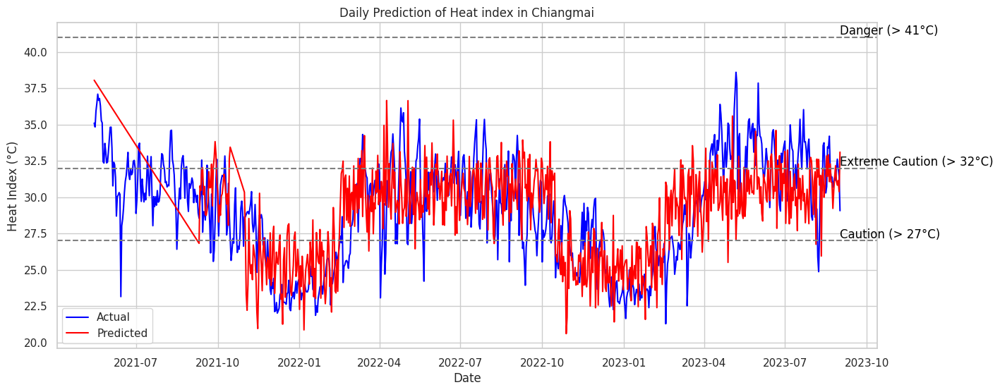

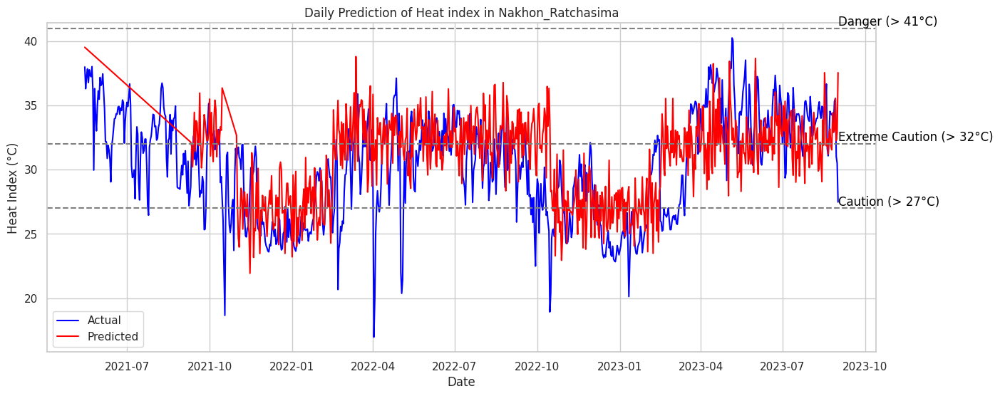

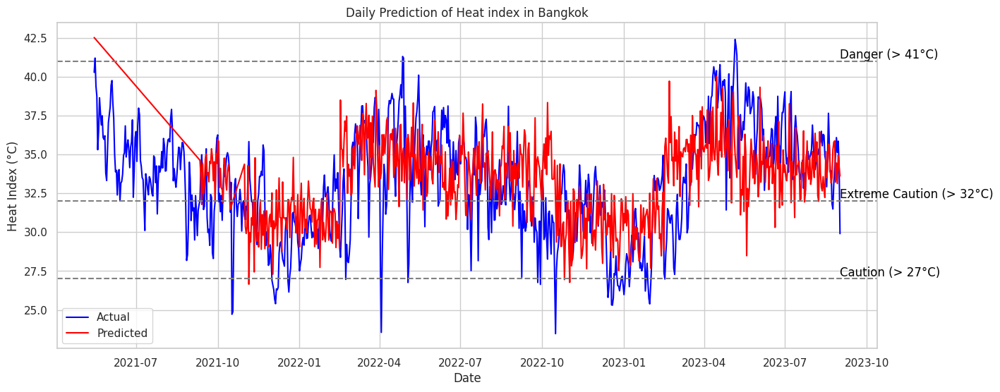

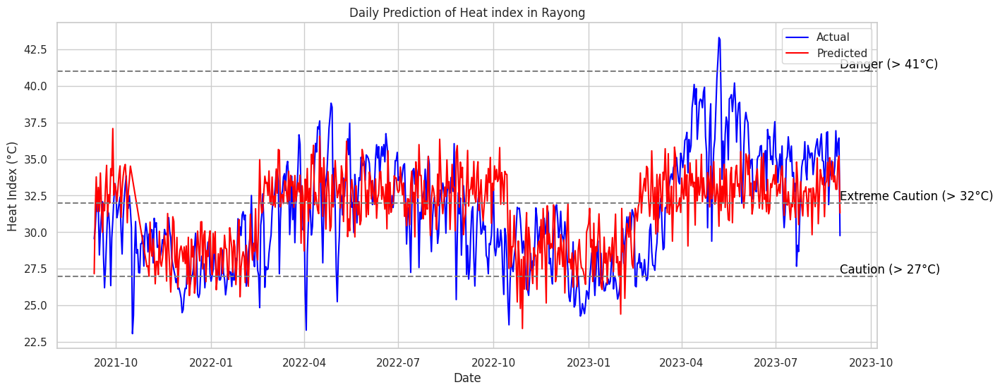

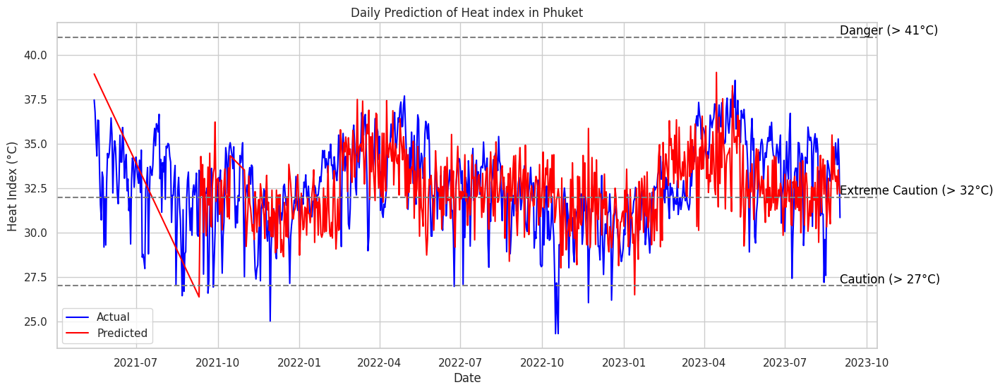

In [ ]:
for province_name in data.Province.unique():

  summer = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Summer_predicted_df.csv')
  rainy = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Rainy_predicted_df.csv')
  winter = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Winter_predicted_df.csv')

  df_predicted = pd.concat([summer,rainy,winter], ignore_index=True)
  df_predicted['Datetime'] = pd.to_datetime(df_predicted['Datetime'])
  df_predicted = df_predicted.sort_values('Datetime')
  df_predicted.set_index('Datetime', inplace = True)
  df_resampled = df_predicted
  #df_resampled = df_resampled[df_resampled.index.strftime('%H:%M:%S') == f'{time}:00:00']
  df_resampled = df_resampled.loc[:,['Predicted_Values']].resample('D').mean()
  df_resampled = df_resampled.iloc[:,:]

  actual_HI_df = pd.concat([summer_df,rainy_df,winter_df], ignore_index=False)
  actual_HI_df = actual_HI_df.sort_index()
  actual_HI_df = actual_HI_df[actual_HI_df.index >= df_resampled.index[0]]
  actual_HI_df = actual_HI_df[actual_HI_df.Province == province_name]
  #actual_HI_df = actual_HI_df[actual_HI_df.index.strftime('%H:%M:%S') == f'{time}:00:00']
  actual_HI_df = actual_HI_df.loc[:,['Heat_Index']].resample('D').mean()

  sns.set(style="whitegrid")  # Setting the style to whitegrid for a clean background
  plt.figure(figsize=(15, 6))  # Setting the figure size

  # Plotting actual and predicted values
  sns.lineplot(data=actual_HI_df, x=actual_HI_df.index, y='Heat_Index', label='Actual', color='blue')
  sns.lineplot(data=df_resampled, x=df_resampled.index, y='Predicted_Values', label='Predicted', color='red')

  # Plotting the horizontal lines
  plt.axhline(y=27, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 27, 'Caution (> 27°C)', color='black', va='bottom', ha='left')

  plt.axhline(y=32, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 32, 'Extreme Caution (> 32°C)', color='black', va='bottom', ha='left')

  plt.axhline(y=41, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 41, 'Danger (> 41°C)', color='black', va='bottom', ha='left')

  # Adding labels and title
  plt.xlabel('Date')
  plt.ylabel('Heat Index (°C)')
  plt.title(f'Daily Prediction of Heat index in {province_name}')
  #plt.show()

  #plt.savefig(f'{main_save_img}GraphTS_daily_HI_{province_name}.png')

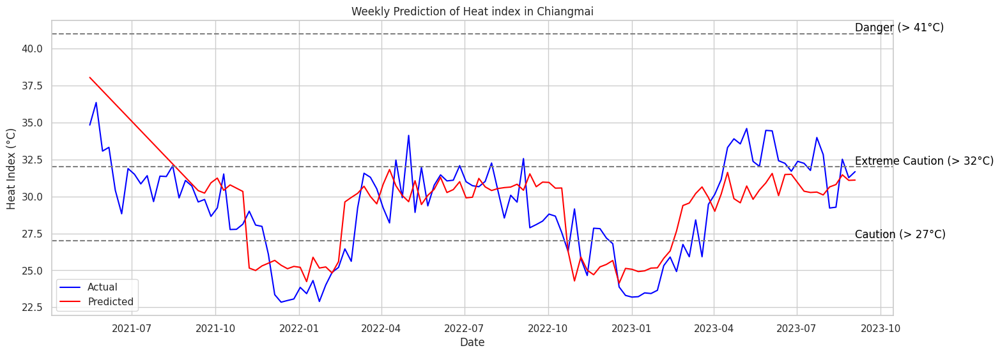

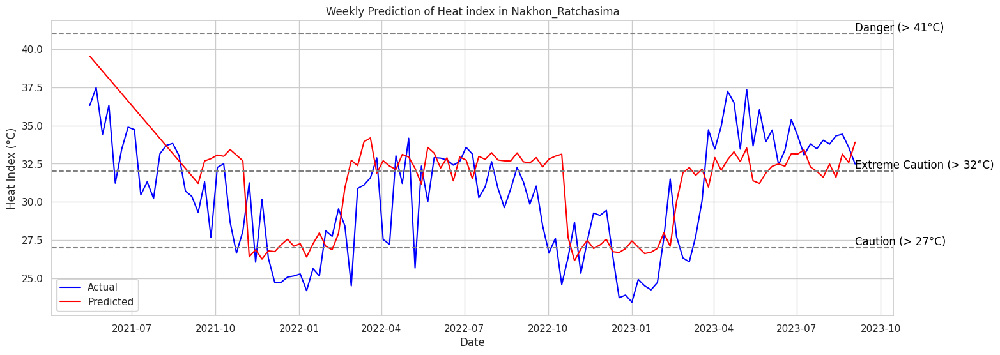

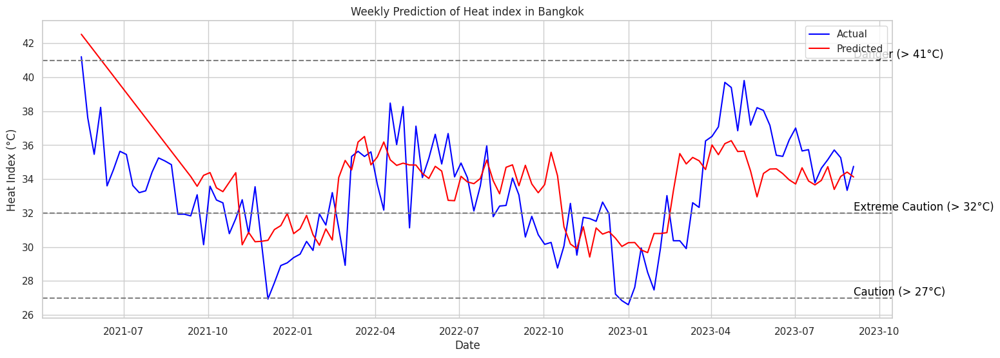

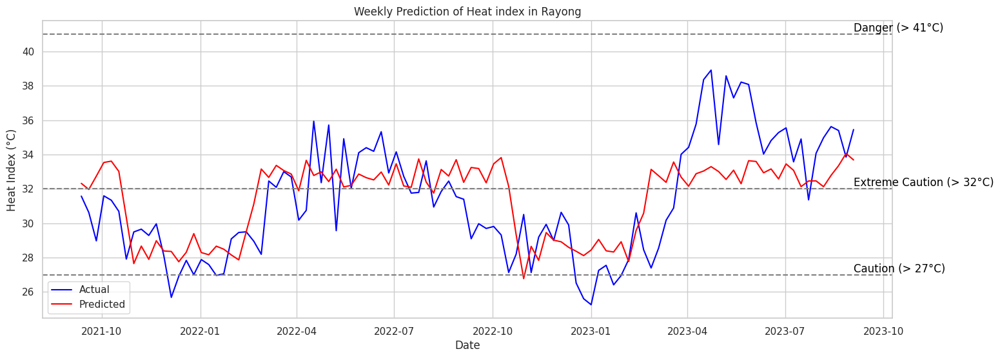

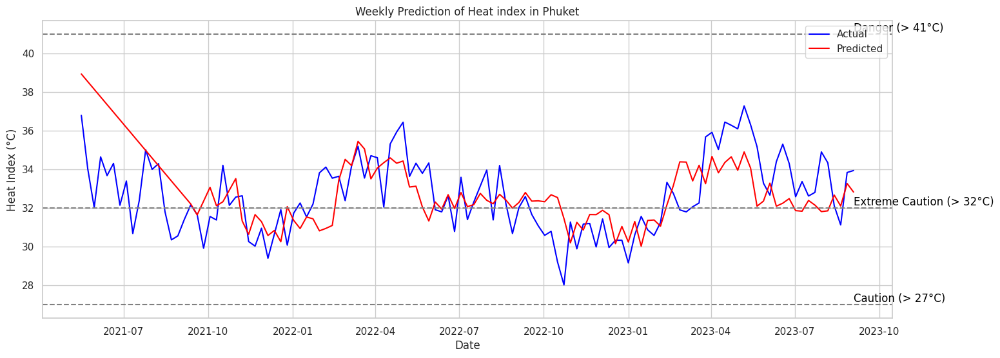

In [ ]:
for province_name in data.Province.unique():

  summer = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Summer_predicted_df.csv')
  rainy = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Rainy_predicted_df.csv')
  winter = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Winter_predicted_df.csv')

  df_predicted = pd.concat([summer,rainy,winter], ignore_index=True)
  df_predicted['Datetime'] = pd.to_datetime(df_predicted['Datetime'])
  df_predicted = df_predicted.sort_values('Datetime')
  df_predicted.set_index('Datetime', inplace = True)
  df_resampled = df_predicted
  #df_resampled = df_resampled[df_resampled.index.strftime('%H:%M:%S') == f'{time}:00:00']
  df_resampled = df_resampled.loc[:,['Predicted_Values']].resample('W').mean()
  df_resampled = df_resampled.iloc[:,:]

  actual_HI_df = pd.concat([summer_df,rainy_df,winter_df], ignore_index=False)
  actual_HI_df = actual_HI_df.sort_index()
  actual_HI_df = actual_HI_df[actual_HI_df.index >= df_resampled.index[0]]
  actual_HI_df = actual_HI_df[actual_HI_df.Province == province_name]
  #actual_HI_df = actual_HI_df[actual_HI_df.index.strftime('%H:%M:%S') == f'{time}:00:00']
  actual_HI_df = actual_HI_df.loc[:,['Heat_Index']].resample('W').mean()

  sns.set(style="whitegrid")  # Setting the style to whitegrid for a clean background

  plt.figure(figsize=(17, 6))  # Setting the figure size
  # Plotting actual and predicted values
  sns.lineplot(data=actual_HI_df, x=actual_HI_df.index, y='Heat_Index', label='Actual', color='blue')
  sns.lineplot(data=df_resampled, x=df_resampled.index, y='Predicted_Values', label='Predicted', color='red')

  # Plotting the horizontal lines
  plt.axhline(y=27, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 27, 'Caution (> 27°C)', color='black', va='bottom', ha='left')

  plt.axhline(y=32, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 32, 'Extreme Caution (> 32°C)', color='black', va='bottom', ha='left')

  plt.axhline(y=41, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 41, 'Danger (> 41°C)', color='black', va='bottom', ha='left')

  # Adding labels and title
  plt.xlabel('Date')
  plt.ylabel('Heat Index (°C)')
  plt.title(f'Weekly Prediction of Heat index in {province_name}')
  #plt.show()

  #plt.savefig(f'{main_save_img}GraphTS_weekly_HI_{province_name}.png')

In [ ]:
summer_df

,Province,Temp,Humid,Wind_Speed,Wind_Direct,Heat_Index,HI_level
Datetime,,,,,,,
2014-02-16 01:00:00,Bangkok,26.5,83.0,1.028888,100.0,28.312124,2
2014-02-16 04:00:00,Bangkok,26.2,85.0,3.601108,200.0,27.739123,2
2014-02-16 07:00:00,Bangkok,26.4,86.0,1.028888,190.0,28.254122,2
2014-02-16 10:00:00,Bangkok,29.2,73.0,2.057776,180.0,33.256010,3
2014-02-16 13:00:00,Bangkok,31.7,61.0,3.086664,220.0,36.214068,3
...,...,...,...,...,...,...,...
2023-05-15 10:00:00,Rayong,31.6,76.0,1.028888,190.0,40.822804,3
2023-05-15 13:00:00,Rayong,33.5,64.0,1.543332,180.0,41.935406,4
2023-05-15 16:00:00,Rayong,33.1,66.0,1.028888,180.0,41.582623,4


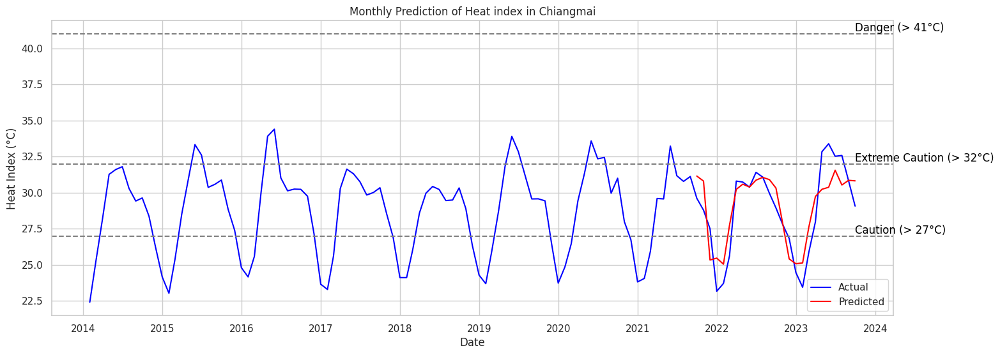

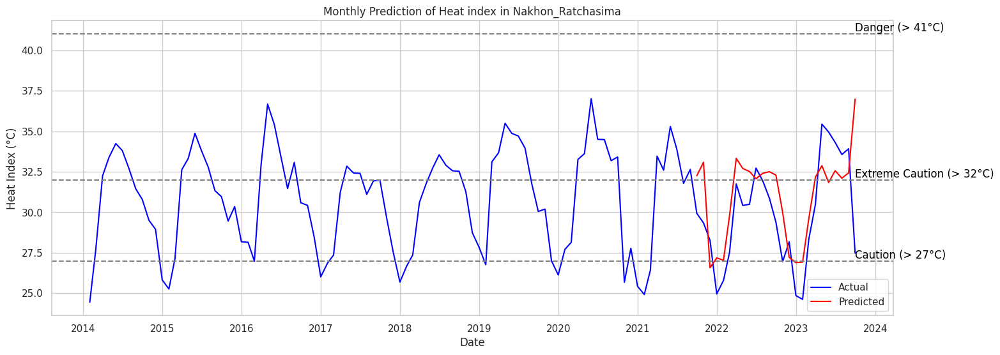

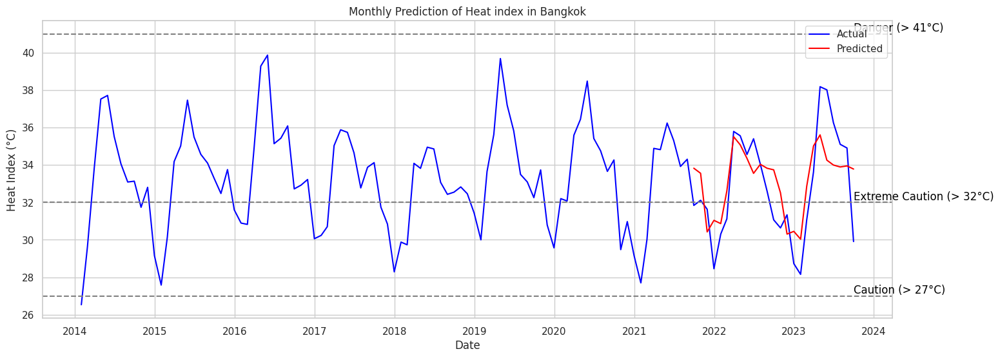

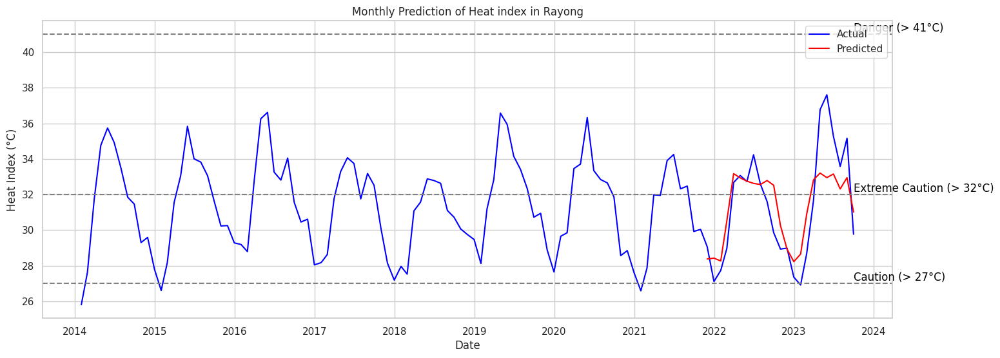

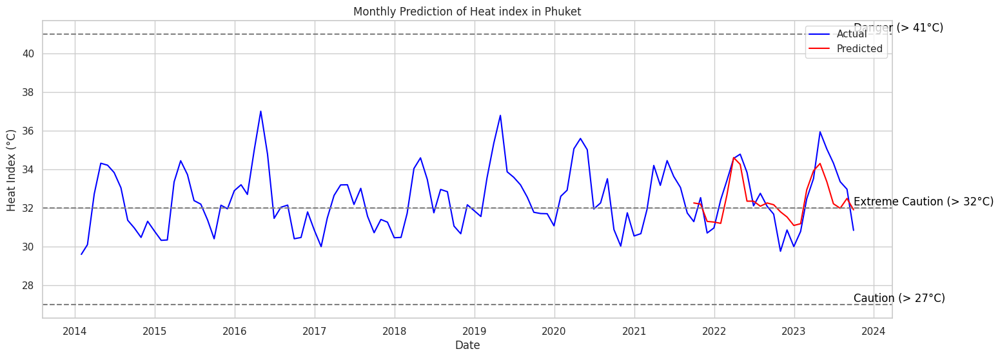

In [ ]:
for province_name in data.Province.unique():

  summer = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Summer_predicted_df_dropWD_mt360.csv')
  rainy = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Rainy_predicted_df_dropWD_mt360.csv')
  winter = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Winter_predicted_df_dropWD_mt360.csv')

  df_predicted = pd.concat([summer,rainy,winter], ignore_index=True)
  df_predicted['Datetime'] = pd.to_datetime(df_predicted['Datetime'])
  df_predicted = df_predicted.sort_values('Datetime')
  df_predicted.set_index('Datetime', inplace = True)
  df_resampled = df_predicted
  #df_resampled = df_resampled[df_resampled.index.strftime('%H:%M:%S') == f'{time}:00:00']
  df_resampled = df_resampled.loc[:,['Predicted_Values']].resample('M').mean()
  df_resampled = df_resampled.iloc[2:,:]

  actual_HI_df = pd.concat([summer_df,rainy_df,winter_df], ignore_index=False)
  actual_HI_df = actual_HI_df.sort_index()
  #actual_HI_df = actual_HI_df[actual_HI_df.index > df_resampled.index[0]]
  actual_HI_df = actual_HI_df[actual_HI_df.Province == province_name]
  #actual_HI_df = actual_HI_df[actual_HI_df.index.strftime('%H:%M:%S') == f'{time}:00:00']
  actual_HI_df = actual_HI_df.loc[:,['Heat_Index']].resample('M').mean()

  sns.set(style="whitegrid")  # Setting the style to whitegrid for a clean background
  plt.figure(figsize=(17, 6))  # Setting the figure size

  # Plotting actual and predicted values
  sns.lineplot(data=actual_HI_df, x=actual_HI_df.index, y='Heat_Index', label='Actual', color='blue')
  sns.lineplot(data=df_resampled, x=df_resampled.index, y='Predicted_Values', label='Predicted', color='red')

  # Plotting the horizontal lines
  plt.axhline(y=27, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 27, 'Caution (> 27°C)', color='black', va='bottom', ha='left')

  plt.axhline(y=32, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 32, 'Extreme Caution (> 32°C)', color='black', va='bottom', ha='left')

  plt.axhline(y=41, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 41, 'Danger (> 41°C)', color='black', va='bottom', ha='left')

  # Adding labels and title
  plt.xlabel('Date')
  plt.ylabel('Heat Index (°C)')
  plt.title(f'Monthly Prediction of Heat index in {province_name}')
  plt.show()

  plt.savefig(f'{main_save_img}GraphTS_monthly_HI_{province_name}.png')

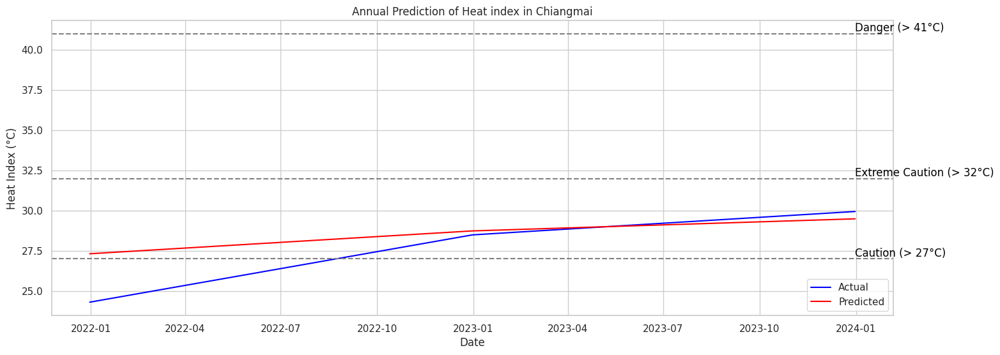

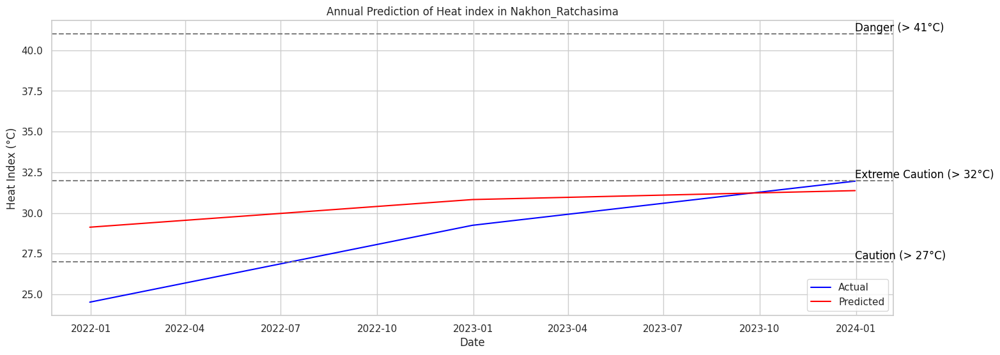

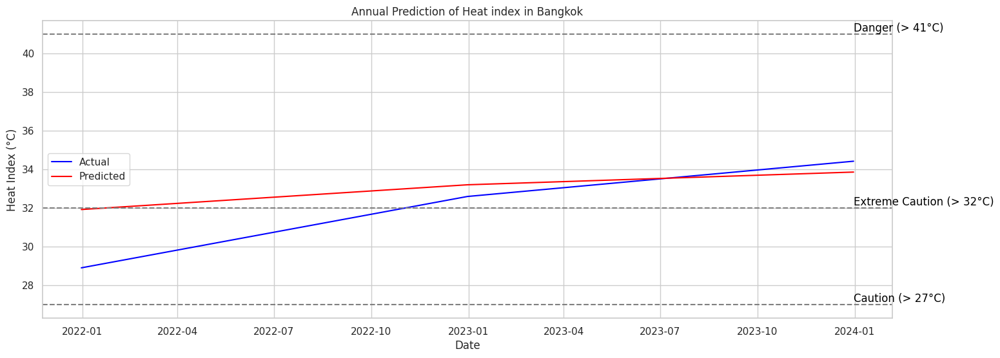

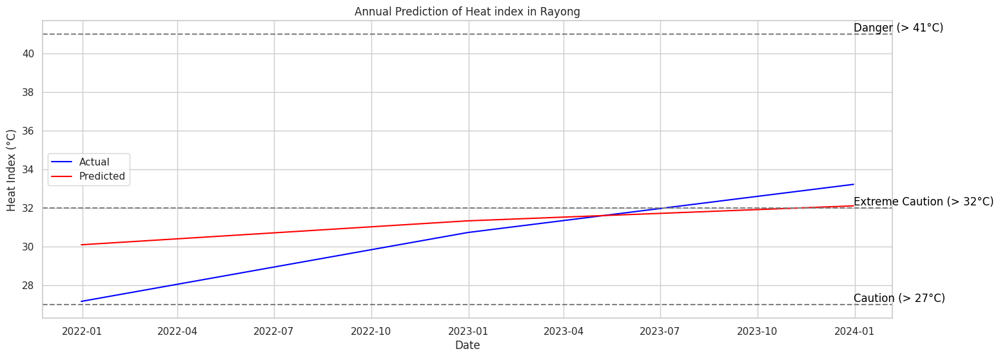

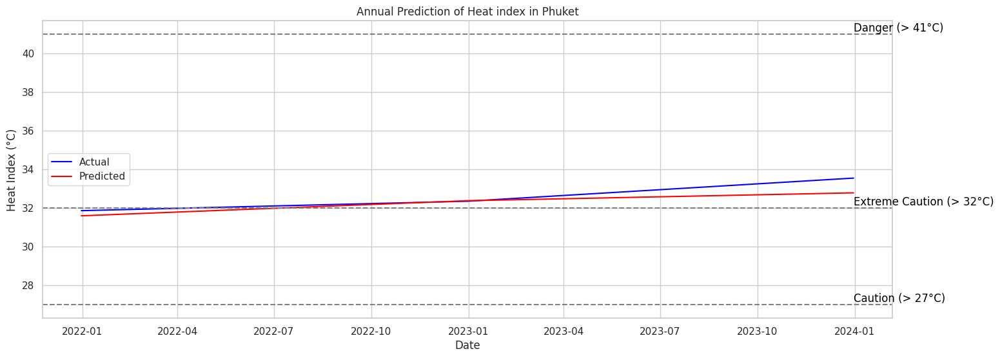

In [ ]:
for province_name in data.Province.unique():

  summer = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Summer_predicted_df.csv')
  rainy = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Rainy_predicted_df.csv')
  winter = pd.read_csv(f'{main_path_data}predictions_df/{province_name}_Winter_predicted_df.csv')

  df_predicted = pd.concat([summer,rainy,winter], ignore_index=True)
  df_predicted['Datetime'] = pd.to_datetime(df_predicted['Datetime'])
  df_predicted = df_predicted.sort_values('Datetime')
  df_predicted.set_index('Datetime', inplace = True)
  df_resampled = df_predicted
  #df_resampled = df_resampled[df_resampled.index.strftime('%H:%M:%S') == f'{time}:00:00']
  df_resampled = df_resampled.loc[:,['Predicted_Values']].resample('A').mean()
  df_resampled = df_resampled.iloc[:,:]

  actual_HI_df = pd.concat([summer_df,rainy_df,winter_df], ignore_index=False)
  actual_HI_df = actual_HI_df.sort_index()
  actual_HI_df = actual_HI_df[actual_HI_df.index >= df_resampled.index[0]]
  actual_HI_df = actual_HI_df[actual_HI_df.Province == province_name]
  #actual_HI_df = actual_HI_df[actual_HI_df.index.strftime('%H:%M:%S') == f'{time}:00:00']
  actual_HI_df = actual_HI_df.loc[:,['Heat_Index']].resample('A').mean()

  sns.set(style="whitegrid")  # Setting the style to whitegrid for a clean background
  plt.figure(figsize=(17, 6))  # Setting the figure size

  # Plotting actual and predicted values
  sns.lineplot(data=actual_HI_df, x=actual_HI_df.index, y='Heat_Index', label='Actual', color='blue')
  sns.lineplot(data=df_resampled, x=df_resampled.index, y='Predicted_Values', label='Predicted', color='red')

  # Plotting the horizontal lines
  plt.axhline(y=27, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 27, 'Caution (> 27°C)', color='black', va='bottom', ha='left')

  plt.axhline(y=32, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 32, 'Extreme Caution (> 32°C)', color='black', va='bottom', ha='left')

  plt.axhline(y=41, color='grey', linestyle='--')
  plt.text(df_resampled.index[-1], 41, 'Danger (> 41°C)', color='black', va='bottom', ha='left')

  # Adding labels and title
  plt.xlabel('Date')
  plt.ylabel('Heat Index (°C)')
  plt.title(f'Annual Prediction of Heat index in {province_name}')
  plt.show()

  #plt.savefig(f'{main_save_img}GraphTS_annual_HI_{province_name}.png')


| Category | Heat Index	| Possible heat disorders |
|----------|------------|-------------------------|
|Caution |27 - 32°C|	Fatigue possible with prolonged exposure and/or physical activity.|
|Extreme Caution|32 - 41°C|Sunstroke, muscle cramps, and/or heat exhaustion possible with prolonged exposure and/or physical activity.|
|Danger	|41 - 54°C|	Sunstroke, muscle cramps, and/or heat exhaustion likely.| Heatstroke possible with prolonged exposure and/or physical activity.|
|Extreme Danger|54°C or higher|	Heat stroke or sunstroke likely.|